In [ ]:
# !rm -rf results

# 1- Ablations Study on CIFAR-10

100%|██████████| 170M/170M [00:03<00:00, 44.4MB/s]



🚀 Running Ablation: Default (β₃=0.9)
   Configuration: {'lr': 0.001, 'betas': (0.9, 0.999, 0.9), 'eps': 1e-08, 'weight_decay': 0.01}
Starting training for 'Default (β₃=0.9)' on cuda...
Epoch 1/10 | Train Loss: 1.5767, Acc: 0.4196 | Val Loss: 1.5728, Acc: 0.4576 | Time: 34.57s
Epoch 2/10 | Train Loss: 1.0816, Acc: 0.6073 | Val Loss: 1.0825, Acc: 0.6230 | Time: 24.70s
Epoch 3/10 | Train Loss: 0.8595, Acc: 0.6960 | Val Loss: 0.8804, Acc: 0.6996 | Time: 24.34s
Epoch 4/10 | Train Loss: 0.7015, Acc: 0.7506 | Val Loss: 0.8108, Acc: 0.7256 | Time: 23.85s
Epoch 5/10 | Train Loss: 0.5838, Acc: 0.7959 | Val Loss: 0.6055, Acc: 0.7848 | Time: 24.58s
Epoch 6/10 | Train Loss: 0.4952, Acc: 0.8277 | Val Loss: 0.5637, Acc: 0.8008 | Time: 24.71s
Epoch 7/10 | Train Loss: 0.4254, Acc: 0.8507 | Val Loss: 0.4729, Acc: 0.8380 | Time: 24.53s
Epoch 8/10 | Train Loss: 0.3645, Acc: 0.8733 | Val Loss: 0.4375, Acc: 0.8472 | Time: 24.49s
Epoch 9/10 | Train Loss: 0.3219, Acc: 0.8877 | Val Loss: 0.3974, Acc: 0.8616 |

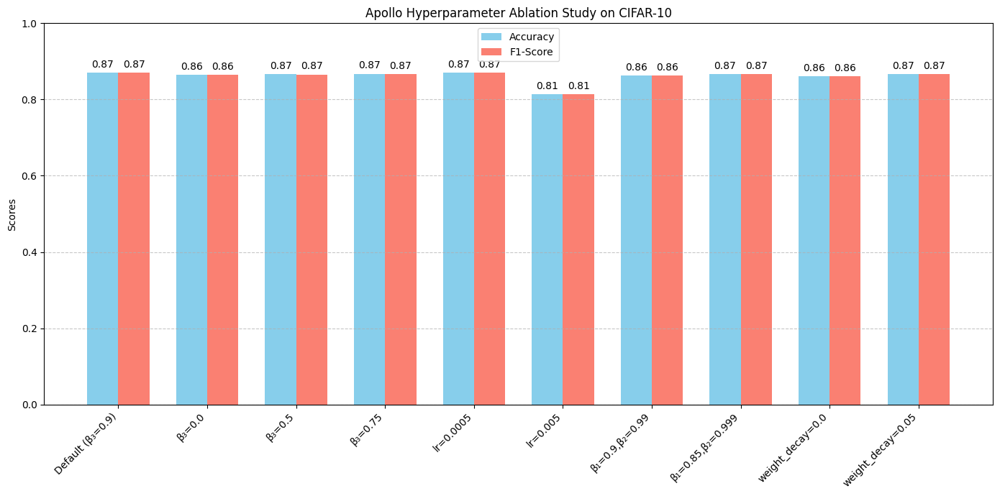

In [1]:
# Ablation Study for Apollo on CIFAR-10

import os
import time
import random
import contextlib
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F  # For F.cosine_similarity
from torch.optim import Optimizer
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, random_split
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score
import matplotlib.pyplot as plt

# ---------- Global Performance Knobs ----------
USE_AMP = torch.cuda.is_available()  # Use mixed precision if CUDA is available
CHANNELS_LAST = True               # Use NHWC memory format on CUDA for performance
AUTO_BENCHMARK = True              # Enable cudnn.benchmark for fixed-size inputs
MATMUL_PRECISION = "high"          # Set matmul precision on Ampere+ GPUs

def set_seed(seed=42):
    """Sets the seed for reproducibility."""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = False
        torch.backends.cudnn.benchmark = AUTO_BENCHMARK
        try:
            torch.set_float32_matmul_precision(MATMUL_PRECISION)
        except AttributeError:
            print("Warning: torch.set_float32_matmul_precision is not available.")

set_seed(42)

# ---------------------------
# Apollo Optimizer Implementation
# ---------------------------
class Apollo(Optimizer):
    """
    Implements the Apollo (Adaptive Policy for Optimizer-space Linear Linking) algorithm.
    """
    def __init__(self, params, lr=1e-3, betas=(0.9, 0.999, 0.9), eps=1e-8,
                 weight_decay=1e-2):
        if not 0.0 <= lr: raise ValueError(f"Invalid learning rate: {lr}")
        if not 0.0 <= eps: raise ValueError(f"Invalid epsilon value: {eps}")
        if not 0.0 <= betas[0] < 1.0: raise ValueError(f"Invalid beta_1: {betas[0]}")
        if not 0.0 <= betas[1] < 1.0: raise ValueError(f"Invalid beta_2: {betas[1]}")
        if not 0.0 <= betas[2] < 1.0: raise ValueError(f"Invalid beta_3 for adaptation: {betas[2]}")
        if not 0.0 <= weight_decay: raise ValueError(f"Invalid weight_decay value: {weight_decay}")

        defaults = dict(lr=lr, betas=betas, eps=eps, weight_decay=weight_decay)
        super(Apollo, self).__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()

        for group in self.param_groups:
            beta1, beta2, beta3 = group['betas']

            for p in group['params']:
                if p.grad is None: continue
                grad = p.grad
                if grad.is_sparse: raise RuntimeError('Apollo does not support sparse gradients.')

                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['exp_avg'] = torch.zeros_like(p, memory_format=torch.preserve_format)
                    state['exp_avg_sq'] = torch.zeros_like(p, memory_format=torch.preserve_format)
                    state['update_agreement'] = torch.zeros((), device=p.device)

                exp_avg, exp_avg_sq = state['exp_avg'], state['exp_avg_sq']
                state['step'] += 1

                # Decoupled weight decay
                if group['weight_decay'] != 0:
                    p.add_(p, alpha=-group['weight_decay'] * group['lr'])

                # Update biased moments
                exp_avg.mul_(beta1).add_(grad, alpha=1 - beta1)
                exp_avg_sq.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)

                # Bias correction
                bias_correction1 = 1 - beta1 ** state['step']
                bias_correction2 = 1 - beta2 ** state['step']

                m_hat = exp_avg / bias_correction1
                v_hat = exp_avg_sq / bias_correction2

                # Candidate updates
                denom = v_hat.sqrt().add_(group['eps'])
                update_adam = m_hat / denom
                update_lion = torch.sign(m_hat)

                # Cosine similarity
                cos_sim = F.cosine_similarity(update_adam.flatten(), update_lion.flatten(), dim=0, eps=1e-10)

                # Smooth
                state['update_agreement'].mul_(beta3).add_(cos_sim, alpha=1 - beta3)

                # Dynamic gamma
                gamma = (state['update_agreement'] + 1) / 2.0

                final_update = (1 - gamma) * update_adam + gamma * update_lion

                p.add_(final_update, alpha=-group['lr'])

        return loss

# ---------------------------
# Data Loading
# ---------------------------
def get_cifar10_loaders(batch_size=128, data_root="./data"):
    cores = os.cpu_count() or 2
    num_workers = min(8, max(2, cores // 2))

    transform_train = transforms.Compose([
        transforms.RandomCrop(32, padding=4),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize((0.4914, 0.4822, 0.4465), (0.247, 0.243, 0.261)),
    ])
    transform_test = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.4914, 0.4822, 0.4465), (0.247, 0.243, 0.261)),
    ])

    train_full = datasets.CIFAR10(root=data_root, train=True, download=True, transform=transform_train)
    testset = datasets.CIFAR10(root=data_root, train=False, download=True, transform=transform_test)

    trainset, valset = random_split(train_full, [45000, 5000])

    loader_kwargs = dict(num_workers=num_workers, pin_memory=True, persistent_workers=True if num_workers > 0 else False)
    train_loader = DataLoader(trainset, batch_size=batch_size, shuffle=True, **loader_kwargs)
    val_loader = DataLoader(valset, batch_size=batch_size, shuffle=False, **loader_kwargs)
    test_loader = DataLoader(testset, batch_size=batch_size, shuffle=False, **loader_kwargs)
    return train_loader, val_loader, test_loader

# ---------------------------
# Model Definition
# ---------------------------
def get_resnet18_cifar():
    model = models.resnet18(weights=None, num_classes=10)
    model.conv1 = nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1, bias=False)
    model.maxpool = nn.Identity()
    return model

# ---------------------------
# Training and Evaluation Loop
# ---------------------------
def train_model(model_fn, optimizer_factory, train_loader, val_loader, test_loader,
                num_epochs=10, run_name="default"):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model_fn()
    if CHANNELS_LAST and device.type == "cuda":
        model = model.to(device, memory_format=torch.channels_last)
    else:
        model = model.to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = optimizer_factory(model.parameters())

    scaler = torch.amp.GradScaler('cuda', enabled=USE_AMP)
    autocast_ctx = lambda: torch.amp.autocast(device_type=device.type, enabled=USE_AMP)

    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)

    metrics = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': []}
    overall_start_time = time.time()

    print(f"Starting training for '{run_name}' on {device}...")

    for epoch in range(num_epochs):
        epoch_start = time.time()
        model.train()
        train_loss, train_correct, train_total = 0.0, 0, 0
        for data, targets in train_loader:
            data, targets = data.to(device, non_blocking=True), targets.to(device, non_blocking=True)
            if CHANNELS_LAST and device.type == "cuda":
                data = data.to(memory_format=torch.channels_last)

            optimizer.zero_grad(set_to_none=True)
            with autocast_ctx():
                outputs = model(data)
                loss = criterion(outputs, targets)

            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()

            train_loss += loss.item() * data.size(0)
            _, predicted = outputs.max(1)
            train_total += targets.size(0)
            train_correct += predicted.eq(targets).sum().item()

        metrics['train_loss'].append(train_loss / train_total)
        metrics['train_acc'].append(train_correct / train_total)

        # Validation
        model.eval()
        val_loss, val_correct, val_total = 0.0, 0, 0
        with torch.no_grad():
            for data, targets in val_loader:
                data, targets = data.to(device, non_blocking=True), targets.to(device, non_blocking=True)
                if CHANNELS_LAST and device.type == "cuda":
                    data = data.to(memory_format=torch.channels_last)
                with autocast_ctx():
                    outputs = model(data)
                    loss = criterion(outputs, targets)
                val_loss += loss.item() * data.size(0)
                _, predicted = outputs.max(1)
                val_total += targets.size(0)
                val_correct += predicted.eq(targets).sum().item()

        metrics['val_loss'].append(val_loss / val_total)
        metrics['val_acc'].append(val_correct / val_total)

        scheduler.step()

        print(f"Epoch {epoch+1}/{num_epochs} | "
              f"Train Loss: {metrics['train_loss'][-1]:.4f}, Acc: {metrics['train_acc'][-1]:.4f} | "
              f"Val Loss: {metrics['val_loss'][-1]:.4f}, Acc: {metrics['val_acc'][-1]:.4f} | "
              f"Time: {time.time() - epoch_start:.2f}s")

    # Final Test Evaluation
    model.eval()
    test_loss, test_correct, test_total = 0.0, 0, 0
    all_probs, all_targets = [], []
    with torch.no_grad():
        for data, targets in test_loader:
            data, targets = data.to(device, non_blocking=True), targets.to(device, non_blocking=True)
            if CHANNELS_LAST and device.type == "cuda":
                data = data.to(memory_format=torch.channels_last)
            outputs = model(data)
            loss = criterion(outputs, targets)
            test_loss += loss.item() * data.size(0)
            _, predicted = outputs.max(1)
            test_total += targets.size(0)
            test_correct += predicted.eq(targets).sum().item()
            all_probs.extend(torch.softmax(outputs, dim=1).cpu().numpy())
            all_targets.extend(targets.cpu().numpy())

    final_metrics = {
        'test_acc': test_correct / test_total,
        'test_loss': test_loss / test_total,
        'avg_epoch_time': (time.time() - overall_start_time) / num_epochs
    }

    preds = np.argmax(all_probs, axis=1)
    final_metrics['test_precision'] = precision_score(all_targets, preds, average='macro', zero_division=0)
    final_metrics['test_recall'] = recall_score(all_targets, preds, average='macro', zero_division=0)
    final_metrics['test_f1'] = f1_score(all_targets, preds, average='macro', zero_division=0)
    final_metrics['test_auc'] = roc_auc_score(all_targets, all_probs, multi_class='ovr')

    print(f"Test Results ({run_name}): Acc: {final_metrics['test_acc']:.4f}, F1: {final_metrics['test_f1']:.4f}")
    return {**metrics, **final_metrics}

# ---------------------------
# Ablation Study Setup
# ---------------------------
def get_ablated_hyperparams_apollo():
    default_cfg = {
        'lr': 1e-3,
        'betas': (0.9, 0.999, 0.9),
        'eps': 1e-8,
        'weight_decay': 1e-2,
    }
    hyperparams = {}

    hyperparams["Default (β₃=0.9)"] = default_cfg.copy()

    for beta3 in [0.0, 0.5, 0.75]:
        cfg = default_cfg.copy()
        cfg['betas'] = (default_cfg['betas'][0], default_cfg['betas'][1], beta3)
        hyperparams[f"β₃={beta3}"] = cfg

    for lr in [5e-4, 5e-3]:
        cfg = default_cfg.copy()
        cfg['lr'] = lr
        hyperparams[f"lr={lr}"] = cfg

    for betas in [(0.9, 0.99), (0.85, 0.999)]:
        cfg = default_cfg.copy()
        cfg['betas'] = (betas[0], betas[1], default_cfg['betas'][2])
        hyperparams[f"β₁={betas[0]},β₂={betas[1]}"] = cfg

    for wd in [0.0, 5e-2]:
        cfg = default_cfg.copy()
        cfg['weight_decay'] = wd
        hyperparams[f"weight_decay={wd}"] = cfg

    return hyperparams

def run_ablation_study(num_epochs=15, batch_size=256):
    train_loader, val_loader, test_loader = get_cifar10_loaders(batch_size=batch_size)
    hyperparams = get_ablated_hyperparams_apollo()
    all_metrics = {}

    for name, cfg in hyperparams.items():
        print("\n" + "="*80)
        print(f"🚀 Running Ablation: {name}")
        print(f"   Configuration: {cfg}")
        print("="*80)

        optimizer_factory = lambda params: Apollo(params, **cfg)
        metrics = train_model(get_resnet18_cifar, optimizer_factory,
                              train_loader, val_loader, test_loader,
                              num_epochs=num_epochs, run_name=name)
        all_metrics[name] = metrics

    print("\n" + "#"*80)
    print(" " * 28 + "Apollo Ablation Study Results")
    print("#"*80)

    best_config_name = max(all_metrics, key=lambda k: all_metrics[k]['test_acc'])
    best_metrics = all_metrics[best_config_name]
    print(f"\n🏆 Best Configuration: '{best_config_name}'")
    print(f"   - Accuracy:  {best_metrics['test_acc']:.4f}")
    print(f"   - F1-Score:  {best_metrics['test_f1']:.4f}")
    print(f"   - AUC:       {best_metrics['test_auc']:.4f}")

    print("\n" + "-"*40)
    print("LaTeX Table Summary:")
    print("-"*40)
    print(r"\begin{tabular}{lcccc}")
    print(r"\toprule")
    print(r"\textbf{Configuration} & \textbf{Accuracy} & \textbf{F1-Score} & \textbf{AUC} & \textbf{Time/Epoch} \\")
    print(r"\midrule")

    sorted_names = sorted(all_metrics.keys(), key=lambda k: all_metrics[k]['test_acc'], reverse=True)
    for name in sorted_names:
        metrics = all_metrics[name]
        acc_str = r"\textbf{" + f"{metrics['test_acc']:.4f}" + "}" if name == best_config_name else f"{metrics['test_acc']:.4f}"
        # Fixed version - properly escaped LaTeX
        print(
            name.replace('_', ' ').replace('β', r'$\beta$') + " & " +
            acc_str + " & " +
            f"{metrics['test_f1']:.4f} & " +
            f"{metrics['test_auc']:.4f} & " +
            f"{metrics['avg_epoch_time']:.2f}s" + r" \\"
        )

    print(r"\bottomrule")
    print(r"\end{tabular}")

    labels = list(all_metrics.keys())
    acc_values = [all_metrics[k]['test_acc'] for k in labels]
    f1_values = [all_metrics[k]['test_f1'] for k in labels]

    x = np.arange(len(labels))
    width = 0.35

    fig, ax = plt.subplots(figsize=(14, 7))
    rects1 = ax.bar(x - width/2, acc_values, width, label='Accuracy', color='skyblue')
    rects2 = ax.bar(x + width/2, f1_values, width, label='F1-Score', color='salmon')

    ax.set_ylabel('Scores')
    ax.set_title('Apollo Hyperparameter Ablation Study on CIFAR-10')
    ax.set_xticks(x)
    ax.set_xticklabels(labels, rotation=45, ha="right")
    ax.legend()
    ax.bar_label(rects1, padding=3, fmt='%.2f')
    ax.bar_label(rects2, padding=3, fmt='%.2f')
    ax.set_ylim(0, 1.0)
    ax.grid(axis='y', linestyle='--', alpha=0.7)

    fig.tight_layout()
    plt.savefig("apollo_ablation_study.png")
    print("\n")
    plt.show()


if __name__ == "__main__":
    run_ablation_study(num_epochs=10, batch_size=256)


# 2- MNIST

Setting random seed for reproducibility...


100%|██████████| 9.91M/9.91M [00:01<00:00, 5.12MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 134kB/s]
100%|██████████| 1.65M/1.65M [00:01<00:00, 1.26MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 4.02MB/s]


Training Apollo on MNIST for 10 epochs on cuda...
Epoch 1/10 | Train Loss: 0.3032, Acc: 0.9081 | Val Loss: 0.0766, Acc: 0.9782 | Time: 26.71s
Epoch 2/10 | Train Loss: 0.0608, Acc: 0.9820 | Val Loss: 0.0546, Acc: 0.9833 | Time: 16.20s
Epoch 3/10 | Train Loss: 0.0444, Acc: 0.9863 | Val Loss: 0.0533, Acc: 0.9852 | Time: 14.25s
Epoch 4/10 | Train Loss: 0.0333, Acc: 0.9898 | Val Loss: 0.0471, Acc: 0.9870 | Time: 15.06s
Epoch 5/10 | Train Loss: 0.0245, Acc: 0.9929 | Val Loss: 0.0450, Acc: 0.9880 | Time: 14.14s
Epoch 6/10 | Train Loss: 0.0163, Acc: 0.9953 | Val Loss: 0.0402, Acc: 0.9908 | Time: 14.95s
Epoch 7/10 | Train Loss: 0.0105, Acc: 0.9967 | Val Loss: 0.0411, Acc: 0.9913 | Time: 16.78s
Epoch 8/10 | Train Loss: 0.0065, Acc: 0.9981 | Val Loss: 0.0404, Acc: 0.9913 | Time: 14.22s
Epoch 9/10 | Train Loss: 0.0036, Acc: 0.9991 | Val Loss: 0.0399, Acc: 0.9923 | Time: 15.01s
Epoch 10/10 | Train Loss: 0.0023, Acc: 0.9995 | Val Loss: 0.0422, Acc: 0.9920 | Time: 15.20s

Final Test Results for Apoll

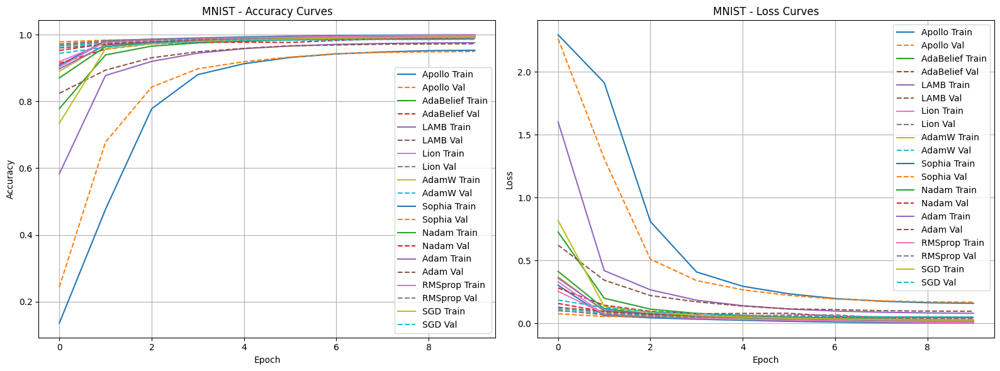

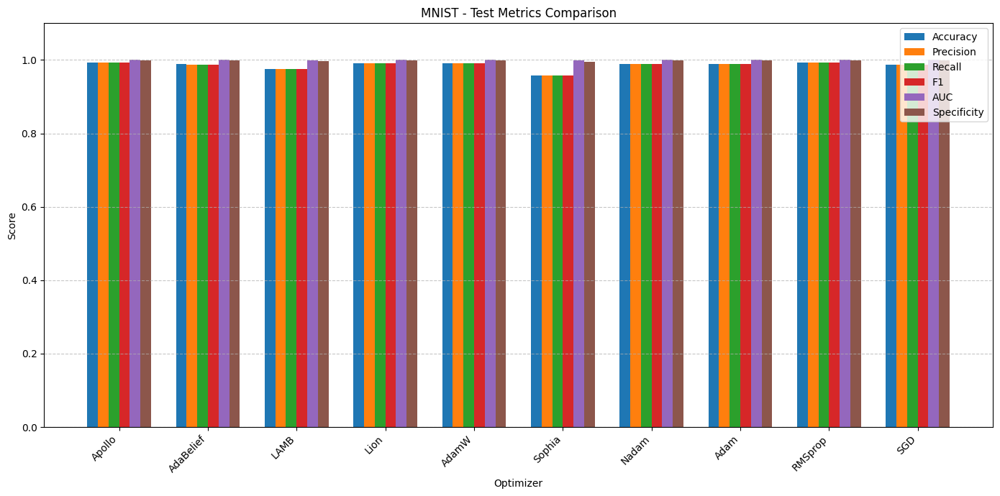

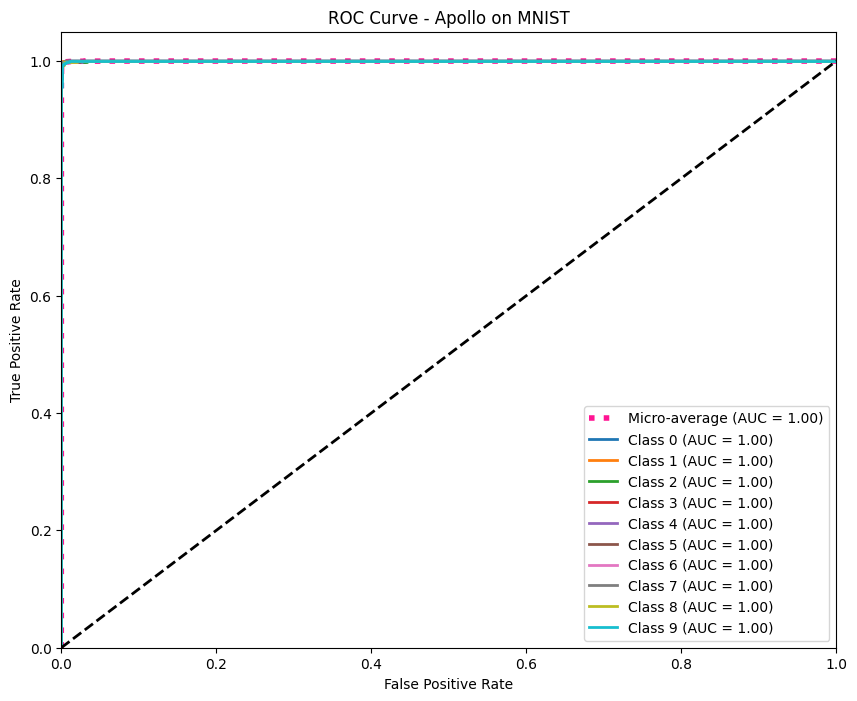

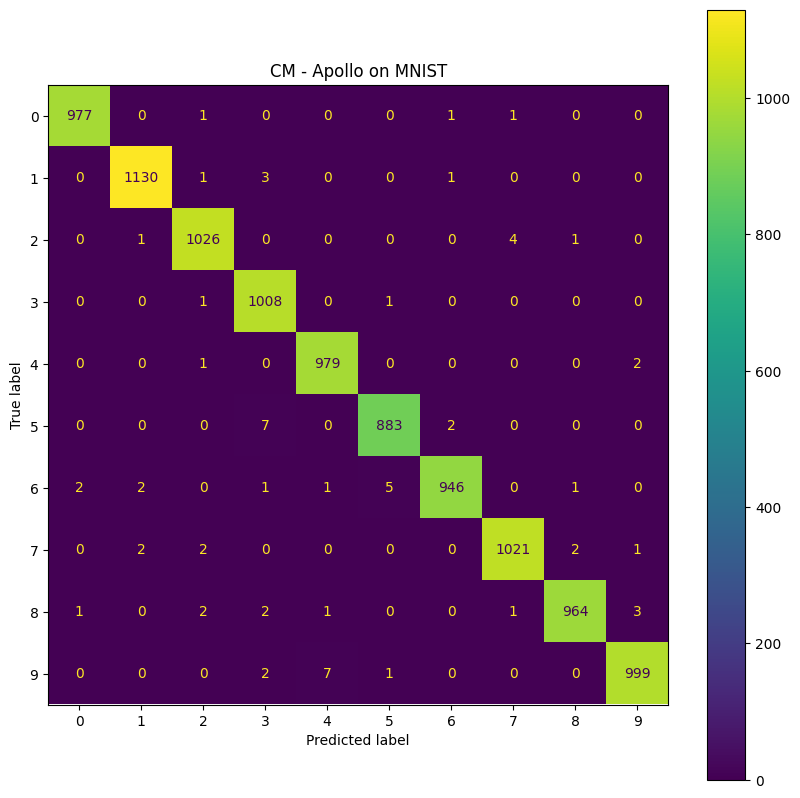

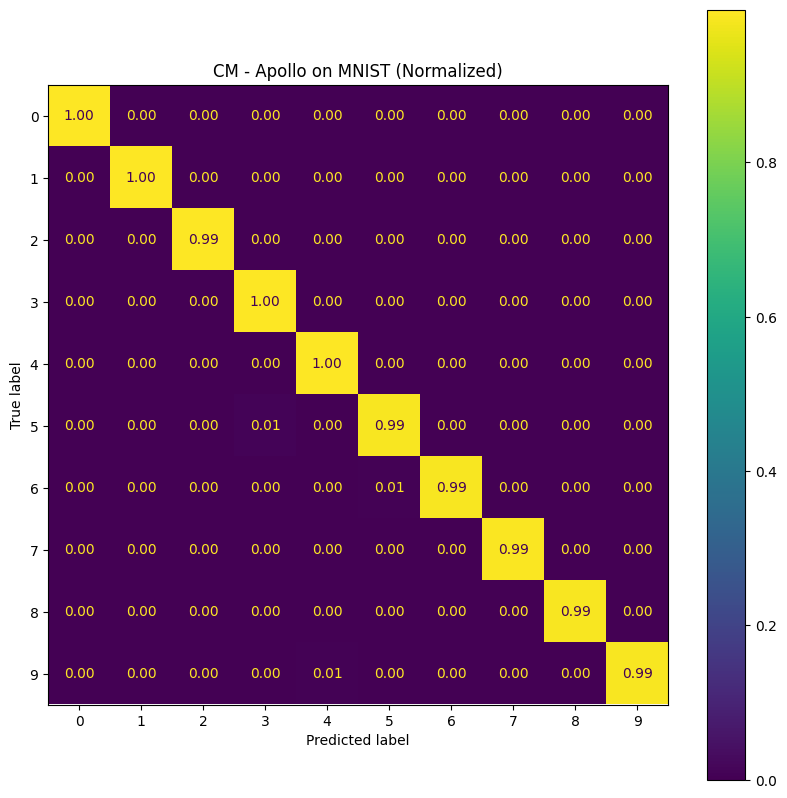

...

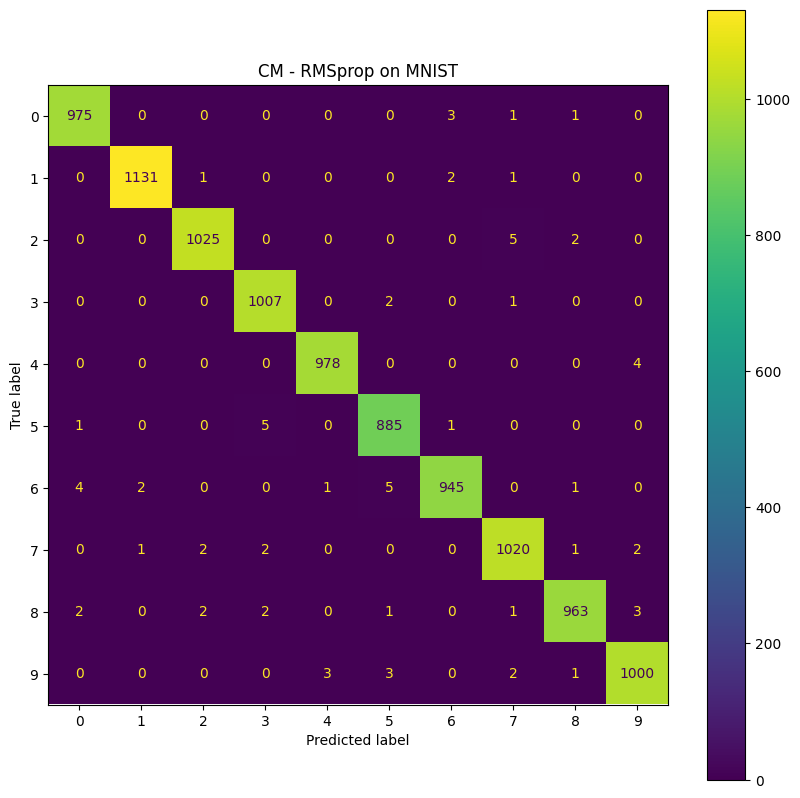

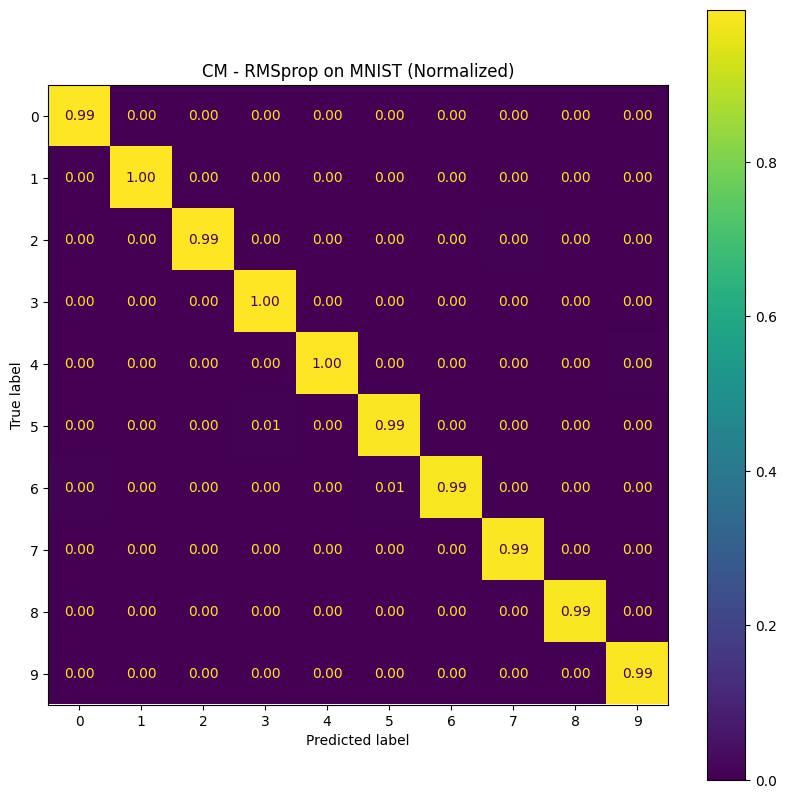

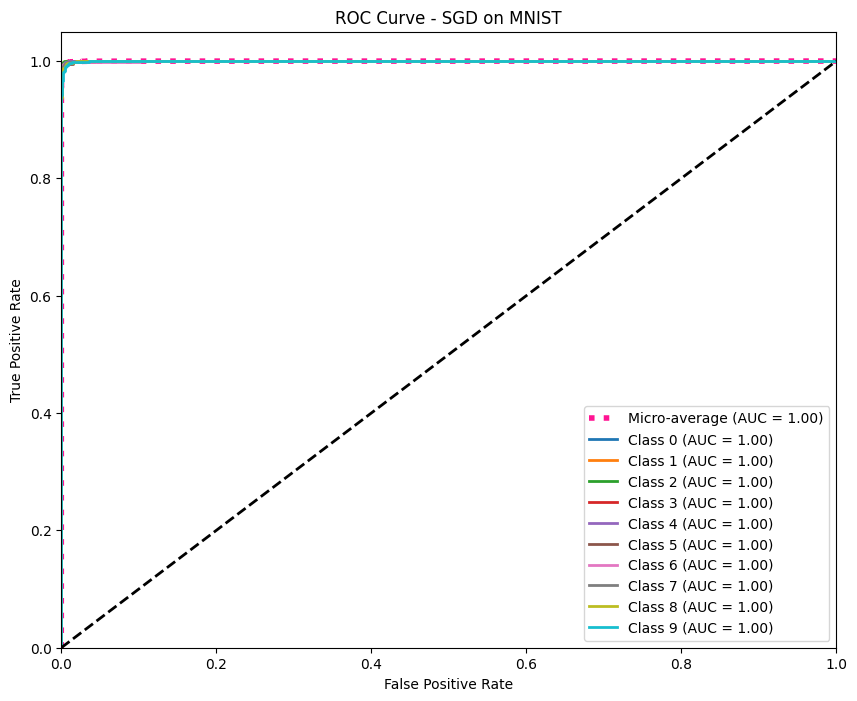

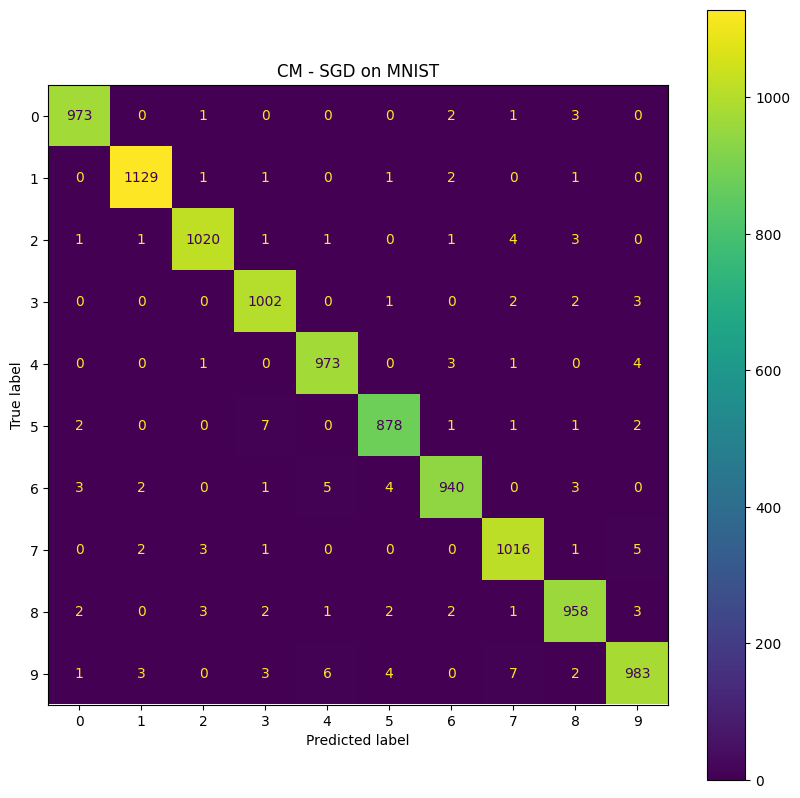

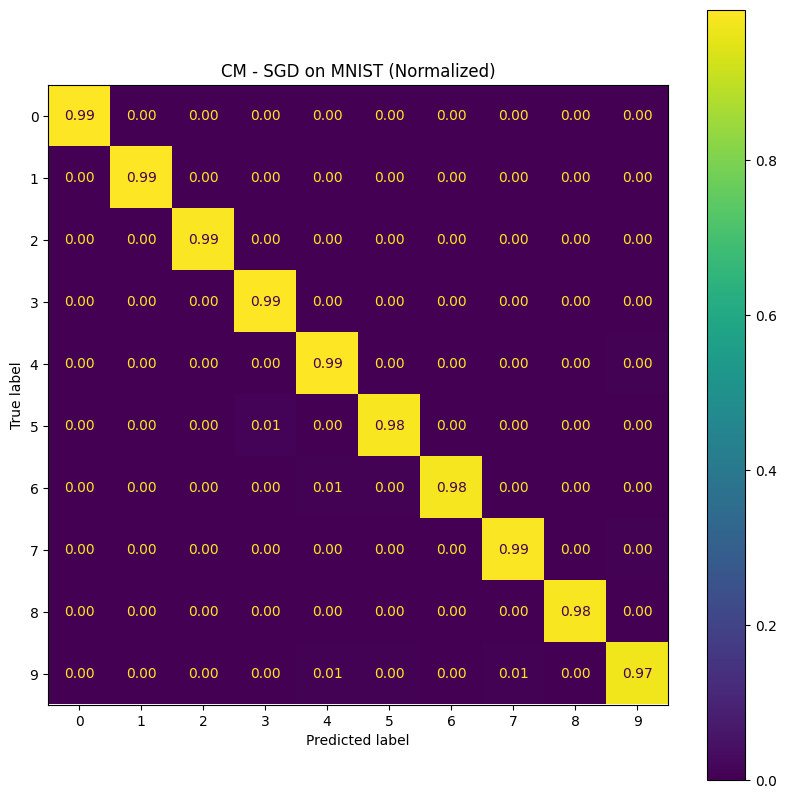


=== LaTeX Table for MNIST ===

\begin{table}[H]
\centering
\begin{tabular}{lcccccccc}\toprule
Optimizer & Test Loss & Test Acc & Precision & Recall & F1 & AUC & Specificity & Avg Epoch Time (s) \\ \midrule
Apollo & 0.0326 & 0.9933 & 0.9933 & 0.9932 & 0.9932 & 1.0000 & 0.9993 & 16.45 \\
AdaBelief & 0.0358 & 0.9881 & 0.9880 & 0.9880 & 0.9880 & 0.9999 & 0.9987 & 14.12 \\
LAMB & 0.0779 & 0.9751 & 0.9751 & 0.9749 & 0.9750 & 0.9996 & 0.9972 & 15.31 \\
Lion & 0.0378 & 0.9909 & 0.9908 & 0.9908 & 0.9908 & 0.9999 & 0.9990 & 14.23 \\
AdamW & 0.0309 & 0.9902 & 0.9902 & 0.9901 & 0.9901 & 0.9999 & 0.9989 & 15.05 \\
Sophia & 0.1444 & 0.9578 & 0.9574 & 0.9573 & 0.9573 & 0.9984 & 0.9953 & 14.63 \\
Nadam & 0.0318 & 0.9892 & 0.9892 & 0.9891 & 0.9891 & 0.9999 & 0.9988 & 14.17 \\
Adam & 0.0309 & 0.9892 & 0.9892 & 0.9890 & 0.9891 & 0.9999 & 0.9988 & 13.87 \\
RMSprop & 0.0240 & 0.9929 & 0.9928 & 0.9928 & 0.9928 & 1.0000 & 0.9992 & 14.10 \\
SGD & 0.0405 & 0.9872 & 0.9871 & 0.9871 & 0.9871 & 0.9999 & 0.9986 &

In [ ]:
import os
import random
import time
from collections import Counter
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import Optimizer
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, random_split
from sklearn.metrics import (
    precision_score, recall_score, f1_score, confusion_matrix,
    ConfusionMatrixDisplay, roc_curve, auc, roc_auc_score
)
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
from typing import Iterable, Tuple, Optional
from itertools import cycle

# ---------------------------
# Setup & Reproducibility
# ---------------------------
def set_seed(seed: int = 42):
    """Sets the random seed for reproducibility across libraries."""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False

print("Setting random seed for reproducibility...", flush=True)
set_seed()

# Global settings
NUM_EPOCHS = 10
RESULTS_DIR = "results_mnist"
os.makedirs(RESULTS_DIR, exist_ok=True)


# ---------------------------
# Optimizer Implementations
# ---------------------------

import torch
import torch.optim as optim
import torch.nn.functional as F

class Apollo(optim.Optimizer):
    """
    Implements the Apollo (Adaptive Policy for Optimizer-space Linear Linking) algorithm.

    Apollo dynamically interpolates between AdamW and Lion-style updates
    based on the agreement between their proposed update directions. This removes
    the need for a fixed interpolation factor `gamma`.
    """
    def __init__(self, params, lr=1e-3, betas=(0.9, 0.999, 0.9), eps=1e-8,
                 weight_decay=1e-2):
        if not 0.0 <= lr: raise ValueError(f"Invalid learning rate: {lr}")
        if not 0.0 <= eps: raise ValueError(f"Invalid epsilon value: {eps}")
        if not 0.0 <= betas[0] < 1.0: raise ValueError(f"Invalid beta_1: {betas[0]}")
        if not 0.0 <= betas[1] < 1.0: raise ValueError(f"Invalid beta_2: {betas[1]}")
        if not 0.0 <= betas[2] < 1.0: raise ValueError(f"Invalid beta_3 for adaptation: {betas[2]}")
        if not 0.0 <= weight_decay: raise ValueError(f"Invalid weight_decay value: {weight_decay}")

        defaults = dict(lr=lr, betas=betas, eps=eps, weight_decay=weight_decay)
        super(Apollo, self).__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()

        for group in self.param_groups:
            beta1, beta2, beta3 = group['betas']

            for p in group['params']:
                if p.grad is None: continue
                grad = p.grad
                if grad.is_sparse: raise RuntimeError('Apollo does not support sparse gradients.')

                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['exp_avg'] = torch.zeros_like(p, memory_format=torch.preserve_format)
                    state['exp_avg_sq'] = torch.zeros_like(p, memory_format=torch.preserve_format)
                    # New state for tracking update agreement (smoothed cosine similarity)
                    state['update_agreement'] = torch.zeros((), device=p.device)


                exp_avg, exp_avg_sq = state['exp_avg'], state['exp_avg_sq']
                state['step'] += 1

                # Decoupled weight decay (AdamW style)
                if group['weight_decay'] != 0:
                    p.add_(p, alpha=-group['weight_decay'] * group['lr'])

                # Update biased first and second moment estimates
                exp_avg.mul_(beta1).add_(grad, alpha=1 - beta1)
                exp_avg_sq.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)

                # Bias correction
                bias_correction1 = 1 - beta1 ** state['step']
                bias_correction2 = 1 - beta2 ** state['step']

                m_hat = exp_avg / bias_correction1
                v_hat = exp_avg_sq / bias_correction2

                # --- High-Novelty Adaptive Mechanism ---
                # 1. Calculate the two candidate updates
                denom = v_hat.sqrt().add_(group['eps'])
                update_adam = m_hat / denom
                update_lion = torch.sign(m_hat)

                # 2. Measure agreement using cosine similarity
                # Use a small epsilon in norm to prevent division by zero for zero-updates
                cos_sim = F.cosine_similarity(update_adam.flatten(), update_lion.flatten(), dim=0, eps=1e-10)

                # 3. Smooth the agreement factor using an EMA
                state['update_agreement'].mul_(beta3).add_(cos_sim, alpha=1 - beta3)

                # 4. Dynamically set gamma based on smoothed agreement
                # This maps the cosine similarity from [-1, 1] to a gamma in [0, 1]
                gamma = (state['update_agreement'] + 1) / 2.0
                # ----------------------------------------

                # Interpolate between the two updates using the DYNAMIC gamma
                final_update = (1 - gamma) * update_adam + gamma * update_lion

                # Apply the final update
                p.add_(final_update, alpha=-group['lr'])

        return loss

class AdaBelief(Optimizer):
    """Implements AdaBelief algorithm."""
    def __init__(self, params, lr=1e-3, betas=(0.9, 0.999), eps=1e-8, weight_decay=1e-3, rectify=True):
        defaults = dict(lr=lr, betas=betas, eps=eps, weight_decay=weight_decay, rectify=rectify)
        super(AdaBelief, self).__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()

        for group in self.param_groups:
            lr, beta1, beta2, eps, wd, rectify = group['lr'], group['betas'][0], group['betas'][1], group['eps'], group['weight_decay'], group['rectify']
            for p in group['params']:
                if p.grad is None: continue
                grad = p.grad
                if grad.is_sparse: raise RuntimeError('AdaBelief does not support sparse gradients')
                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m'] = torch.zeros_like(p)
                    state['s'] = torch.zeros_like(p)
                m, s = state['m'], state['s']
                state['step'] += 1
                step = state['step']
                if wd != 0: p.mul_(1.0 - lr * wd)
                m.mul_(beta1).add_(grad, alpha=1 - beta1)
                grad_residual = grad - m
                s.mul_(beta2).addcmul_(grad_residual, grad_residual, value=1 - beta2)
                bias_corr1, bias_corr2 = 1 - beta1 ** step, 1 - beta2 ** step
                m_hat, s_hat = m / bias_corr1, s / bias_corr2
                if rectify:
                    rho_inf = 2 / (1 - beta2) - 1
                    rho_t = rho_inf - 2 * step * (beta2 ** step) / (1 - beta2 ** step)
                    if rho_t > 5.0:
                        rect = ((rho_t - 4) * (rho_t - 2) * rho_inf / ((rho_inf - 4) * (rho_inf - 2) * rho_t)) ** 0.5
                        denom = (s_hat.sqrt() + eps)
                        p.addcdiv_(m_hat, denom, value=-lr * rect)
                    else:
                        p.add_(m_hat, alpha=-lr)
                else:
                    denom = (s_hat.sqrt() + eps)
                    p.addcdiv_(m_hat, denom, value=-lr)
        return loss

class Sophia(Optimizer):
    """Implements Sophia algorithm."""
    def __init__(self, params, lr=1e-3, beta1=0.965, beta2=0.99, rho=0.04, weight_decay=1e-3, eps=1e-8):
        defaults = dict(lr=lr, beta1=beta1, beta2=beta2, rho=rho, weight_decay=weight_decay, eps=eps)
        super(Sophia, self).__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = closure() if closure is not None else None
        for group in self.param_groups:
            for p in group['params']:
                if p.grad is None: continue
                grad = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m'] = torch.zeros_like(p)
                    state['hess_ema'] = torch.ones_like(p)
                m, hess_ema = state['m'], state['hess_ema']
                beta1, beta2, rho, lr, wd, eps = group['beta1'], group['beta2'], group['rho'], group['lr'], group['weight_decay'], group['eps']
                m.mul_(beta1).add_(grad, alpha=1 - beta1)
                hess_ema.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)
                denom = hess_ema.add(eps)
                scaled_grad = torch.clamp(m / denom, -rho, rho)
                if wd != 0: p.data.mul_(1 - lr * wd)
                p.add_(scaled_grad, alpha=-lr)
                state['step'] += 1
        return loss

class Lion(Optimizer):
    """Implements Lion algorithm."""
    def __init__(self, params, lr=1e-4, betas=(0.9, 0.99), weight_decay=0.0):
        if lr <= 0.0: raise ValueError(f"Invalid learning rate: {lr}")
        if not 0.0 <= betas[0] < 1.0: raise ValueError(f"Invalid beta1: {betas[0]}")
        if not 0.0 <= betas[1] < 1.0: raise ValueError(f"Invalid beta2: {betas[1]}")
        if weight_decay < 0.0: raise ValueError(f"Invalid weight_decay: {weight_decay}")
        defaults = dict(lr=lr, betas=betas, weight_decay=weight_decay)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure: Optional[callable] = None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()
        for group in self.param_groups:
            for p in group["params"]:
                if p.grad is None: continue
                grad = p.grad
                if group["weight_decay"] != 0:
                    p.mul_(1 - group["lr"] * group["weight_decay"])
                state = self.state[p]
                if len(state) == 0:
                    state["exp_avg"] = torch.zeros_like(p)
                exp_avg = state["exp_avg"]
                update = exp_avg.mul(group["betas"][0]).add(grad, alpha=1 - group["betas"][0])
                p.add_(update.sign(), alpha=-group["lr"])
                exp_avg.mul_(group["betas"][1]).add_(grad, alpha=1 - group["betas"][1])
        return loss

class LAMB(Optimizer):
    """Implements LAMB optimizer."""
    def __init__(
        self, params: Iterable[torch.nn.Parameter], lr: float = 1e-3,
        betas: Tuple[float, float] = (0.9, 0.999), eps: float = 1e-6,
        weight_decay: float = 0.0, clamp_trust_ratio: Optional[Tuple[float, float]] = (0.0, 10.0)
    ):
        defaults = dict(lr=lr, betas=betas, eps=eps, weight_decay=weight_decay, clamp_trust_ratio=clamp_trust_ratio)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure: Optional[callable] = None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()
        for group in self.param_groups:
            for p in group["params"]:
                if p.grad is None: continue
                grad = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state["step"] = 0
                    state["exp_avg"] = torch.zeros_like(p)
                    state["exp_avg_sq"] = torch.zeros_like(p)
                exp_avg, exp_avg_sq = state["exp_avg"], state["exp_avg_sq"]
                state["step"] += 1
                beta1, beta2 = group["betas"]
                exp_avg.mul_(beta1).add_(grad, alpha=1 - beta1)
                exp_avg_sq.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)
                bias_c1 = 1 - beta1 ** state["step"]
                bias_c2 = 1 - beta2 ** state["step"]
                m_hat = exp_avg / bias_c1
                v_hat = exp_avg_sq / bias_c2
                denom = v_hat.sqrt().add_(group["eps"])
                update = m_hat / denom
                if group["weight_decay"] != 0:
                    update.add_(p, alpha=group["weight_decay"])
                w_norm = p.norm(p=2)
                u_norm = update.norm(p=2)
                trust_ratio = (w_norm / u_norm).item() if w_norm > 0 and u_norm > 0 else 1.0
                if group["clamp_trust_ratio"] is not None:
                    lo, hi = group["clamp_trust_ratio"]
                    trust_ratio = max(lo, min(trust_ratio, hi))
                p.add_(update, alpha=-group["lr"] * trust_ratio)
        return loss

# ---------------------------
# Model and Data for MNIST
# ---------------------------
class LeNet5(nn.Module):
    """A simple LeNet-5 style CNN for MNIST classification."""
    def __init__(self):
        super(LeNet5, self).__init__()
        self.network = nn.Sequential(
            nn.Conv2d(1, 6, kernel_size=5, padding=2), # 28x28 -> 28x28
            nn.ReLU(),
            nn.AvgPool2d(kernel_size=2, stride=2), # 28x28 -> 14x14
            nn.Conv2d(6, 16, kernel_size=5), # 14x14 -> 10x10
            nn.ReLU(),
            nn.AvgPool2d(kernel_size=2, stride=2), # 10x10 -> 5x5
            nn.Flatten(),
            nn.Linear(16 * 5 * 5, 120),
            nn.ReLU(),
            nn.Linear(120, 84),
            nn.ReLU(),
            nn.Linear(84, 10)
        )
    def forward(self, x):
        return self.network(x)

def get_mnist_loaders(batch_size=128, data_root="./data"):
    """Creates and returns MNIST DataLoaders."""
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.1307,), (0.3081,))
    ])
    train_dataset = datasets.MNIST(root=data_root, train=True, download=True, transform=transform)
    test_dataset = datasets.MNIST(root=data_root, train=False, download=True, transform=transform)

    train_size = int(0.9 * len(train_dataset))
    val_size = len(train_dataset) - train_size
    train_subset, val_subset = random_split(train_dataset, [train_size, val_size])

    train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True, num_workers=2, pin_memory=True)
    val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)

    return train_loader, val_loader, test_loader

# ---------------------------
# Training and Evaluation
# ---------------------------
def train_model(model_fn, optimizer_factory, train_loader, val_loader, test_loader,
                num_epochs=15, dataset_name="MNIST", run_name="default"):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model_fn().to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optimizer_factory(model.parameters())
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)

    history = { 'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': [] }
    start_time = time.time()

    print(f"Training {run_name} on {dataset_name} for {num_epochs} epochs on {device}...")

    for epoch in range(num_epochs):
        epoch_start = time.time()
        model.train()
        train_loss, train_correct, train_total = 0.0, 0, 0
        for data, targets in train_loader:
            data, targets = data.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(data)
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * data.size(0)
            _, preds = outputs.max(1)
            train_total += targets.size(0)
            train_correct += preds.eq(targets).sum().item()

        history['train_loss'].append(train_loss / train_total)
        history['train_acc'].append(train_correct / train_total)

        model.eval()
        val_loss, val_correct, val_total = 0.0, 0, 0
        with torch.no_grad():
            for data, targets in val_loader:
                data, targets = data.to(device), targets.to(device)
                outputs = model(data)
                loss = criterion(outputs, targets)
                val_loss += loss.item() * data.size(0)
                _, preds = outputs.max(1)
                val_total += targets.size(0)
                val_correct += preds.eq(targets).sum().item()

        history['val_loss'].append(val_loss / val_total)
        history['val_acc'].append(val_correct / val_total)

        print(f"Epoch {epoch+1}/{num_epochs} | Train Loss: {history['train_loss'][-1]:.4f}, Acc: {history['train_acc'][-1]:.4f} | "
              f"Val Loss: {history['val_loss'][-1]:.4f}, Acc: {history['val_acc'][-1]:.4f} | Time: {time.time() - epoch_start:.2f}s")
        scheduler.step()

    # --- Test Phase ---
    model.eval()
    all_preds, all_targets, all_probs = [], [], []
    test_loss_sum = 0.0
    with torch.no_grad():
        for data, targets in test_loader:
            data, targets = data.to(device), targets.to(device)
            outputs = model(data)
            loss = criterion(outputs, targets)
            test_loss_sum += loss.item() * data.size(0)
            _, preds = outputs.max(1)
            all_preds.extend(preds.cpu().numpy())
            all_targets.extend(targets.cpu().numpy())
            all_probs.extend(torch.softmax(outputs, dim=1).cpu().numpy())

    # --- Final Metrics Calculation ---
    final_metrics = {}
    all_preds = np.array(all_preds)
    all_targets = np.array(all_targets)
    all_probs = np.array(all_probs)

    final_metrics['test_loss'] = test_loss_sum / len(all_targets)
    final_metrics['test_acc'] = (all_preds == all_targets).mean()
    final_metrics['test_precision'] = precision_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_recall'] = recall_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_f1'] = f1_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_auc'] = roc_auc_score(all_targets, all_probs, multi_class='ovr')

    cm = confusion_matrix(all_targets, all_preds)
    specificity = []
    for i in range(cm.shape[0]):
        tn = cm.sum() - (cm[i, :].sum() + cm[:, i].sum() - cm[i, i])
        fp = cm[:, i].sum() - cm[i, i]
        specificity.append(tn / (tn + fp + 1e-8))
    final_metrics['test_specificity'] = np.mean(specificity)

    final_metrics['runtime'] = time.time() - start_time
    final_metrics['avg_epoch_time'] = final_metrics['runtime'] / num_epochs
    final_metrics['targets'] = all_targets
    final_metrics['preds'] = all_preds
    final_metrics['probs'] = all_probs

    print(f"\nFinal Test Results for {run_name}: Acc: {final_metrics['test_acc']:.4f}, F1: {final_metrics['test_f1']:.4f}, AUC: {final_metrics['test_auc']:.4f}\n")

    return {**history, **final_metrics}

# ---------------------------
# Optimizer Registry
# ---------------------------
optimizers = {
    'Apollo': lambda params: Apollo(params,lr=1e-3, betas=(0.9, 0.999, 0.9), eps=1e-8,
                 weight_decay=1e-4),
    'AdaBelief': lambda params: AdaBelief(params, lr=1e-3, weight_decay=1e-4),
    'LAMB': lambda params: LAMB(params, lr=1e-3, weight_decay=1e-4),
    'Lion': lambda params: Lion(params, lr=1e-3, weight_decay=1e-4),
    'AdamW': lambda params: optim.AdamW(params, lr=1e-3, weight_decay=1e-4),
    'Sophia': lambda params: Sophia(params, lr=1e-3, weight_decay=1e-4),
    'Nadam': lambda params: optim.NAdam(params, lr=1e-3, weight_decay=1e-4),
    'Adam': lambda params: optim.Adam(params, lr=1e-3, weight_decay=1e-4),
    'RMSprop': lambda params: optim.RMSprop(params, lr=1e-3, weight_decay=1e-4),
    'SGD': lambda params: optim.SGD(params, lr=0.01, momentum=0.9, weight_decay=1e-4),
}

# ---------------------------
# Plotting, Saving, and Table Utilities
# ---------------------------
def plot_learning_curves(results, dataset_name, save_path=None):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    for opt_name, metrics in results.items():
        ax1.plot(metrics['train_acc'], label=f'{opt_name} Train', linestyle='-')
        ax1.plot(metrics['val_acc'], label=f'{opt_name} Val', linestyle='--')
    ax1.set_title(f'{dataset_name} - Accuracy Curves'); ax1.set_xlabel('Epoch'); ax1.set_ylabel('Accuracy'); ax1.legend(); ax1.grid(True)
    for opt_name, metrics in results.items():
        ax2.plot(metrics['train_loss'], label=f'{opt_name} Train', linestyle='-')
        ax2.plot(metrics['val_loss'], label=f'{opt_name} Val', linestyle='--')
    ax2.set_title(f'{dataset_name} - Loss Curves'); ax2.set_xlabel('Epoch'); ax2.set_ylabel('Loss'); ax2.legend(); ax2.grid(True)
    plt.tight_layout()
    if save_path: plt.savefig(save_path)
    plt.show()

def plot_test_metrics(results, dataset_name, save_path=None):
    metrics_list = ['test_acc', 'test_precision', 'test_recall', 'test_f1', 'test_auc', 'test_specificity']
    metric_names = ['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Specificity']
    plt.figure(figsize=(14, 7)); bar_width = 0.12; x = np.arange(len(results))
    for i, metric in enumerate(metrics_list):
        values = [results[opt][metric] for opt in results]
        plt.bar(x + i * bar_width, values, width=bar_width, label=metric_names[i])
    plt.title(f'{dataset_name} - Test Metrics Comparison'); plt.xlabel('Optimizer'); plt.ylabel('Score')
    plt.xticks(x + bar_width * (len(metrics_list)/2 - 0.5), list(results.keys()), rotation=45, ha="right"); plt.ylim(0, 1.1); plt.legend(); plt.grid(axis='y', linestyle='--', alpha=0.7); plt.tight_layout()
    if save_path: plt.savefig(save_path)
    plt.show()

def plot_roc_curves(result, opt_name, class_names, dataset_name, save_path=None):
    probs, targets = result['probs'], result['targets']
    targets_bin = label_binarize(targets, classes=range(len(class_names)))
    fpr, tpr, roc_auc = {}, {}, {}
    for i in range(len(class_names)):
        fpr[i], tpr[i], _ = roc_curve(targets_bin[:, i], probs[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    fpr["micro"], tpr["micro"], _ = roc_curve(targets_bin.ravel(), probs.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    plt.figure(figsize=(10, 8))
    plt.plot(fpr["micro"], tpr["micro"], label=f'Micro-average (AUC = {roc_auc["micro"]:.2f})', color='deeppink', linestyle=':', linewidth=4)
    # Corrected MatplotlibDeprecationWarning
    colors = cycle(plt.get_cmap('tab10').colors)
    for i, color in zip(range(len(class_names)), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2, label=f'Class {class_names[i]} (AUC = {roc_auc[i]:.2f})')
    plt.plot([0, 1], [0, 1], 'k--', lw=2); plt.xlim([0.0, 1.0]); plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate'); plt.ylabel('True Positive Rate'); plt.title(f'ROC Curve - {opt_name} on {dataset_name}'); plt.legend(loc="lower right")
    if save_path: plt.savefig(save_path)
    plt.show()

def plot_confusion_matrix(result, opt_name, class_names, dataset_name, normalize=False, save_path=None):
    cm = confusion_matrix(result['targets'], result['preds'])
    title = f'CM - {opt_name} on {dataset_name}'
    if normalize:
        cm = cm.astype('float') / (cm.sum(axis=1)[:, np.newaxis] + 1e-8)
        title += ' (Normalized)'
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    fig, ax = plt.subplots(figsize=(10, 10))
    disp.plot(ax=ax, cmap='viridis', values_format='.2f' if normalize else 'd')
    plt.title(title)
    if save_path: plt.savefig(save_path)
    plt.show()

def generate_latex_table(results, dataset_name):
    """Generates a LaTeX table with all relevant metrics."""
    header = (
        "\\begin{table}[H]\n\\centering\n"
        "\\begin{tabular}{lcccccccc}\\toprule\n"
        "Optimizer & Test Loss & Test Acc & Precision & Recall & F1 & AUC & Specificity & Avg Epoch Time (s) \\\\ \\midrule\n"
    )

    footer = (
        "\\bottomrule\n\\end{tabular}\n"
        f"\\caption{{Performance Metrics for {dataset_name}}}\n"
        f"\\label{{tab:{dataset_name.lower().replace('-', '_')}_perf}}\n"
        "\\end{table}"
    )

    rows = []
    for opt, m in results.items():
        rows.append(
            f"{opt} & {m['test_loss']:.4f} & {m['test_acc']:.4f} & "
            f"{m['test_precision']:.4f} & {m['test_recall']:.4f} & {m['test_f1']:.4f} & "
            f"{m['test_auc']:.4f} & {m['test_specificity']:.4f} & {m['avg_epoch_time']:.2f} \\\\"
        )

    return header + "\n".join(rows) + "\n" + footer

# ---------------------------
# Main Execution
# ---------------------------
if __name__ == "__main__":
    mnist_class_names = [str(i) for i in range(10)]
    train_loader, val_loader, test_loader = get_mnist_loaders()

    results_mnist = {}
    for opt_name, opt_factory in optimizers.items():
        results_mnist[opt_name] = train_model(
            LeNet5, opt_factory, train_loader, val_loader, test_loader,
            num_epochs=NUM_EPOCHS, dataset_name="MNIST", run_name=opt_name
        )

    # --- Generate and Save Artifacts ---
    print("\n--- Generating and Saving All Artifacts for MNIST ---")
    plot_learning_curves(results_mnist, "MNIST", save_path=os.path.join(RESULTS_DIR, "mnist_learning_curves.png"))
    plot_test_metrics(results_mnist, "MNIST", save_path=os.path.join(RESULTS_DIR, "mnist_test_metrics.png"))

    for opt_name, result in results_mnist.items():
        plot_roc_curves(result, opt_name, mnist_class_names, "MNIST", save_path=os.path.join(RESULTS_DIR, f"roc_{opt_name}.png"))
        plot_confusion_matrix(result, opt_name, mnist_class_names, "MNIST", normalize=False, save_path=os.path.join(RESULTS_DIR, f"cm_raw_{opt_name}.png"))
        plot_confusion_matrix(result, opt_name, mnist_class_names, "MNIST", normalize=True, save_path=os.path.join(RESULTS_DIR, f"cm_norm_{opt_name}.png"))

    # --- Generate, Print, and Save LaTeX and TXT Table ---
    latex_table_str = generate_latex_table(results_mnist, "MNIST")
    print("\n=== LaTeX Table for MNIST ===\n")
    print(latex_table_str)

    # Save as .tex file
    tex_path = os.path.join(RESULTS_DIR, "mnist_results_table.tex")
    with open(tex_path, "w") as f:
        f.write(latex_table_str)
    print(f"LaTeX table saved to: {tex_path}")

    # Save as .txt file (without LaTeX commands for readability)
    txt_path = os.path.join(RESULTS_DIR, "mnist_results_summary.txt")
    with open(txt_path, "w") as f:
        f.write("Optimizer, Test Loss, Test Acc, Precision, Recall, F1, AUC, Specificity, Avg Epoch Time (s)\n")
        for opt, m in results_mnist.items():
             f.write(
                f"{opt}, {m['test_loss']:.4f}, {m['test_acc']:.4f}, "
                f"{m['test_precision']:.4f}, {m['test_recall']:.4f}, {m['test_f1']:.4f}, "
                f"{m['test_auc']:.4f}, {m['test_specificity']:.4f}, {m['avg_epoch_time']:.2f}\n"
            )
    print(f"Summary text file saved to: {txt_path}")


    print("\n--- Script Finished ---")


In [ ]:
from google.colab import files
import os
import zipfile

# Define the directory to zip
results_dir = "/content/results_mnist"
# Define the name for the zip file
zip_filename = "/content/results_mnist.zip"

# Create a ZipFile object
if os.path.exists(results_dir):
    with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
        # Walk through the directory and add files to the zip
        for root, _, files_in_dir in os.walk(results_dir):
            for file in files_in_dir:
                file_path = os.path.join(root, file)
                # Add file to zip, preserving directory structure
                zipf.write(file_path, os.path.relpath(file_path, results_dir))
    print(f"Successfully created {zip_filename}")

    # Download the zip file
    files.download(zip_filename)
else:
    print(f"Error: Directory '{results_dir}' not found.")

Successfully created /content/results_mnist.zip


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# !rm -rf data

# 3- MNIST-NOISY

Setting random seed for reproducibility...


100%|██████████| 9.91M/9.91M [00:02<00:00, 4.55MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 133kB/s]
100%|██████████| 1.65M/1.65M [00:01<00:00, 1.08MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 7.15MB/s]

Training Apollo on Noisy MNIST for 10 epochs on cuda...


Epoch 1/10 | Train Loss: 0.3070, Acc: 0.9078 | Val Loss: 0.0946, Acc: 0.9735 | Time: 18.38s
Epoch 2/10 | Train Loss: 0.0662, Acc: 0.9800 | Val Loss: 0.0520, Acc: 0.9853 | Time: 20.53s
Epoch 3/10 | Train Loss: 0.0476, Acc: 0.9863 | Val Loss: 0.0705, Acc: 0.9815 | Time: 18.20s
Epoch 4/10 | Train Loss: 0.0368, Acc: 0.9887 | Val Loss: 0.0539, Acc: 0.9857 | Time: 18.02s
Epoch 5/10 | Train Loss: 0.0260, Acc: 0.9923 | Val Loss: 0.0440, Acc: 0.9890 | Time: 18.20s
Epoch 6/10 | Train Loss: 0.0199, Acc: 0.9938 | Val Loss: 0.0391, Acc: 0.9888 | Time: 19.36s
Epoch 7/10 | Train Loss: 0.0139, Acc: 0.9955 | Val Loss: 0.0423, Acc: 0.9882 | Time: 17.58s
Epoch 8/10 | Train Loss: 0.0093, Acc: 0.9970 | Val Loss: 0.0469, Acc: 0.9908 | Time: 19.24s
Epoch 9/10 | Train Loss: 0.0055, Acc: 0.9983 | Val Loss: 0.0400, Acc: 0.9918 | Time: 18.29s
Epoch 10/10 | Train Loss: 0.0038, Acc: 0.9990 | Val Loss: 0.0439, Acc: 0.9908 | Time: 18.68s

Final Test Results for Apollo: Acc: 0.9918, F1: 0.9917, AUC: 1.0000

Training 

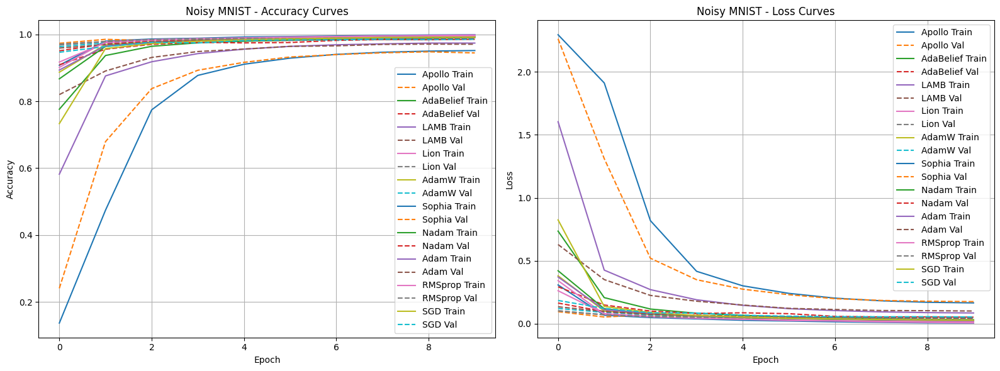

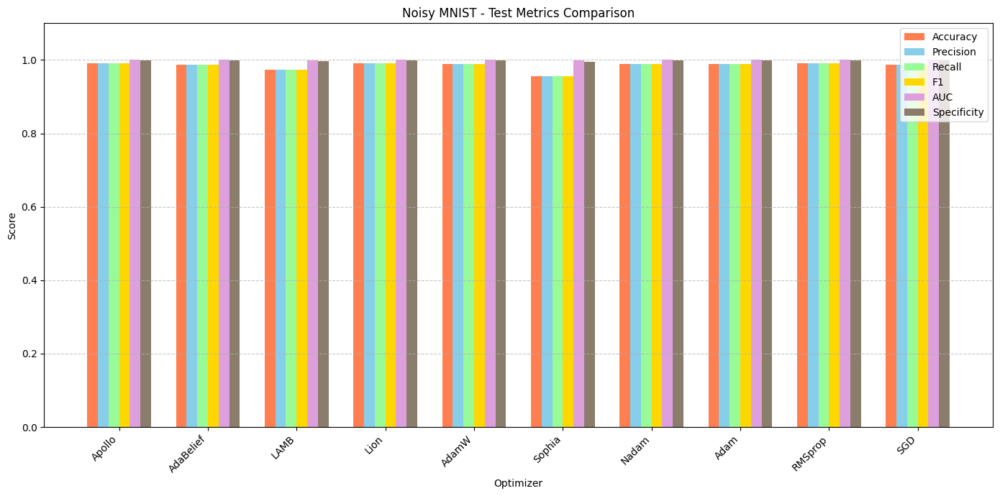

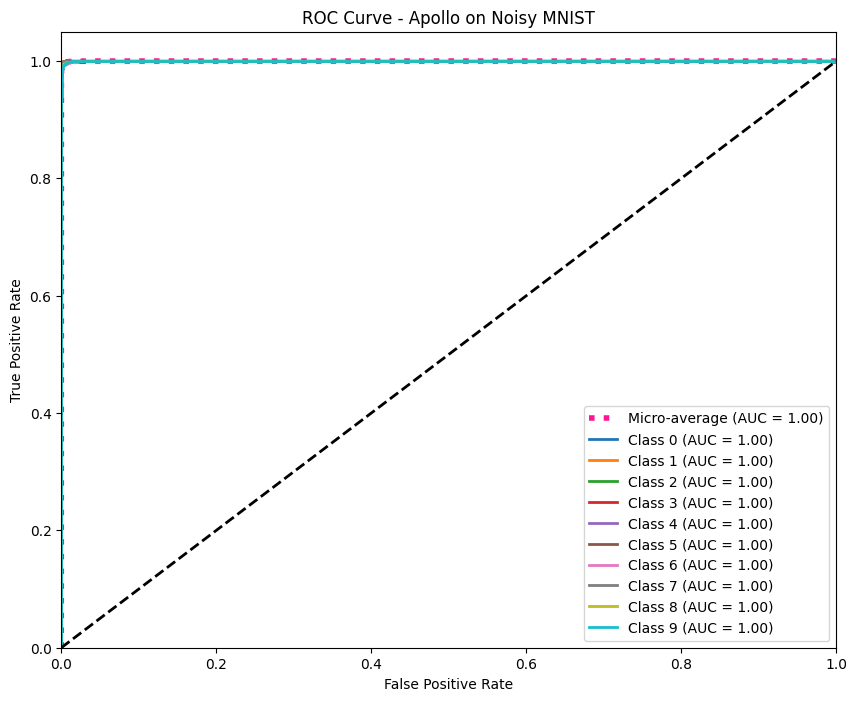

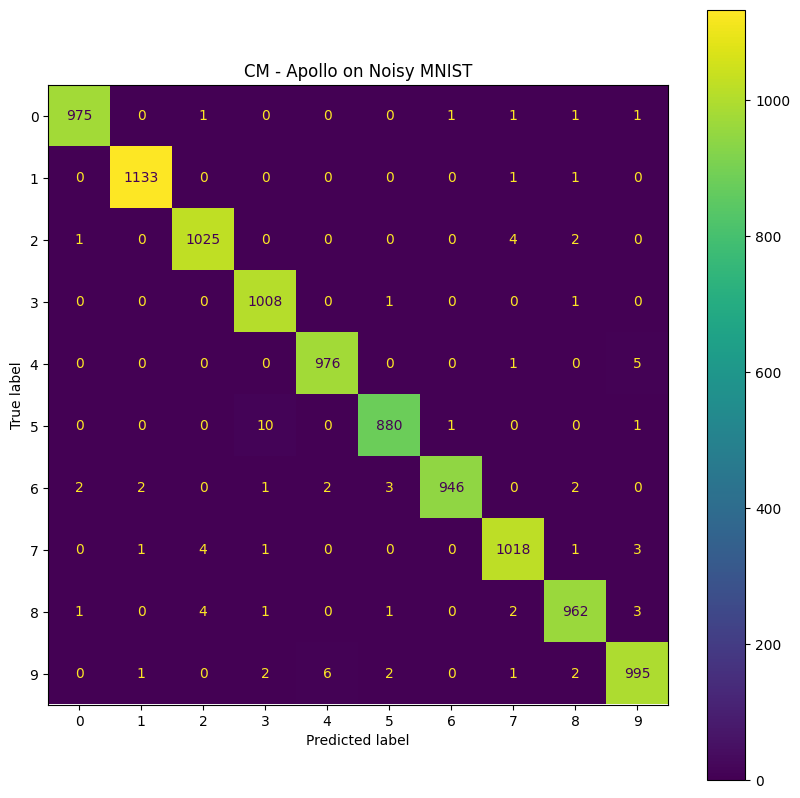

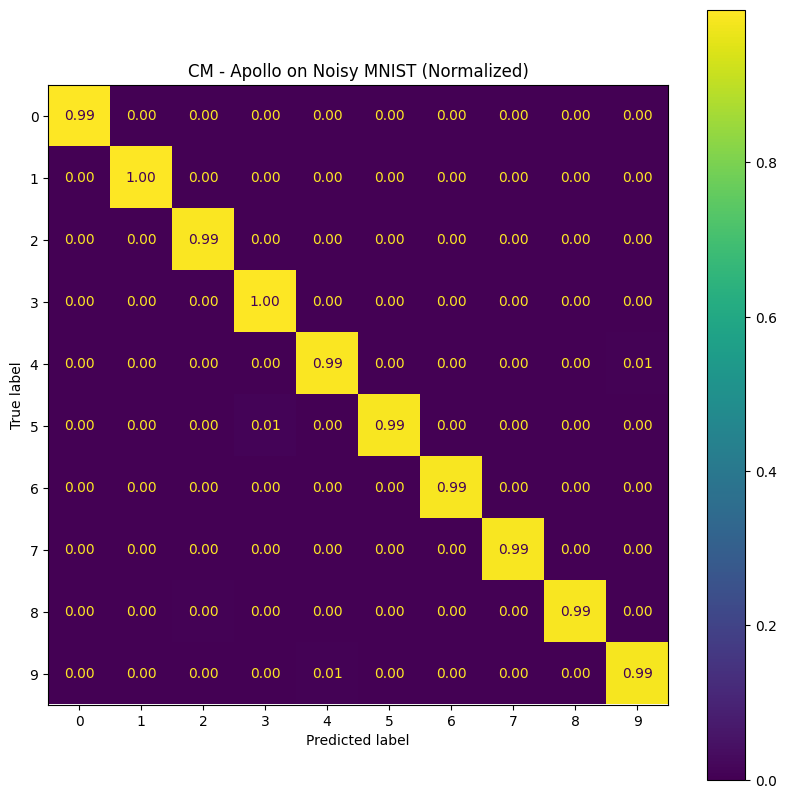

...

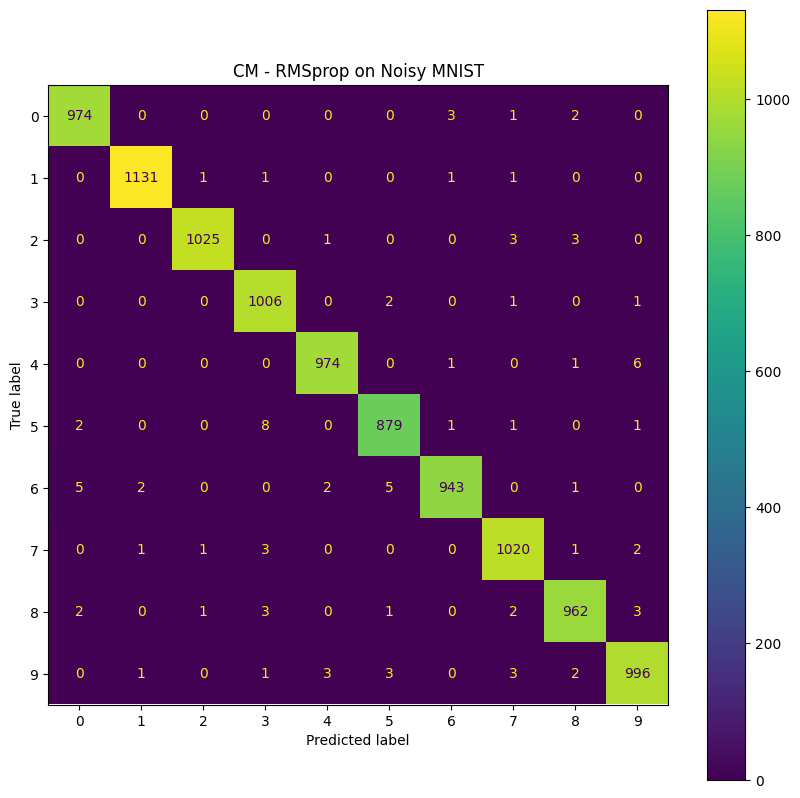

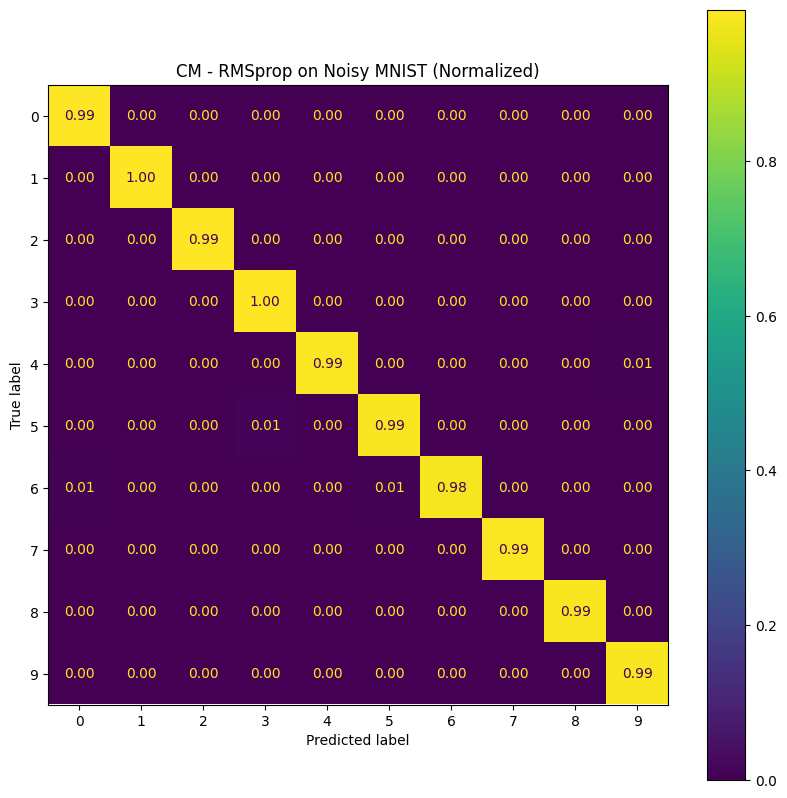

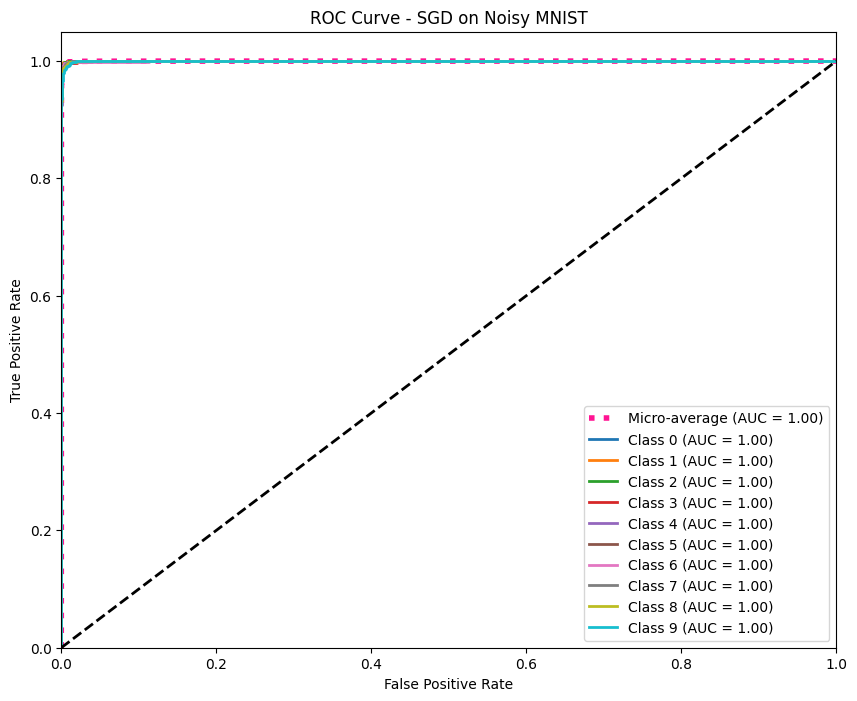

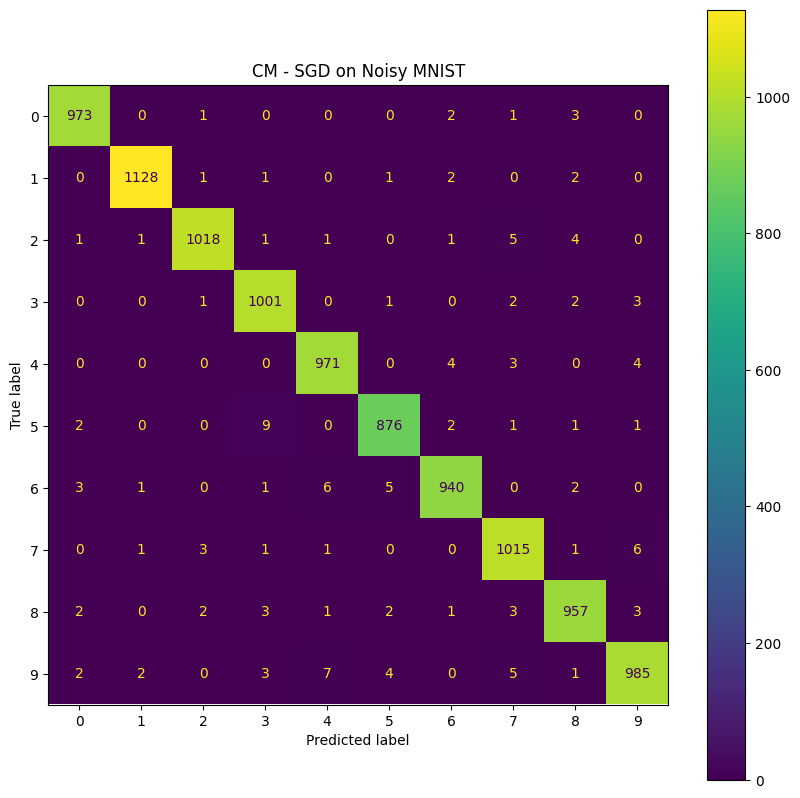

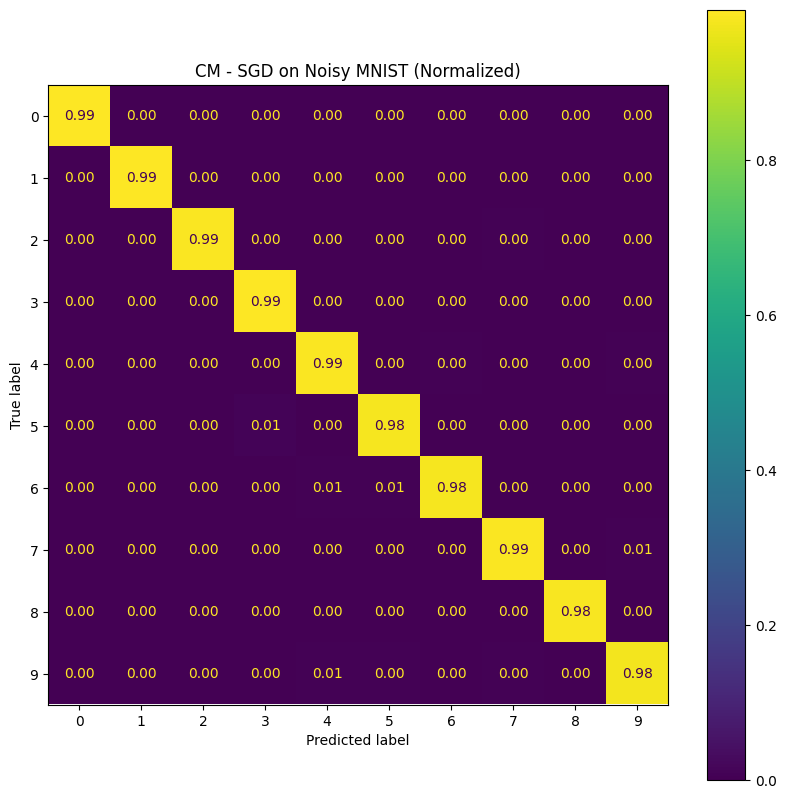


=== LaTeX Table for Noisy MNIST ===

\begin{table}[H]
\centering
\begin{tabular}{lcccccccc}\toprule
Optimizer & Test Loss & Test Acc & Precision & Recall & F1 & AUC & Specificity & Avg Epoch Time (s) \\ \midrule
Apollo & 0.0337 & 0.9918 & 0.9918 & 0.9916 & 0.9917 & 1.0000 & 0.9991 & 18.96 \\
AdaBelief & 0.0376 & 0.9880 & 0.9880 & 0.9879 & 0.9879 & 0.9999 & 0.9987 & 17.50 \\
LAMB & 0.0825 & 0.9731 & 0.9730 & 0.9728 & 0.9729 & 0.9995 & 0.9970 & 18.41 \\
Lion & 0.0365 & 0.9917 & 0.9916 & 0.9916 & 0.9916 & 0.9999 & 0.9991 & 17.71 \\
AdamW & 0.0323 & 0.9893 & 0.9893 & 0.9892 & 0.9892 & 0.9999 & 0.9988 & 17.34 \\
Sophia & 0.1489 & 0.9564 & 0.9560 & 0.9558 & 0.9558 & 0.9983 & 0.9952 & 18.76 \\
Nadam & 0.0336 & 0.9890 & 0.9890 & 0.9889 & 0.9889 & 0.9999 & 0.9988 & 17.36 \\
Adam & 0.0327 & 0.9883 & 0.9883 & 0.9881 & 0.9882 & 0.9999 & 0.9987 & 17.20 \\
RMSprop & 0.0262 & 0.9910 & 0.9909 & 0.9908 & 0.9909 & 0.9999 & 0.9990 & 17.21 \\
SGD & 0.0427 & 0.9864 & 0.9863 & 0.9862 & 0.9863 & 0.9999 & 0.

In [ ]:
import os
import random
import time
from collections import Counter
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import Optimizer
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, random_split
from sklearn.metrics import (
    precision_score, recall_score, f1_score, confusion_matrix,
    ConfusionMatrixDisplay, roc_curve, auc, roc_auc_score
)
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
from typing import Iterable, Tuple, Optional
from itertools import cycle

# ---------------------------
# Setup & Reproducibility
# ---------------------------
def set_seed(seed: int = 42):
    """Sets the random seed for reproducibility across libraries."""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False

print("Setting random seed for reproducibility...", flush=True)
set_seed()

# Global settings
NUM_EPOCHS = 10
RESULTS_DIR = "results_noisy_mnist"
os.makedirs(RESULTS_DIR, exist_ok=True)


# ---------------------------
# Optimizer Implementations
# ---------------------------

import torch
import torch.optim as optim
import torch.nn.functional as F

class Apollo(optim.Optimizer):
    """
    Implements the Apollo (Adaptive Policy for Optimizer-space Linear Linking) algorithm.

    Apollo dynamically interpolates between AdamW and Lion-style updates
    based on the agreement between their proposed update directions. This removes
    the need for a fixed interpolation factor `gamma`.
    """
    def __init__(self, params, lr=1e-3, betas=(0.9, 0.999, 0.9), eps=1e-8,
                 weight_decay=1e-2):
        if not 0.0 <= lr: raise ValueError(f"Invalid learning rate: {lr}")
        if not 0.0 <= eps: raise ValueError(f"Invalid epsilon value: {eps}")
        if not 0.0 <= betas[0] < 1.0: raise ValueError(f"Invalid beta_1: {betas[0]}")
        if not 0.0 <= betas[1] < 1.0: raise ValueError(f"Invalid beta_2: {betas[1]}")
        if not 0.0 <= betas[2] < 1.0: raise ValueError(f"Invalid beta_3 for adaptation: {betas[2]}")
        if not 0.0 <= weight_decay: raise ValueError(f"Invalid weight_decay value: {weight_decay}")

        defaults = dict(lr=lr, betas=betas, eps=eps, weight_decay=weight_decay)
        super(Apollo, self).__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()

        for group in self.param_groups:
            beta1, beta2, beta3 = group['betas']

            for p in group['params']:
                if p.grad is None: continue
                grad = p.grad
                if grad.is_sparse: raise RuntimeError('Apollo does not support sparse gradients.')

                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['exp_avg'] = torch.zeros_like(p, memory_format=torch.preserve_format)
                    state['exp_avg_sq'] = torch.zeros_like(p, memory_format=torch.preserve_format)
                    # New state for tracking update agreement (smoothed cosine similarity)
                    state['update_agreement'] = torch.zeros((), device=p.device)


                exp_avg, exp_avg_sq = state['exp_avg'], state['exp_avg_sq']
                state['step'] += 1

                # Decoupled weight decay (AdamW style)
                if group['weight_decay'] != 0:
                    p.add_(p, alpha=-group['weight_decay'] * group['lr'])

                # Update biased first and second moment estimates
                exp_avg.mul_(beta1).add_(grad, alpha=1 - beta1)
                exp_avg_sq.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)

                # Bias correction
                bias_correction1 = 1 - beta1 ** state['step']
                bias_correction2 = 1 - beta2 ** state['step']

                m_hat = exp_avg / bias_correction1
                v_hat = exp_avg_sq / bias_correction2

                # --- High-Novelty Adaptive Mechanism ---
                # 1. Calculate the two candidate updates
                denom = v_hat.sqrt().add_(group['eps'])
                update_adam = m_hat / denom
                update_lion = torch.sign(m_hat)

                # 2. Measure agreement using cosine similarity
                # Use a small epsilon in norm to prevent division by zero for zero-updates
                cos_sim = F.cosine_similarity(update_adam.flatten(), update_lion.flatten(), dim=0, eps=1e-10)

                # 3. Smooth the agreement factor using an EMA
                state['update_agreement'].mul_(beta3).add_(cos_sim, alpha=1 - beta3)

                # 4. Dynamically set gamma based on smoothed agreement
                # This maps the cosine similarity from [-1, 1] to a gamma in [0, 1]
                gamma = (state['update_agreement'] + 1) / 2.0
                # ----------------------------------------

                # Interpolate between the two updates using the DYNAMIC gamma
                final_update = (1 - gamma) * update_adam + gamma * update_lion

                # Apply the final update
                p.add_(final_update, alpha=-group['lr'])

        return loss

class AdaBelief(Optimizer):
    """Implements AdaBelief algorithm."""
    def __init__(self, params, lr=1e-3, betas=(0.9, 0.999), eps=1e-8, weight_decay=1e-3, rectify=True):
        defaults = dict(lr=lr, betas=betas, eps=eps, weight_decay=weight_decay, rectify=rectify)
        super(AdaBelief, self).__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()

        for group in self.param_groups:
            lr, beta1, beta2, eps, wd, rectify = group['lr'], group['betas'][0], group['betas'][1], group['eps'], group['weight_decay'], group['rectify']
            for p in group['params']:
                if p.grad is None: continue
                grad = p.grad
                if grad.is_sparse: raise RuntimeError('AdaBelief does not support sparse gradients')
                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m'] = torch.zeros_like(p)
                    state['s'] = torch.zeros_like(p)
                m, s = state['m'], state['s']
                state['step'] += 1
                step = state['step']
                if wd != 0: p.mul_(1.0 - lr * wd)
                m.mul_(beta1).add_(grad, alpha=1 - beta1)
                grad_residual = grad - m
                s.mul_(beta2).addcmul_(grad_residual, grad_residual, value=1 - beta2)
                bias_corr1, bias_corr2 = 1 - beta1 ** step, 1 - beta2 ** step
                m_hat, s_hat = m / bias_corr1, s / bias_corr2
                if rectify:
                    rho_inf = 2 / (1 - beta2) - 1
                    rho_t = rho_inf - 2 * step * (beta2 ** step) / (1 - beta2 ** step)
                    if rho_t > 5.0:
                        rect = ((rho_t - 4) * (rho_t - 2) * rho_inf / ((rho_inf - 4) * (rho_inf - 2) * rho_t)) ** 0.5
                        denom = (s_hat.sqrt() + eps)
                        p.addcdiv_(m_hat, denom, value=-lr * rect)
                    else:
                        p.add_(m_hat, alpha=-lr)
                else:
                    denom = (s_hat.sqrt() + eps)
                    p.addcdiv_(m_hat, denom, value=-lr)
        return loss

class Sophia(Optimizer):
    """Implements Sophia algorithm."""
    def __init__(self, params, lr=1e-3, beta1=0.965, beta2=0.99, rho=0.04, weight_decay=1e-3, eps=1e-8):
        defaults = dict(lr=lr, beta1=beta1, beta2=beta2, rho=rho, weight_decay=weight_decay, eps=eps)
        super(Sophia, self).__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = closure() if closure is not None else None
        for group in self.param_groups:
            for p in group['params']:
                if p.grad is None: continue
                grad = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m'] = torch.zeros_like(p)
                    state['hess_ema'] = torch.ones_like(p)
                m, hess_ema = state['m'], state['hess_ema']
                beta1, beta2, rho, lr, wd, eps = group['beta1'], group['beta2'], group['rho'], group['lr'], group['weight_decay'], group['eps']
                m.mul_(beta1).add_(grad, alpha=1 - beta1)
                hess_ema.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)
                denom = hess_ema.add(eps)
                scaled_grad = torch.clamp(m / denom, -rho, rho)
                if wd != 0: p.data.mul_(1 - lr * wd)
                p.add_(scaled_grad, alpha=-lr)
                state['step'] += 1
        return loss

class Lion(Optimizer):
    """Implements Lion algorithm."""
    def __init__(self, params, lr=1e-4, betas=(0.9, 0.99), weight_decay=0.0):
        if lr <= 0.0: raise ValueError(f"Invalid learning rate: {lr}")
        if not 0.0 <= betas[0] < 1.0: raise ValueError(f"Invalid beta1: {betas[0]}")
        if not 0.0 <= betas[1] < 1.0: raise ValueError(f"Invalid beta2: {betas[1]}")
        if weight_decay < 0.0: raise ValueError(f"Invalid weight_decay: {weight_decay}")
        defaults = dict(lr=lr, betas=betas, weight_decay=weight_decay)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure: Optional[callable] = None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()
        for group in self.param_groups:
            for p in group["params"]:
                if p.grad is None: continue
                grad = p.grad
                if group["weight_decay"] != 0:
                    p.mul_(1 - group["lr"] * group["weight_decay"])
                state = self.state[p]
                if len(state) == 0:
                    state["exp_avg"] = torch.zeros_like(p)
                exp_avg = state["exp_avg"]
                update = exp_avg.mul(group["betas"][0]).add(grad, alpha=1 - group["betas"][0])
                p.add_(update.sign(), alpha=-group["lr"])
                exp_avg.mul_(group["betas"][1]).add_(grad, alpha=1 - group["betas"][1])
        return loss

class LAMB(Optimizer):
    """Implements LAMB optimizer."""
    def __init__(
        self, params: Iterable[torch.nn.Parameter], lr: float = 1e-3,
        betas: Tuple[float, float] = (0.9, 0.999), eps: float = 1e-6,
        weight_decay: float = 0.0, clamp_trust_ratio: Optional[Tuple[float, float]] = (0.0, 10.0)
    ):
        defaults = dict(lr=lr, betas=betas, eps=eps, weight_decay=weight_decay, clamp_trust_ratio=clamp_trust_ratio)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure: Optional[callable] = None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()
        for group in self.param_groups:
            for p in group["params"]:
                if p.grad is None: continue
                grad = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state["step"] = 0
                    state["exp_avg"] = torch.zeros_like(p)
                    state["exp_avg_sq"] = torch.zeros_like(p)
                exp_avg, exp_avg_sq = state["exp_avg"], state["exp_avg_sq"]
                state["step"] += 1
                beta1, beta2 = group["betas"]
                exp_avg.mul_(beta1).add_(grad, alpha=1 - beta1)
                exp_avg_sq.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)
                bias_c1 = 1 - beta1 ** state["step"]
                bias_c2 = 1 - beta2 ** state["step"]
                m_hat = exp_avg / bias_c1
                v_hat = exp_avg_sq / bias_c2
                denom = v_hat.sqrt().add_(group["eps"])
                update = m_hat / denom
                if group["weight_decay"] != 0:
                    update.add_(p, alpha=group["weight_decay"])
                w_norm = p.norm(p=2)
                u_norm = update.norm(p=2)
                trust_ratio = (w_norm / u_norm).item() if w_norm > 0 and u_norm > 0 else 1.0
                if group["clamp_trust_ratio"] is not None:
                    lo, hi = group["clamp_trust_ratio"]
                    trust_ratio = max(lo, min(trust_ratio, hi))
                p.add_(update, alpha=-group["lr"] * trust_ratio)
        return loss

# ---------------------------
# Model and Data for Noisy MNIST
# ---------------------------
class AddGaussianNoise(object):
    """Adds Gaussian noise to a tensor."""
    def __init__(self, mean=0., std=1.):
        self.std = std
        self.mean = mean

    def __call__(self, tensor):
        return tensor + torch.randn(tensor.size()) * self.std + self.mean

    def __repr__(self):
        return self.__class__.__name__ + f'(mean={self.mean}, std={self.std})'

class LeNet5(nn.Module):
    """A simple LeNet-5 style CNN for MNIST classification."""
    def __init__(self):
        super(LeNet5, self).__init__()
        self.network = nn.Sequential(
            nn.Conv2d(1, 6, kernel_size=5, padding=2), # 28x28 -> 28x28
            nn.ReLU(),
            nn.AvgPool2d(kernel_size=2, stride=2), # 28x28 -> 14x14
            nn.Conv2d(6, 16, kernel_size=5), # 14x14 -> 10x10
            nn.ReLU(),
            nn.AvgPool2d(kernel_size=2, stride=2), # 10x10 -> 5x5
            nn.Flatten(),
            nn.Linear(16 * 5 * 5, 120),
            nn.ReLU(),
            nn.Linear(120, 84),
            nn.ReLU(),
            nn.Linear(84, 10)
        )
    def forward(self, x):
        return self.network(x)

def get_noisy_mnist_loaders(batch_size=128, data_root="./data", noise_std=0.3):
    """Creates and returns Noisy MNIST DataLoaders."""
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.1307,), (0.3081,)),
        AddGaussianNoise(0., noise_std)
    ])
    train_dataset = datasets.MNIST(root=data_root, train=True, download=True, transform=transform)
    test_dataset = datasets.MNIST(root=data_root, train=False, download=True, transform=transform)

    train_size = int(0.9 * len(train_dataset))
    val_size = len(train_dataset) - train_size
    train_subset, val_subset = random_split(train_dataset, [train_size, val_size])

    train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True, num_workers=2, pin_memory=True)
    val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)

    return train_loader, val_loader, test_loader

# ---------------------------
# Training and Evaluation
# ---------------------------
def train_model(model_fn, optimizer_factory, train_loader, val_loader, test_loader,
                num_epochs=15, dataset_name="Noisy MNIST", run_name="default"):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model_fn().to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optimizer_factory(model.parameters())
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)

    history = { 'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': [] }
    start_time = time.time()

    print(f"Training {run_name} on {dataset_name} for {num_epochs} epochs on {device}...")

    for epoch in range(num_epochs):
        epoch_start = time.time()
        model.train()
        train_loss, train_correct, train_total = 0.0, 0, 0
        for data, targets in train_loader:
            data, targets = data.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(data)
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * data.size(0)
            _, preds = outputs.max(1)
            train_total += targets.size(0)
            train_correct += preds.eq(targets).sum().item()

        history['train_loss'].append(train_loss / train_total)
        history['train_acc'].append(train_correct / train_total)

        model.eval()
        val_loss, val_correct, val_total = 0.0, 0, 0
        with torch.no_grad():
            for data, targets in val_loader:
                data, targets = data.to(device), targets.to(device)
                outputs = model(data)
                loss = criterion(outputs, targets)
                val_loss += loss.item() * data.size(0)
                _, preds = outputs.max(1)
                val_total += targets.size(0)
                val_correct += preds.eq(targets).sum().item()

        history['val_loss'].append(val_loss / val_total)
        history['val_acc'].append(val_correct / val_total)

        print(f"Epoch {epoch+1}/{num_epochs} | Train Loss: {history['train_loss'][-1]:.4f}, Acc: {history['train_acc'][-1]:.4f} | "
              f"Val Loss: {history['val_loss'][-1]:.4f}, Acc: {history['val_acc'][-1]:.4f} | Time: {time.time() - epoch_start:.2f}s")
        scheduler.step()

    # --- Test Phase ---
    model.eval()
    all_preds, all_targets, all_probs = [], [], []
    test_loss_sum = 0.0
    with torch.no_grad():
        for data, targets in test_loader:
            data, targets = data.to(device), targets.to(device)
            outputs = model(data)
            loss = criterion(outputs, targets)
            test_loss_sum += loss.item() * data.size(0)
            _, preds = outputs.max(1)
            all_preds.extend(preds.cpu().numpy())
            all_targets.extend(targets.cpu().numpy())
            all_probs.extend(torch.softmax(outputs, dim=1).cpu().numpy())

    # --- Final Metrics Calculation ---
    final_metrics = {}
    all_preds = np.array(all_preds)
    all_targets = np.array(all_targets)
    all_probs = np.array(all_probs)

    final_metrics['test_loss'] = test_loss_sum / len(all_targets)
    final_metrics['test_acc'] = (all_preds == all_targets).mean()
    final_metrics['test_precision'] = precision_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_recall'] = recall_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_f1'] = f1_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_auc'] = roc_auc_score(all_targets, all_probs, multi_class='ovr')

    cm = confusion_matrix(all_targets, all_preds)
    specificity = []
    for i in range(cm.shape[0]):
        tn = cm.sum() - (cm[i, :].sum() + cm[:, i].sum() - cm[i, i])
        fp = cm[:, i].sum() - cm[i, i]
        specificity.append(tn / (tn + fp + 1e-8))
    final_metrics['test_specificity'] = np.mean(specificity)

    final_metrics['runtime'] = time.time() - start_time
    final_metrics['avg_epoch_time'] = final_metrics['runtime'] / num_epochs
    final_metrics['targets'] = all_targets
    final_metrics['preds'] = all_preds
    final_metrics['probs'] = all_probs

    print(f"\nFinal Test Results for {run_name}: Acc: {final_metrics['test_acc']:.4f}, F1: {final_metrics['test_f1']:.4f}, AUC: {final_metrics['test_auc']:.4f}\n")

    return {**history, **final_metrics}

# ---------------------------
# Optimizer Registry
# ---------------------------
optimizers = {
    'Apollo': lambda params: Apollo(params,  lr=1e-3, betas=(0.9, 0.999, 0.9), eps=1e-8,
                 weight_decay=1e-4),
    'AdaBelief': lambda params: AdaBelief(params, lr=1e-3, weight_decay=1e-4),
    'LAMB': lambda params: LAMB(params, lr=1e-3, weight_decay=1e-4),
    'Lion': lambda params: Lion(params, lr=1e-3, weight_decay=1e-4),
    'AdamW': lambda params: optim.AdamW(params, lr=1e-3, weight_decay=1e-4),
    'Sophia': lambda params: Sophia(params, lr=1e-3, weight_decay=1e-4),
    'Nadam': lambda params: optim.NAdam(params, lr=1e-3, weight_decay=1e-4),
    'Adam': lambda params: optim.Adam(params, lr=1e-3, weight_decay=1e-4),
    'RMSprop': lambda params: optim.RMSprop(params, lr=1e-3, weight_decay=1e-4),
    'SGD': lambda params: optim.SGD(params, lr=0.01, momentum=0.9, weight_decay=1e-4),
}

# ---------------------------
# Plotting, Saving, and Table Utilities
# ---------------------------
def plot_learning_curves(results, dataset_name, save_path=None):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    for opt_name, metrics in results.items():
        ax1.plot(metrics['train_acc'], label=f'{opt_name} Train', linestyle='-')
        ax1.plot(metrics['val_acc'], label=f'{opt_name} Val', linestyle='--')
    ax1.set_title(f'{dataset_name} - Accuracy Curves'); ax1.set_xlabel('Epoch'); ax1.set_ylabel('Accuracy'); ax1.legend(); ax1.grid(True)
    for opt_name, metrics in results.items():
        ax2.plot(metrics['train_loss'], label=f'{opt_name} Train', linestyle='-')
        ax2.plot(metrics['val_loss'], label=f'{opt_name} Val', linestyle='--')
    ax2.set_title(f'{dataset_name} - Loss Curves'); ax2.set_xlabel('Epoch'); ax2.set_ylabel('Loss'); ax2.legend(); ax2.grid(True)
    plt.tight_layout()
    if save_path: plt.savefig(save_path)
    plt.show()

# def plot_test_metrics(results, dataset_name, save_path=None):
#     metrics_list = ['test_acc', 'test_precision', 'test_recall', 'test_f1', 'test_auc', 'test_specificity']
#     metric_names = ['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Specificity']
#     plt.figure(figsize=(14, 7)); bar_width = 0.12; x = np.arange(len(results))
#     for i, metric in enumerate(metrics_list):
#         values = [results[opt][metric] for opt in results]
#         plt.bar(x + i * bar_width, values, width=bar_width, label=metric_names[i])
#     plt.title(f'{dataset_name} - Test Metrics Comparison'); plt.xlabel('Optimizer'); plt.ylabel('Score')
#     plt.xticks(x + bar_width * (len(metrics_list)/2 - 0.5), list(results.keys()), rotation=45, ha="right");
#     plt.ylim(0, 1.1); plt.legend(); plt.grid(axis='y', linestyle='--', alpha=0.7); plt.tight_layout()
#     if save_path: plt.savefig(save_path)
#     plt.show()

def plot_test_metrics(results, dataset_name, save_path=None):
    metrics_list = ['test_acc', 'test_precision', 'test_recall', 'test_f1', 'test_auc', 'test_specificity']
    metric_names = ['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Specificity']

    # Beautiful color palette (only change)
    colors = ['#FF7F50', '#87CEEB', '#98FB98', '#FFD700', '#DDA0DD', '#8B7D6B']  # Soft coral, sky blue, light green, gold, plum, chocolate

    plt.figure(figsize=(14, 7))
    bar_width = 0.12
    x = np.arange(len(results))

    for i, metric in enumerate(metrics_list):
        values = [results[opt][metric] for opt in results]
        plt.bar(x + i * bar_width, values, width=bar_width, label=metric_names[i], color=colors[i])

    plt.title(f'{dataset_name} - Test Metrics Comparison')
    plt.xlabel('Optimizer')
    plt.ylabel('Score')
    plt.xticks(x + bar_width * (len(metrics_list)/2 - 0.5), list(results.keys()), rotation=45, ha="right")
    plt.ylim(0, 1.1)
    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path)
    plt.show()



def plot_roc_curves(result, opt_name, class_names, dataset_name, save_path=None):
    probs, targets = result['probs'], result['targets']
    targets_bin = label_binarize(targets, classes=range(len(class_names)))
    fpr, tpr, roc_auc = {}, {}, {}
    for i in range(len(class_names)):
        fpr[i], tpr[i], _ = roc_curve(targets_bin[:, i], probs[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    fpr["micro"], tpr["micro"], _ = roc_curve(targets_bin.ravel(), probs.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    plt.figure(figsize=(10, 8))
    plt.plot(fpr["micro"], tpr["micro"], label=f'Micro-average (AUC = {roc_auc["micro"]:.2f})', color='deeppink', linestyle=':', linewidth=4)
    # Corrected MatplotlibDeprecationWarning
    colors = cycle(plt.get_cmap('tab10').colors)
    for i, color in zip(range(len(class_names)), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2, label=f'Class {class_names[i]} (AUC = {roc_auc[i]:.2f})')
    plt.plot([0, 1], [0, 1], 'k--', lw=2); plt.xlim([0.0, 1.0]); plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate'); plt.ylabel('True Positive Rate'); plt.title(f'ROC Curve - {opt_name} on {dataset_name}'); plt.legend(loc="lower right")
    if save_path: plt.savefig(save_path)
    plt.show()

def plot_confusion_matrix(result, opt_name, class_names, dataset_name, normalize=False, save_path=None):
    cm = confusion_matrix(result['targets'], result['preds'])
    title = f'CM - {opt_name} on {dataset_name}'
    if normalize:
        cm = cm.astype('float') / (cm.sum(axis=1)[:, np.newaxis] + 1e-8)
        title += ' (Normalized)'
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    fig, ax = plt.subplots(figsize=(10, 10))
    disp.plot(ax=ax, cmap='viridis', values_format='.2f' if normalize else 'd')
    plt.title(title)
    if save_path: plt.savefig(save_path)
    plt.show()

def generate_latex_table(results, dataset_name):
    """Generates a LaTeX table with all relevant metrics."""
    header = (
        "\\begin{table}[H]\n\\centering\n"
        "\\begin{tabular}{lcccccccc}\\toprule\n"
        "Optimizer & Test Loss & Test Acc & Precision & Recall & F1 & AUC & Specificity & Avg Epoch Time (s) \\\\ \\midrule\n"
    )

    footer = (
        "\\bottomrule\n\\end{tabular}\n"
        f"\\caption{{Performance Metrics for {dataset_name}}}\n"
        f"\\label{{tab:{dataset_name.lower().replace('-', '_').replace(' ', '_')}_perf}}\n"
        "\\end{table}"
    )

    rows = []
    for opt, m in results.items():
        rows.append(
            f"{opt} & {m['test_loss']:.4f} & {m['test_acc']:.4f} & "
            f"{m['test_precision']:.4f} & {m['test_recall']:.4f} & {m['test_f1']:.4f} & "
            f"{m['test_auc']:.4f} & {m['test_specificity']:.4f} & {m['avg_epoch_time']:.2f} \\\\"
        )

    return header + "\n".join(rows) + "\n" + footer

# ---------------------------
# Main Execution
# ---------------------------
if __name__ == "__main__":
    noisy_mnist_class_names = [str(i) for i in range(10)]
    train_loader, val_loader, test_loader = get_noisy_mnist_loaders()

    results_noisy_mnist = {}
    for opt_name, opt_factory in optimizers.items():
        results_noisy_mnist[opt_name] = train_model(
            LeNet5, opt_factory, train_loader, val_loader, test_loader,
            num_epochs=NUM_EPOCHS, dataset_name="Noisy MNIST", run_name=opt_name
        )

    # --- Generate and Save Artifacts ---
    print("\n--- Generating and Saving All Artifacts for Noisy MNIST ---")
    plot_learning_curves(results_noisy_mnist, "Noisy MNIST", save_path=os.path.join(RESULTS_DIR, "noisy_mnist_learning_curves.png"))
    plot_test_metrics(results_noisy_mnist, "Noisy MNIST", save_path=os.path.join(RESULTS_DIR, "noisy_mnist_test_metrics.png"))

    for opt_name, result in results_noisy_mnist.items():
        plot_roc_curves(result, opt_name, noisy_mnist_class_names, "Noisy MNIST", save_path=os.path.join(RESULTS_DIR, f"roc_{opt_name}.png"))
        plot_confusion_matrix(result, opt_name, noisy_mnist_class_names, "Noisy MNIST", normalize=False, save_path=os.path.join(RESULTS_DIR, f"cm_raw_{opt_name}.png"))
        plot_confusion_matrix(result, opt_name, noisy_mnist_class_names, "Noisy MNIST", normalize=True, save_path=os.path.join(RESULTS_DIR, f"cm_norm_{opt_name}.png"))

    # --- Generate, Print, and Save LaTeX and TXT Table ---
    latex_table_str = generate_latex_table(results_noisy_mnist, "Noisy MNIST")
    print("\n=== LaTeX Table for Noisy MNIST ===\n")
    print(latex_table_str)

    # Save as .tex file
    tex_path = os.path.join(RESULTS_DIR, "noisy_mnist_results_table.tex")
    with open(tex_path, "w") as f:
        f.write(latex_table_str)
    print(f"LaTeX table saved to: {tex_path}")

    # Save as .txt file (without LaTeX commands for readability)
    txt_path = os.path.join(RESULTS_DIR, "noisy_mnist_results_summary.txt")
    with open(txt_path, "w") as f:
        f.write("Optimizer, Test Loss, Test Acc, Precision, Recall, F1, AUC, Specificity, Avg Epoch Time (s)\n")
        for opt, m in results_noisy_mnist.items():
             f.write(
                f"{opt}, {m['test_loss']:.4f}, {m['test_acc']:.4f}, "
                f"{m['test_precision']:.4f}, {m['test_recall']:.4f}, {m['test_f1']:.4f}, "
                f"{m['test_auc']:.4f}, {m['test_specificity']:.4f}, {m['avg_epoch_time']:.2f}\n"
            )
    print(f"Summary text file saved to: {txt_path}")


    print("\n--- Script Finished ---")


In [ ]:
from google.colab import files
import os
import zipfile

# Define the directory to zip
results_dir = "/content/results_noisy_mnist"
# Define the name for the zip file
zip_filename = "/content/results_noisy_mnist.zip"

# Create a ZipFile object
if os.path.exists(results_dir):
    with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
        # Walk through the directory and add files to the zip
        for root, _, files_in_dir in os.walk(results_dir):
            for file in files_in_dir:
                file_path = os.path.join(root, file)
                # Add file to zip, preserving directory structure
                zipf.write(file_path, os.path.relpath(file_path, results_dir))
    print(f"Successfully created {zip_filename}")

    # Download the zip file
    files.download(zip_filename)
else:
    print(f"Error: Directory '{results_dir}' not found.")

Successfully created /content/results_noisy_mnist.zip


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# 4-SST-2

In [ ]:
# !rm -rf data

Setting random seed for reproducibility...
Loading SST-2 dataset...


[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


Dataset loaded. Splitting data...
Building vocabulary...
Vocabulary built. Size: 14763
Creating data loaders...
Data preparation complete.

--- SST-2: Training with Apollo ---
Using device: cuda
Epoch 1/8 - Train Loss: 0.4728, Acc: 0.7817 | Val Loss: 0.3120, Acc: 0.8797
Epoch 2/8 - Train Loss: 0.2573, Acc: 0.9046 | Val Loss: 0.3019, Acc: 0.8944
Epoch 3/8 - Train Loss: 0.2275, Acc: 0.9159 | Val Loss: 0.3005, Acc: 0.8978
Epoch 4/8 - Train Loss: 0.2170, Acc: 0.9201 | Val Loss: 0.3003, Acc: 0.8995
Epoch 5/8 - Train Loss: 0.2100, Acc: 0.9226 | Val Loss: 0.3015, Acc: 0.8998
Epoch 6/8 - Train Loss: 0.2058, Acc: 0.9243 | Val Loss: 0.3051, Acc: 0.8992
Epoch 7/8 - Train Loss: 0.2032, Acc: 0.9255 | Val Loss: 0.3030, Acc: 0.9005
Epoch 8/8 - Train Loss: 0.2003, Acc: 0.9262 | Val Loss: 0.3088, Acc: 0.9016

Final Results on SST-2: Test Loss: 0.6567, Acc: 0.8005, F1: 0.7996, AUC: 0.8672


--- SST-2: Training with AdaBelief ---
Using device: cuda
Epoch 1/8 - Train Loss: 0.6722, Acc: 0.5738 | Val Loss: 

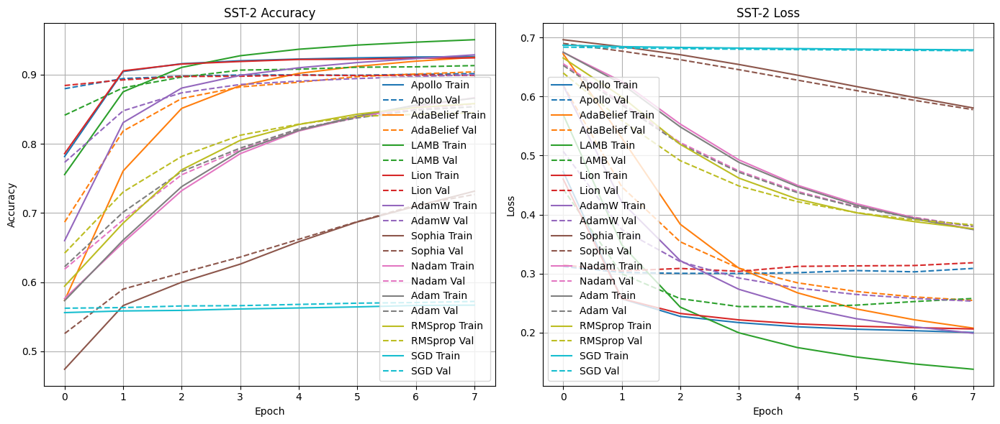

Saved test metrics plot to results/test_metrics_sst2.png


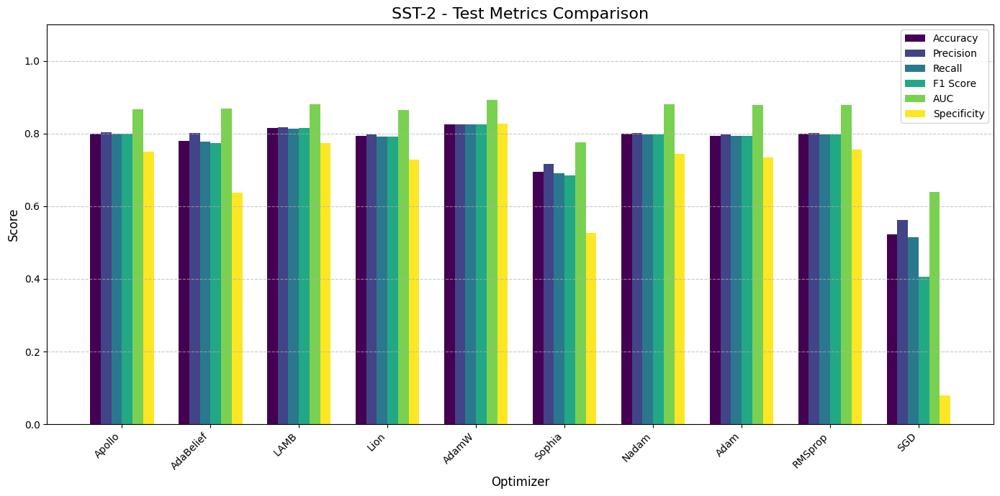


--- Generating Optimizer-Specific Plots ---
Saved ROC curve to results/roc_curve_sst2_Apollo.png


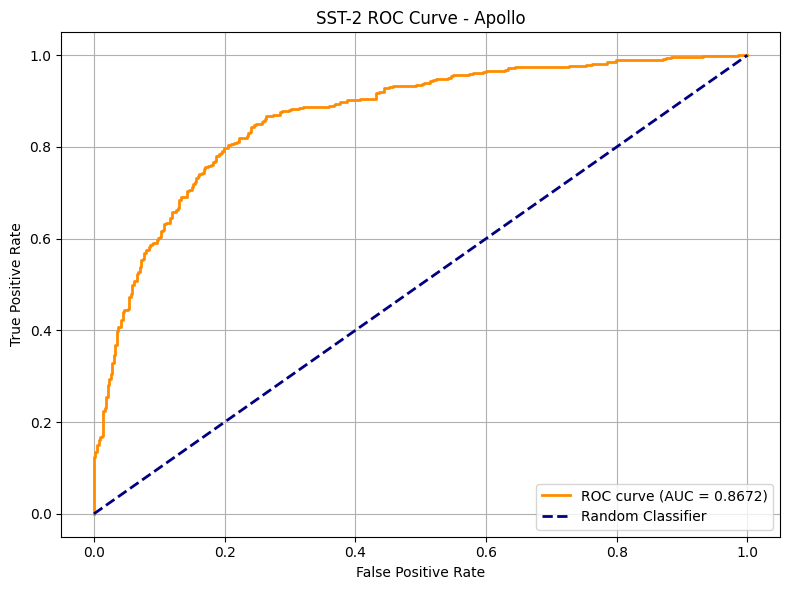

Saved raw confusion matrix to results/cm_raw_sst-2_Apollo.png


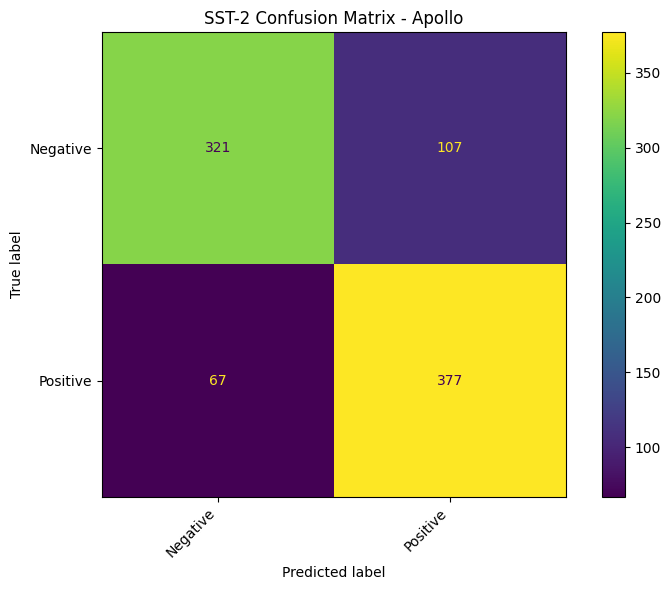

Saved normalized confusion matrix to results/cm_normalized_sst-2_Apollo.png


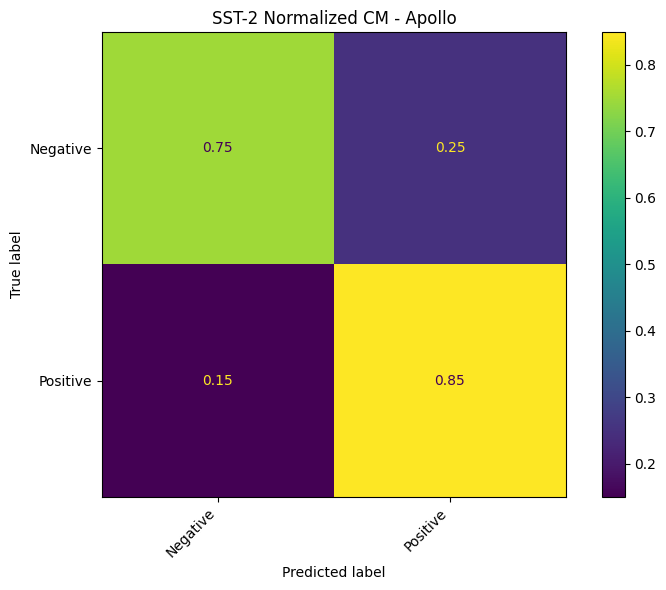

Saved ROC curve to results/roc_curve_sst2_AdaBelief.png


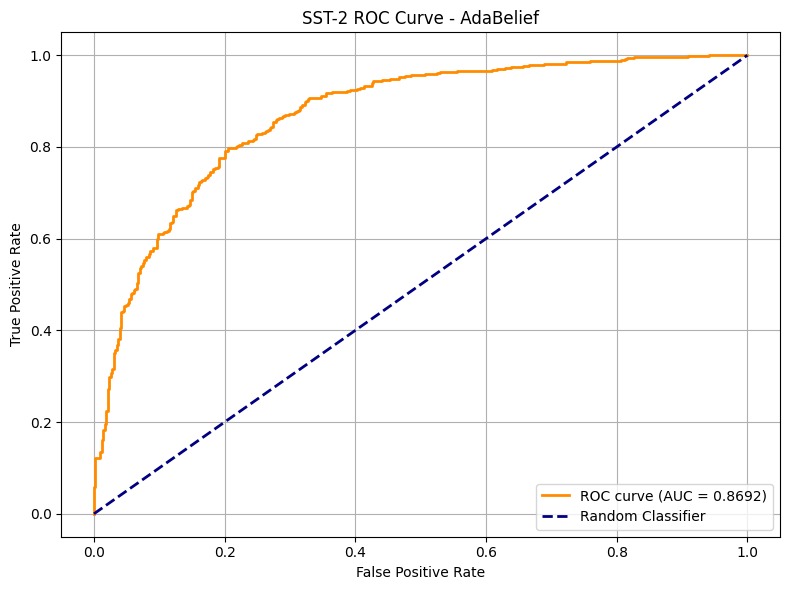

Saved raw confusion matrix to results/cm_raw_sst-2_AdaBelief.png


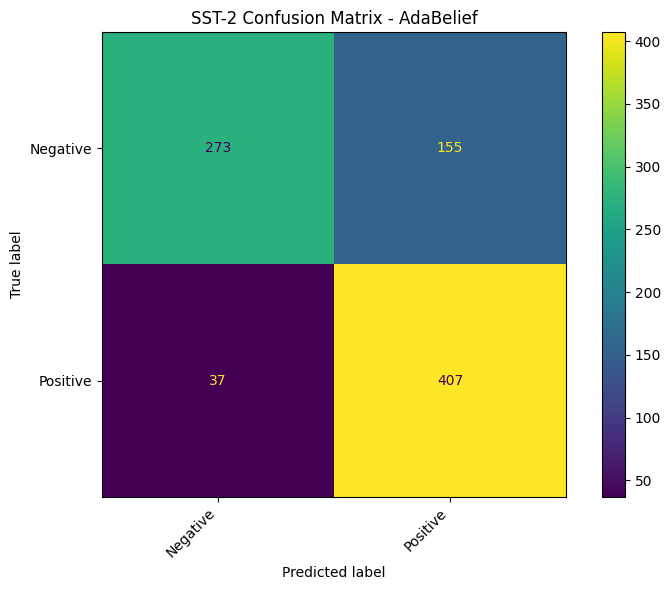

Saved normalized confusion matrix to results/cm_normalized_sst-2_AdaBelief.png


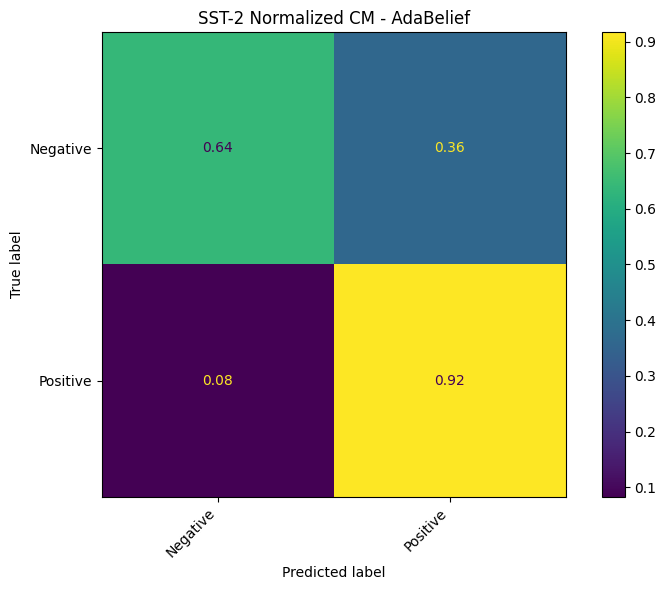

Saved ROC curve to results/roc_curve_sst2_LAMB.png


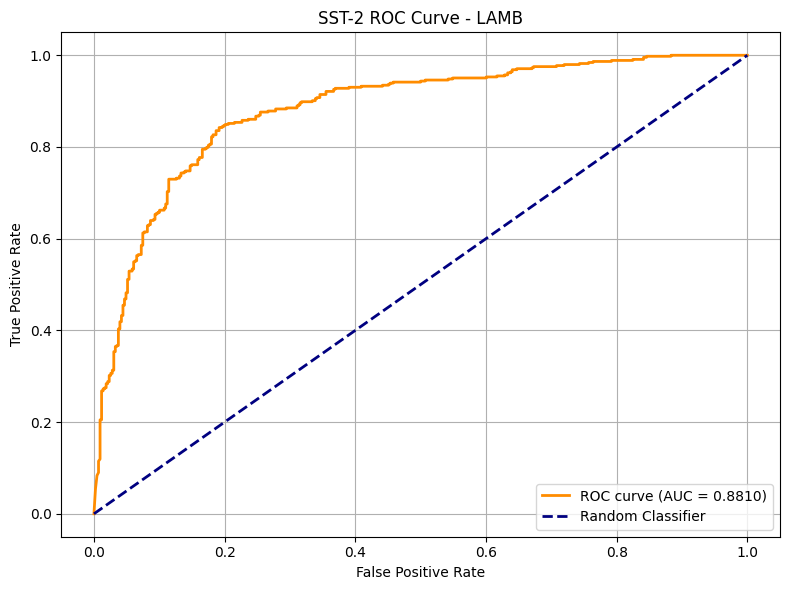

Saved raw confusion matrix to results/cm_raw_sst-2_LAMB.png


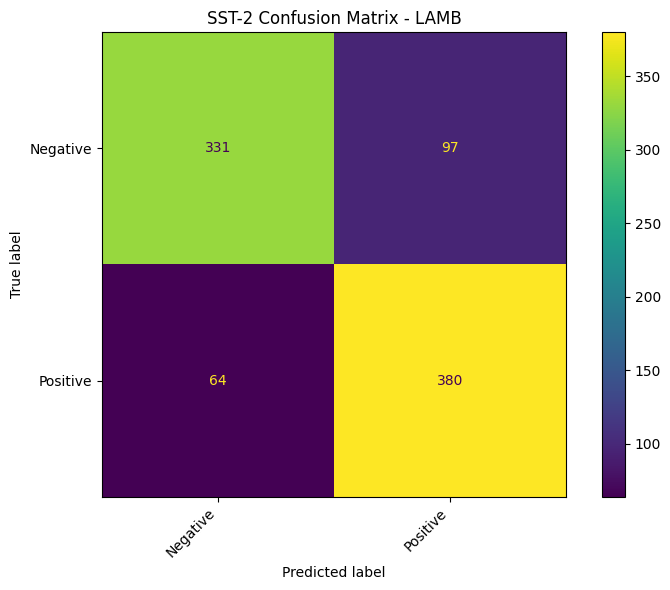

Saved normalized confusion matrix to results/cm_normalized_sst-2_LAMB.png


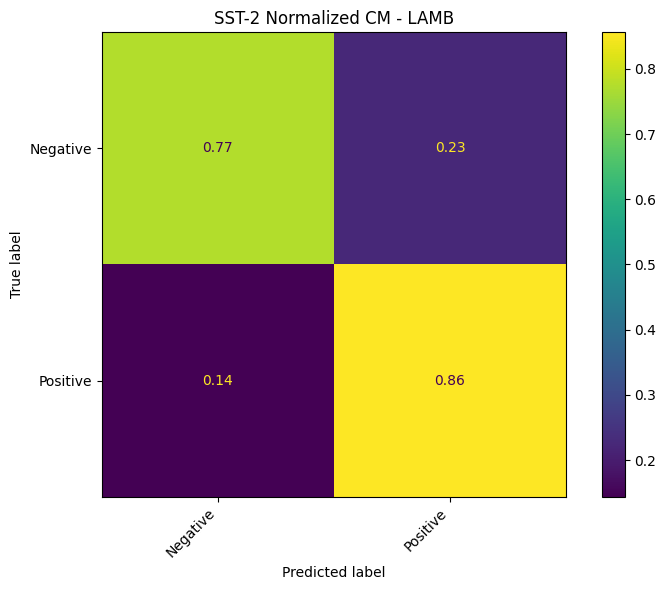

Saved ROC curve to results/roc_curve_sst2_Lion.png


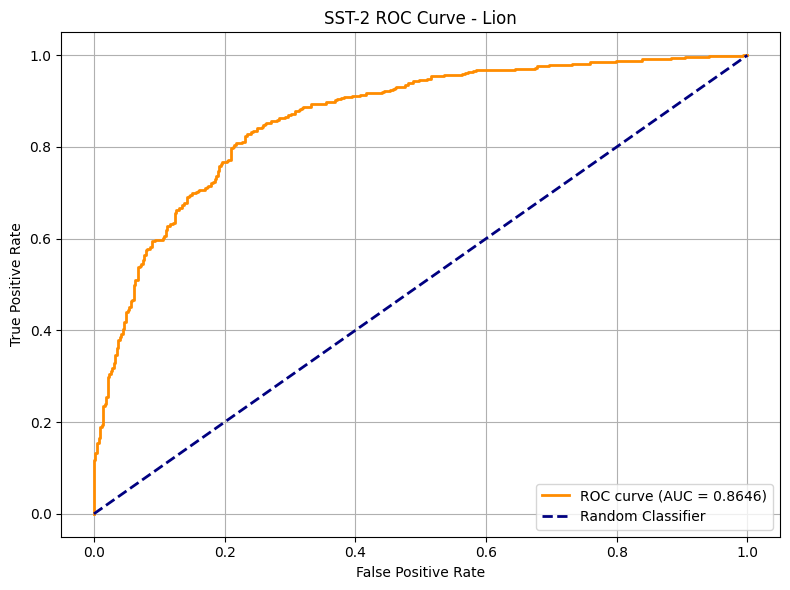

Saved raw confusion matrix to results/cm_raw_sst-2_Lion.png


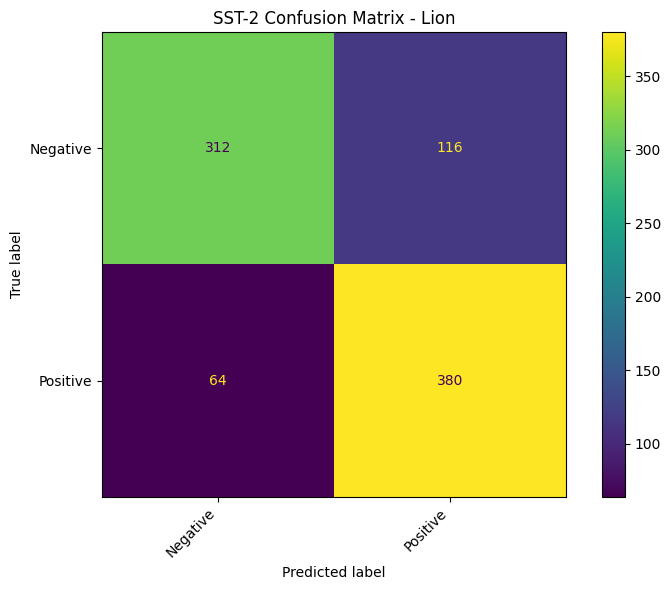

Saved normalized confusion matrix to results/cm_normalized_sst-2_Lion.png


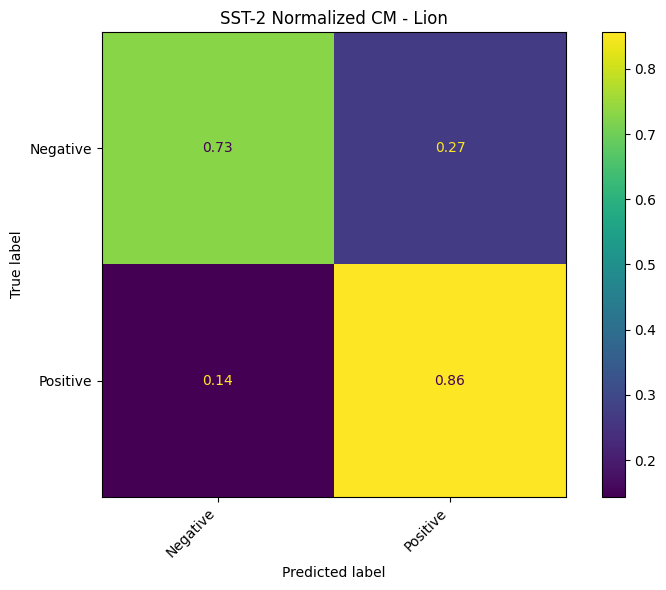

Saved ROC curve to results/roc_curve_sst2_AdamW.png


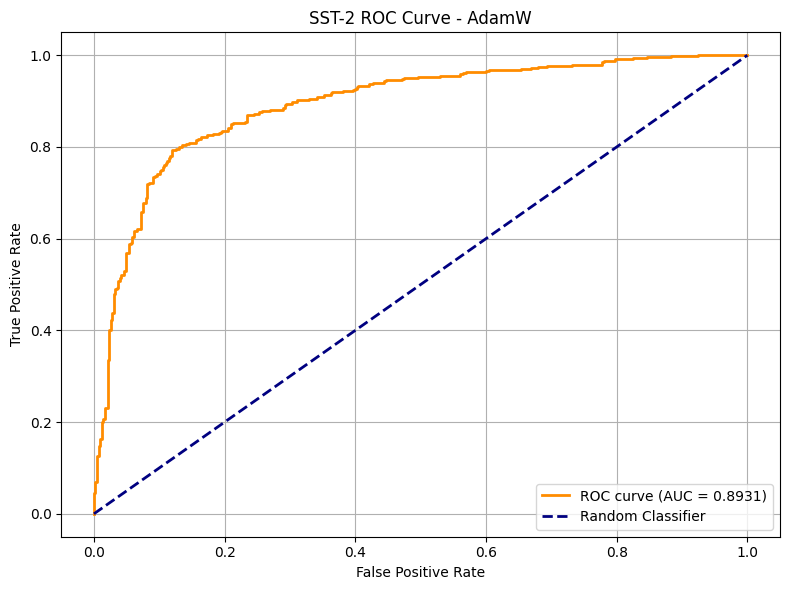

Saved raw confusion matrix to results/cm_raw_sst-2_AdamW.png


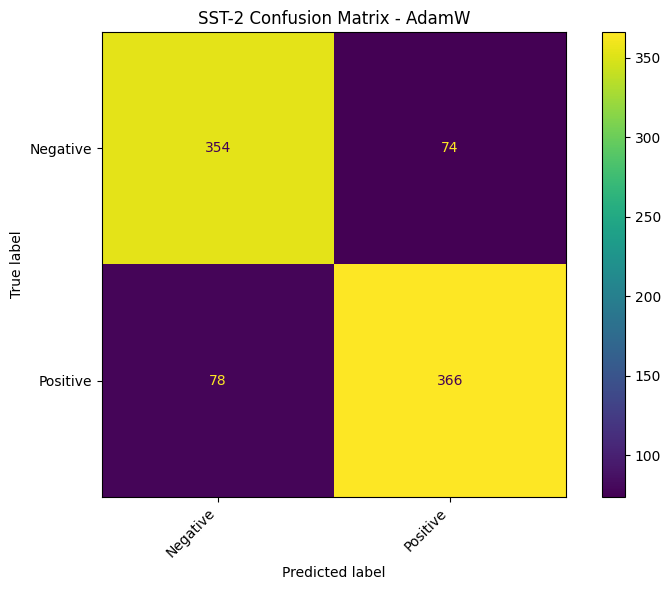

Saved normalized confusion matrix to results/cm_normalized_sst-2_AdamW.png


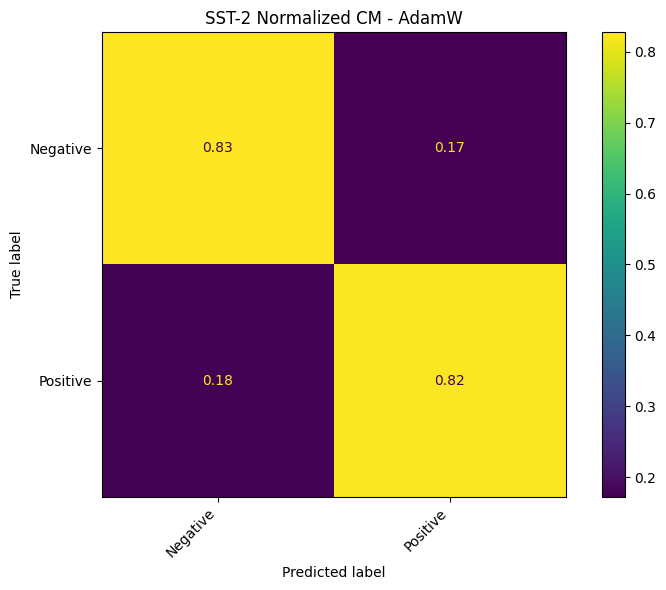

Saved ROC curve to results/roc_curve_sst2_Sophia.png


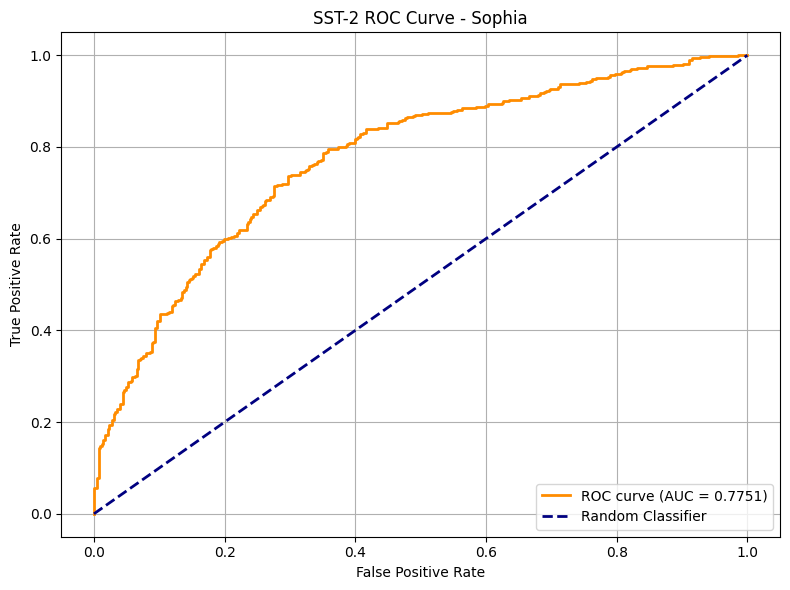

Saved raw confusion matrix to results/cm_raw_sst-2_Sophia.png


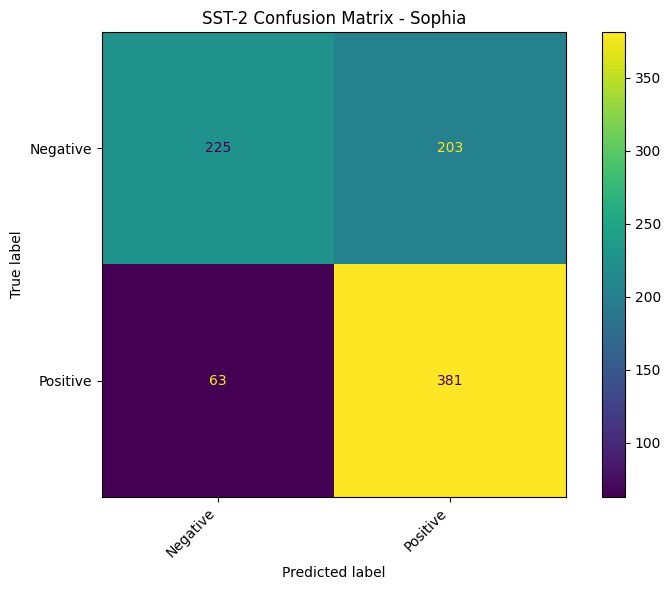

Saved normalized confusion matrix to results/cm_normalized_sst-2_Sophia.png


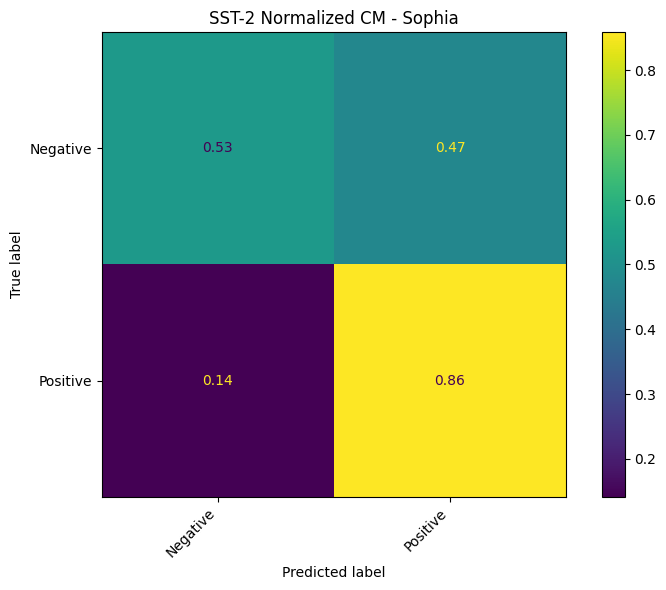

Saved ROC curve to results/roc_curve_sst2_Nadam.png


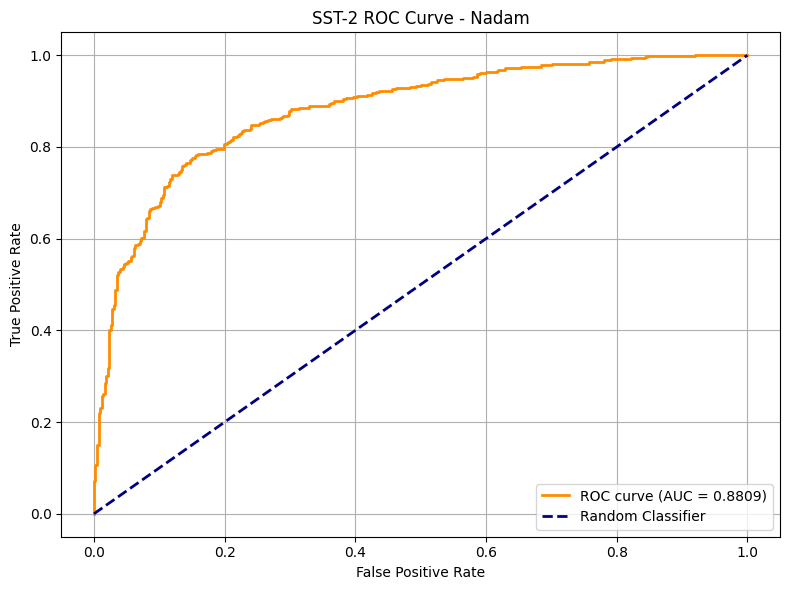

Saved raw confusion matrix to results/cm_raw_sst-2_Nadam.png


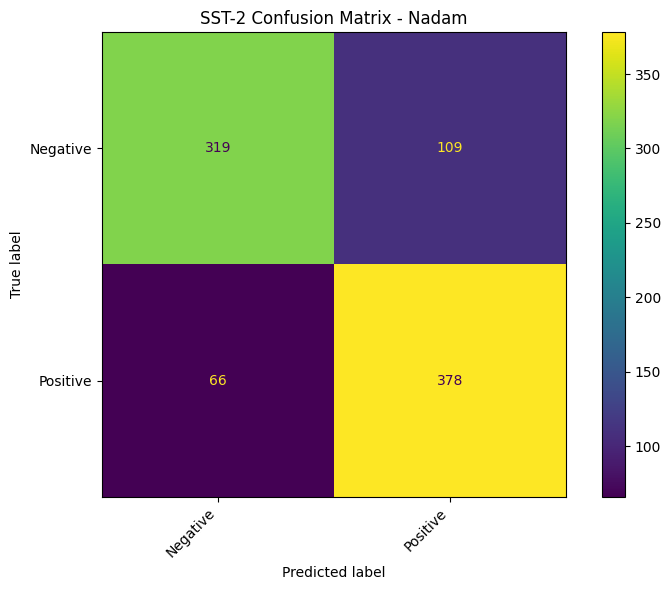

Saved normalized confusion matrix to results/cm_normalized_sst-2_Nadam.png


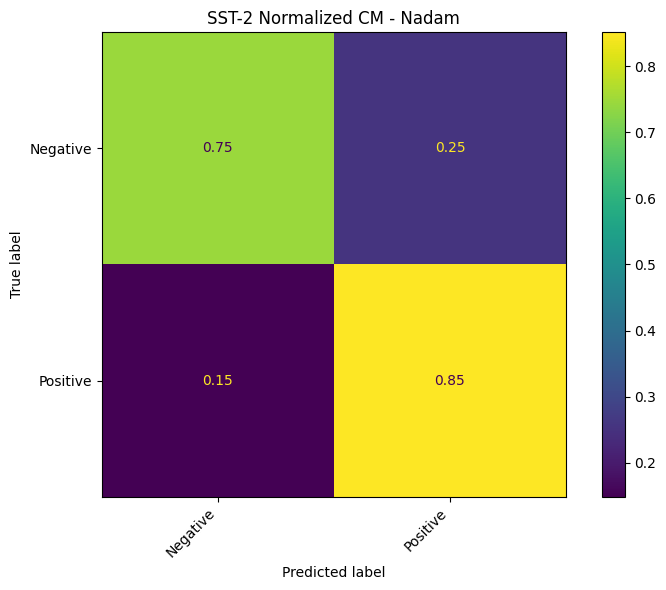

Saved ROC curve to results/roc_curve_sst2_Adam.png


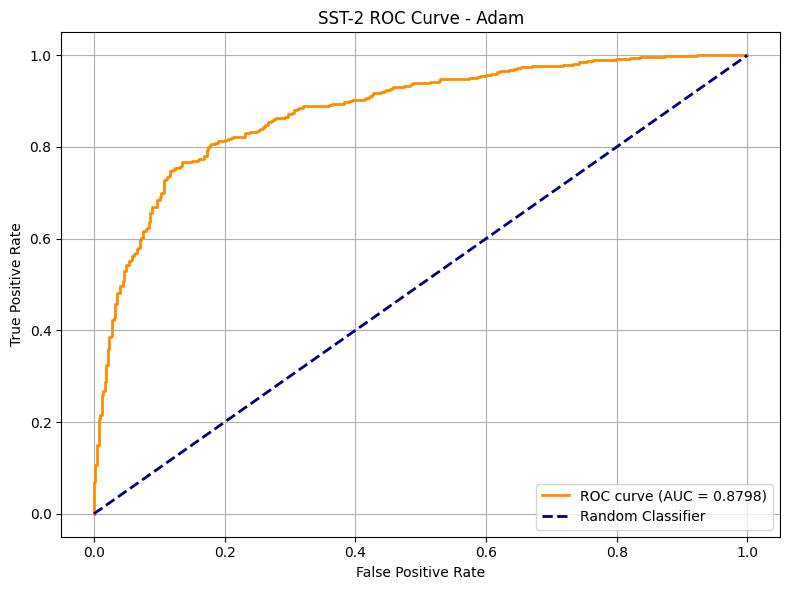

Saved raw confusion matrix to results/cm_raw_sst-2_Adam.png


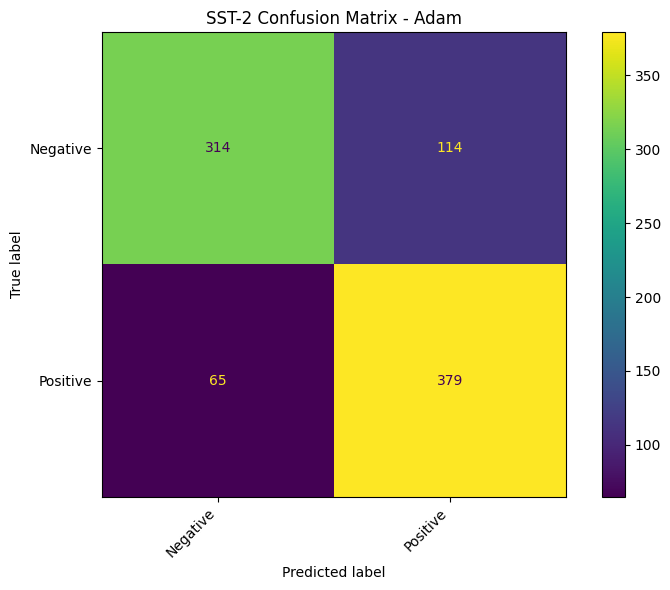

Saved normalized confusion matrix to results/cm_normalized_sst-2_Adam.png


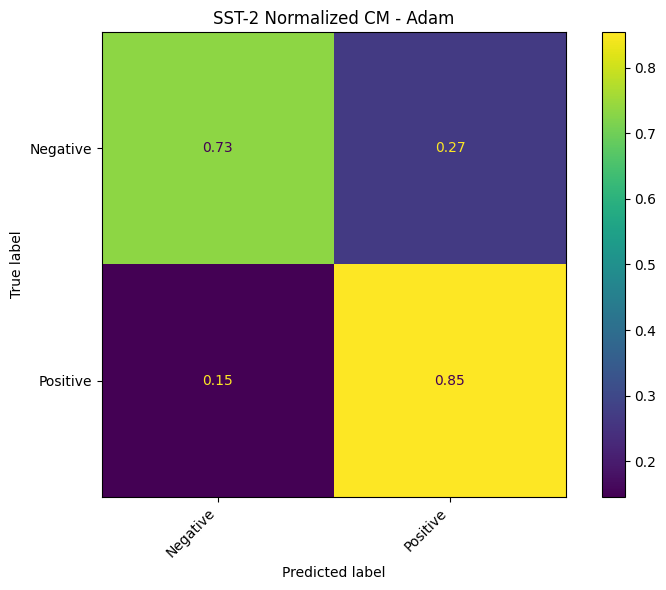

Saved ROC curve to results/roc_curve_sst2_RMSprop.png


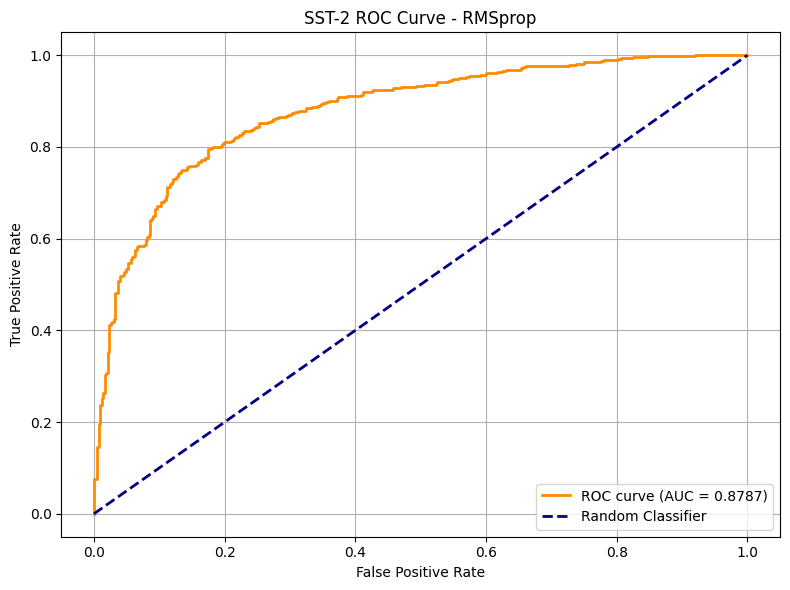

Saved raw confusion matrix to results/cm_raw_sst-2_RMSprop.png


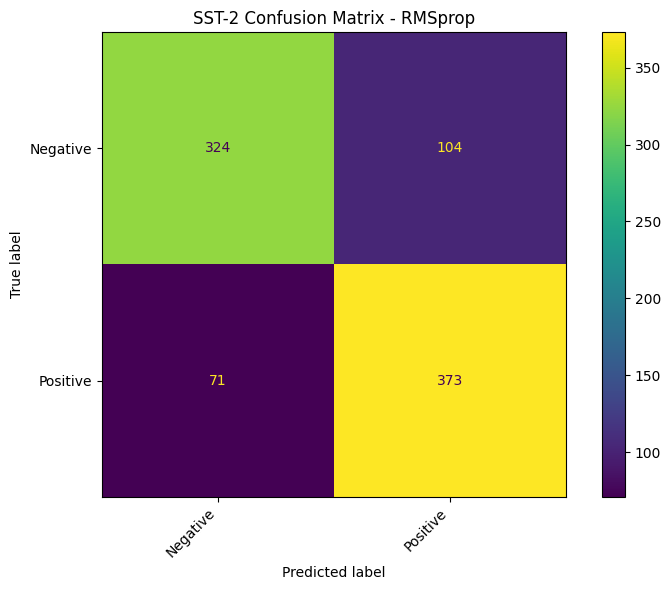

Saved normalized confusion matrix to results/cm_normalized_sst-2_RMSprop.png


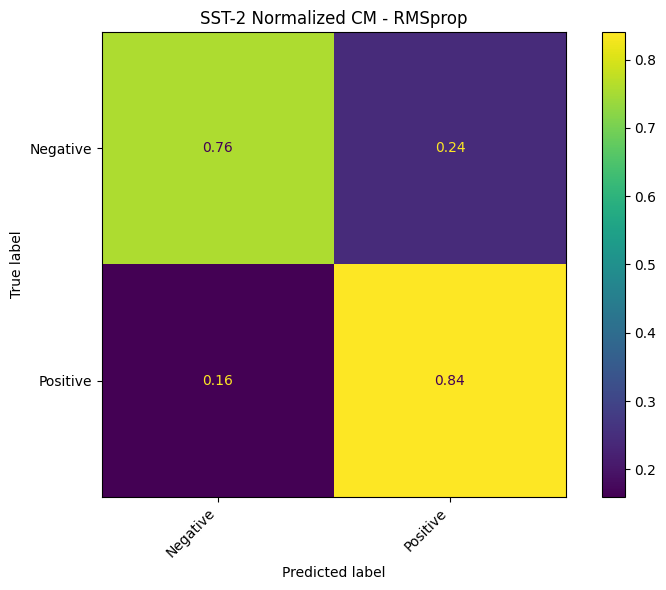

Saved ROC curve to results/roc_curve_sst2_SGD.png


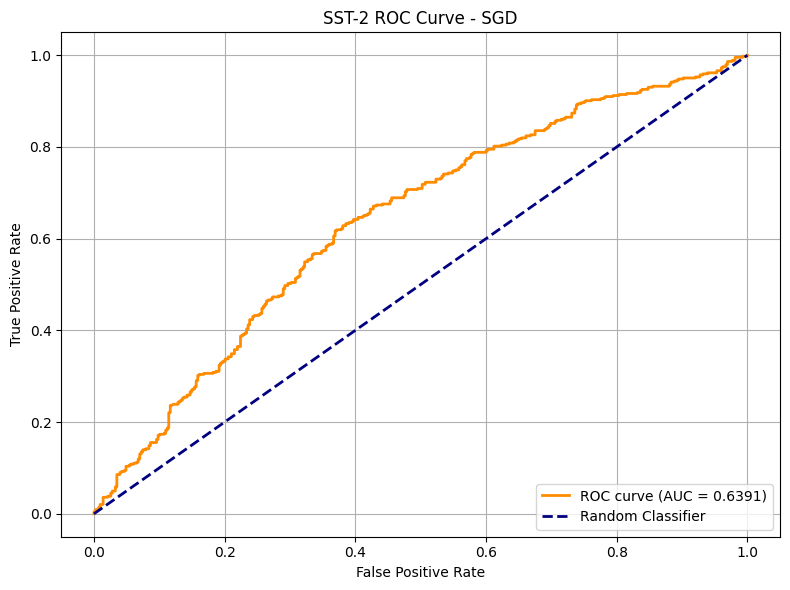

Saved raw confusion matrix to results/cm_raw_sst-2_SGD.png


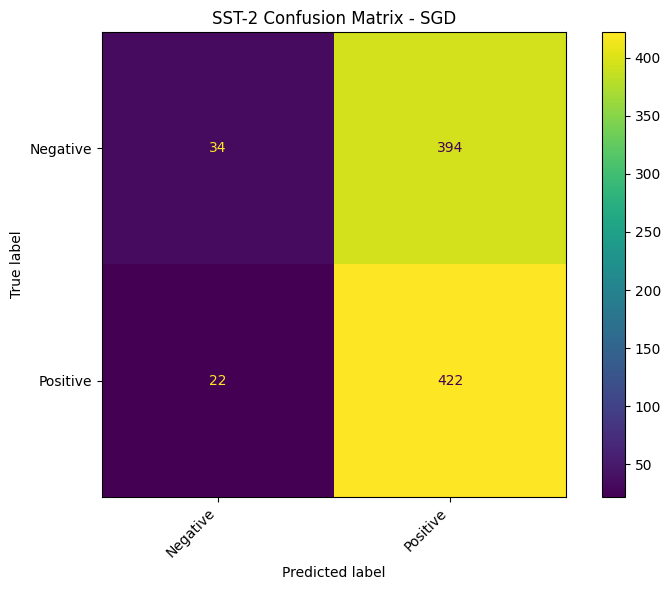

Saved normalized confusion matrix to results/cm_normalized_sst-2_SGD.png


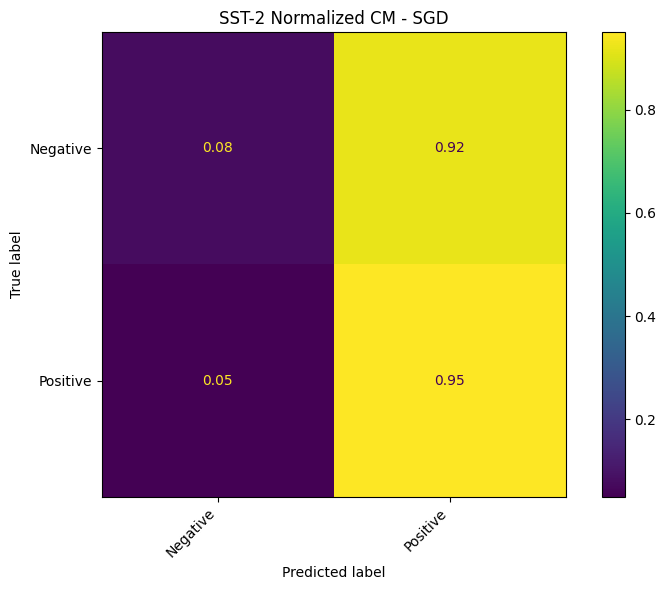

Saved raw results to results/benchmark_results_sst2.json
Saved LaTeX table to results/results_table_sst2.tex

=== LaTeX Table for SST-2 ===

\begin{table}[H]
\centering
\begin{tabular}{lcccccccc}\toprule
Optimizer & Test Loss & Test Acc & Precision & Recall & F1 & AUC & Specificity & Avg Epoch Time (s) \\ \midrule
Apollo & 0.6567 & 0.8005 & 0.8031 & 0.7995 & 0.7996 & 0.8672 & 0.7500 & 16.19 \\
AdaBelief & 0.7099 & 0.7798 & 0.8024 & 0.7773 & 0.7745 & 0.8692 & 0.6379 & 15.23 \\
LAMB & 0.8071 & 0.8154 & 0.8173 & 0.8146 & 0.8148 & 0.8810 & 0.7734 & 16.70 \\
Lion & 0.6759 & 0.7936 & 0.7980 & 0.7924 & 0.7923 & 0.8646 & 0.7290 & 14.97 \\
AdamW & 0.5116 & 0.8257 & 0.8256 & 0.8257 & 0.8257 & 0.8931 & 0.8271 & 15.40 \\
Sophia & 0.6023 & 0.6950 & 0.7168 & 0.6919 & 0.6849 & 0.7751 & 0.5257 & 15.40 \\
Nadam & 0.4403 & 0.7993 & 0.8024 & 0.7983 & 0.7984 & 0.8809 & 0.7453 & 15.22 \\
Adam & 0.4434 & 0.7947 & 0.7986 & 0.7936 & 0.7936 & 0.8798 & 0.7336 & 15.41 \\
RMSprop & 0.4422 & 0.7993 & 0.8011 & 0.79

In [ ]:
import os
import random
import time
from collections import Counter
import nltk
nltk.download('punkt_tab')
from nltk.tokenize import word_tokenize
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset, random_split
from torch.nn.utils.rnn import pad_sequence
from torch.utils.tensorboard import SummaryWriter
from datasets import load_dataset
from sklearn.metrics import (
    precision_score, recall_score, f1_score, confusion_matrix,
    ConfusionMatrixDisplay, roc_curve, auc
)
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
from huggingface_hub import notebook_login
from typing import Iterable, Tuple, Optional
import json

# ---------------------------
# Setup & Reproducibility
# ---------------------------
def set_seed(seed: int = 42):
    """Sets the random seed for reproducibility across libraries."""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False

print("Setting random seed for reproducibility...", flush=True)
set_seed()
# Corrected NLTK download call
nltk.download('punkt', quiet=True)

# Set the number of training epochs
num_epochs = 8

# Create a directory to save results
os.makedirs('results', exist_ok=True)

# ---------------------------
# Apollo Optimizer
# ---------------------------
import torch
import torch.optim as optim
import torch.nn.functional as F

class Apollo(optim.Optimizer):
    """
    Implements the Apollo (Adaptive Policy for Optimizer-space Linear Linking) algorithm.

    Apollo dynamically interpolates between AdamW and Lion-style updates
    based on the agreement between their proposed update directions. This removes
    the need for a fixed interpolation factor `gamma`.
    """
    def __init__(self, params, lr=1e-3, betas=(0.9, 0.999, 0.9), eps=1e-8,
                 weight_decay=1e-2):
        if not 0.0 <= lr: raise ValueError(f"Invalid learning rate: {lr}")
        if not 0.0 <= eps: raise ValueError(f"Invalid epsilon value: {eps}")
        if not 0.0 <= betas[0] < 1.0: raise ValueError(f"Invalid beta_1: {betas[0]}")
        if not 0.0 <= betas[1] < 1.0: raise ValueError(f"Invalid beta_2: {betas[1]}")
        if not 0.0 <= betas[2] < 1.0: raise ValueError(f"Invalid beta_3 for adaptation: {betas[2]}")
        if not 0.0 <= weight_decay: raise ValueError(f"Invalid weight_decay value: {weight_decay}")

        defaults = dict(lr=lr, betas=betas, eps=eps, weight_decay=weight_decay)
        super(Apollo, self).__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()

        for group in self.param_groups:
            beta1, beta2, beta3 = group['betas']

            for p in group['params']:
                if p.grad is None: continue
                grad = p.grad
                if grad.is_sparse: raise RuntimeError('Apollo does not support sparse gradients.')

                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['exp_avg'] = torch.zeros_like(p, memory_format=torch.preserve_format)
                    state['exp_avg_sq'] = torch.zeros_like(p, memory_format=torch.preserve_format)
                    # New state for tracking update agreement (smoothed cosine similarity)
                    state['update_agreement'] = torch.zeros((), device=p.device)


                exp_avg, exp_avg_sq = state['exp_avg'], state['exp_avg_sq']
                state['step'] += 1

                # Decoupled weight decay (AdamW style)
                if group['weight_decay'] != 0:
                    p.add_(p, alpha=-group['weight_decay'] * group['lr'])

                # Update biased first and second moment estimates
                exp_avg.mul_(beta1).add_(grad, alpha=1 - beta1)
                exp_avg_sq.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)

                # Bias correction
                bias_correction1 = 1 - beta1 ** state['step']
                bias_correction2 = 1 - beta2 ** state['step']

                m_hat = exp_avg / bias_correction1
                v_hat = exp_avg_sq / bias_correction2

                # --- High-Novelty Adaptive Mechanism ---
                # 1. Calculate the two candidate updates
                denom = v_hat.sqrt().add_(group['eps'])
                update_adam = m_hat / denom
                update_lion = torch.sign(m_hat)

                # 2. Measure agreement using cosine similarity
                # Use a small epsilon in norm to prevent division by zero for zero-updates
                cos_sim = F.cosine_similarity(update_adam.flatten(), update_lion.flatten(), dim=0, eps=1e-10)

                # 3. Smooth the agreement factor using an EMA
                state['update_agreement'].mul_(beta3).add_(cos_sim, alpha=1 - beta3)

                # 4. Dynamically set gamma based on smoothed agreement
                # This maps the cosine similarity from [-1, 1] to a gamma in [0, 1]
                gamma = (state['update_agreement'] + 1) / 2.0
                # ----------------------------------------

                # Interpolate between the two updates using the DYNAMIC gamma
                final_update = (1 - gamma) * update_adam + gamma * update_lion

                # Apply the final update
                p.add_(final_update, alpha=-group['lr'])

        return loss

# ---------------------------
# AdaBelief Optimizer
# ---------------------------
class AdaBelief(optim.Optimizer):
    """Implements AdaBelief algorithm."""
    def __init__(self, params, lr=1e-3, betas=(0.9, 0.999), eps=1e-8, weight_decay=1e-3, rectify=True):
        defaults = dict(lr=lr, betas=betas, eps=eps, weight_decay=weight_decay, rectify=rectify)
        super(AdaBelief, self).__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()

        for group in self.param_groups:
            lr, beta1, beta2, eps, wd, rectify = group['lr'], group['betas'][0], group['betas'][1], group['eps'], group['weight_decay'], group['rectify']
            for p in group['params']:
                if p.grad is None: continue
                grad = p.grad
                if grad.is_sparse: raise RuntimeError('AdaBelief does not support sparse gradients')
                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m'] = torch.zeros_like(p)
                    state['s'] = torch.zeros_like(p)
                m, s = state['m'], state['s']
                state['step'] += 1
                step = state['step']
                if wd != 0: p.mul_(1.0 - lr * wd)
                m.mul_(beta1).add_(grad, alpha=1 - beta1)
                grad_residual = grad - m
                s.mul_(beta2).addcmul_(grad_residual, grad_residual, value=1 - beta2)
                bias_corr1, bias_corr2 = 1 - beta1 ** step, 1 - beta2 ** step
                m_hat, s_hat = m / bias_corr1, s / bias_corr2
                if rectify:
                    rho_inf = 2 / (1 - beta2) - 1
                    rho_t = rho_inf - 2 * step * (beta2 ** step) / (1 - beta2 ** step)
                    if rho_t > 5.0:
                        rect = ((rho_t - 4) * (rho_t - 2) * rho_inf / ((rho_inf - 4) * (rho_inf - 2) * rho_t)) ** 0.5
                        denom = (s_hat.sqrt() + eps)
                        p.addcdiv_(m_hat, denom, value=-lr * rect)
                    else:
                        p.add_(m_hat, alpha=-lr)
                else:
                    denom = (s_hat.sqrt() + eps)
                    p.addcdiv_(m_hat, denom, value=-lr)
        return loss

# ---------------------------
# Sophia Optimizer
# ---------------------------
class Sophia(optim.Optimizer):
    """Implements Sophia algorithm."""
    def __init__(self, params, lr=1e-3, beta1=0.965, beta2=0.99, rho=0.04, weight_decay=1e-3, eps=1e-8):
        defaults = dict(lr=lr, beta1=beta1, beta2=beta2, rho=rho, weight_decay=weight_decay, eps=eps)
        super(Sophia, self).__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = closure() if closure is not None else None
        for group in self.param_groups:
            for p in group['params']:
                if p.grad is None: continue
                grad = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m'] = torch.zeros_like(p)
                    state['hess_ema'] = torch.ones_like(p)
                m, hess_ema = state['m'], state['hess_ema']
                beta1, beta2, rho, lr, wd, eps = group['beta1'], group['beta2'], group['rho'], group['lr'], group['weight_decay'], group['eps']
                m.mul_(beta1).add_(grad, alpha=1 - beta1)
                hess_ema.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)
                denom = hess_ema.add(eps)
                scaled_grad = torch.clamp(m / denom, -rho, rho)
                if wd != 0: p.data.mul_(1 - lr * wd)
                p.add_(scaled_grad, alpha=-lr)
                state['step'] += 1
        return loss

# ---------------------------
# Lion Optimizer
# ---------------------------
class Lion(optim.Optimizer):
    """Implements Lion algorithm."""
    def __init__(self, params, lr=1e-3, betas=(0.9, 0.99), weight_decay=1e-3):
        defaults = dict(lr=lr, betas=betas, weight_decay=weight_decay)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = closure() if closure else None
        for group in self.param_groups:
            for p in group['params']:
                if p.grad is None: continue
                grad = p.grad.data
                state = self.state[p]
                if len(state) == 0: state['exp_avg'] = torch.zeros_like(p)
                exp_avg = state['exp_avg']
                beta1, lr, wd = group['betas'][0], group['lr'], group['weight_decay']
                exp_avg.mul_(beta1).add_(grad, alpha=1 - beta1)
                if wd != 0: p.data.mul_(1 - lr * wd)
                p.add_(torch.sign(exp_avg), alpha=-lr)
        return loss

# ---------------------------
# Text Classification Model
# ---------------------------
class TextClassificationModel(nn.Module):
    """A simple text classification model with an embedding layer."""
    def __init__(self, vocab_size, embed_dim=64, num_class=2, pad_idx=1):
        super().__init__()
        self.embedding = nn.Embedding(vocab_size, embed_dim, padding_idx=pad_idx)
        self.classifier = nn.Linear(embed_dim, num_class)

    def forward(self, text):
        emb = self.embedding(text)
        pooled = emb.mean(dim=1)
        return self.classifier(pooled)

# ---------------------------
# Data Preparation: SST-2
# ---------------------------
print("Loading SST-2 dataset...", flush=True)
dataset = load_dataset("sst2")
print("Dataset loaded. Splitting data...", flush=True)
train_raw, val_raw = random_split(dataset['train'], [int(0.9*len(dataset['train'])), len(dataset['train'])-int(0.9*len(dataset['train']))])
test_raw = dataset['validation']

print("Building vocabulary...", flush=True)
counter = Counter()
for item in train_raw:
    counter.update(word_tokenize(item['sentence'].lower()))
vocab = {'<unk>': 0, '<pad>': 1, **{tok: i for i, tok in enumerate(counter, 2)}}
pad_idx, unk_idx = vocab['<pad>'], vocab['<unk>']
print(f"Vocabulary built. Size: {len(vocab)}", flush=True)

def text_pipeline(text):
    return [vocab.get(tok, unk_idx) for tok in word_tokenize(text.lower())]

class SST2Dataset(Dataset):
    def __init__(self, subset): self.subset = subset
    def __len__(self): return len(self.subset)
    def __getitem__(self, idx): return self.subset[idx]['sentence'], self.subset[idx]['label']

def collate_batch(batch):
    texts, labels = zip(*batch)
    seqs = [torch.tensor(text_pipeline(t), dtype=torch.long) for t in texts]
    return pad_sequence(seqs, batch_first=True, padding_value=pad_idx), torch.tensor(labels, dtype=torch.long)

print("Creating data loaders...", flush=True)
train_loader_sst2 = DataLoader(SST2Dataset(train_raw), batch_size=64, shuffle=True, collate_fn=collate_batch)
val_loader_sst2 = DataLoader(SST2Dataset(val_raw), batch_size=64, shuffle=False, collate_fn=collate_batch)
test_loader_sst2 = DataLoader(SST2Dataset(test_raw), batch_size=64, shuffle=False, collate_fn=collate_batch)
sst2_class_names = ['Negative', 'Positive']
print("Data preparation complete.", flush=True)

# ---------------------------
# Generic Train & Evaluate Function
# ---------------------------
def train_model(model_fn, optimizer_factory, train_loader, val_loader, test_loader, num_epochs=num_epochs, dataset_name="Dataset"):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}", flush=True)
    model = model_fn().to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optimizer_factory(model.parameters())
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=1, gamma=0.9)
    writer = SummaryWriter(log_dir=f"runs/{dataset_name}_{optimizer.__class__.__name__}_{int(time.time())}")
    history = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': []}
    start_time = time.time()

    for epoch in range(num_epochs):
        model.train()
        train_loss, correct, total = 0.0, 0, 0
        for data, targets in train_loader:
            data, targets = data.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(data)
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * data.size(0)
            _, preds = outputs.max(1)
            total += targets.size(0)
            correct += preds.eq(targets).sum().item()
        train_loss /= total
        train_acc = correct / total
        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)

        model.eval()
        val_loss, val_correct, val_total = 0.0, 0, 0
        with torch.no_grad():
            for data, targets in val_loader:
                data, targets = data.to(device), targets.to(device)
                outputs = model(data)
                loss = criterion(outputs, targets)
                val_loss += loss.item() * data.size(0)
                _, preds = outputs.max(1)
                val_total += targets.size(0)
                val_correct += preds.eq(targets).sum().item()
        val_loss /= val_total
        val_acc = val_correct / val_total
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)
        print(f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Acc: {train_acc:.4f} | Val Loss: {val_loss:.4f}, Acc: {val_acc:.4f}", flush=True)
        scheduler.step()

    model.eval()
    test_loss, test_correct, test_total = 0.0, 0, 0
    all_preds, all_targets, all_probs = [], [], []
    with torch.no_grad():
        for data, targets in test_loader:
            data, targets = data.to(device), targets.to(device)
            outputs = model(data)
            loss = criterion(outputs, targets)
            test_loss += loss.item() * data.size(0)
            _, preds = outputs.max(1)
            probs = torch.softmax(outputs, dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_targets.extend(targets.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
            test_correct += preds.eq(targets).sum().item()
            test_total += targets.size(0)

    # --- METRIC CALCULATIONS ---
    test_loss /= test_total
    test_acc = test_correct / test_total
    precision = precision_score(all_targets, all_preds, average='macro', zero_division=0)
    recall = recall_score(all_targets, all_preds, average='macro', zero_division=0)
    f1 = f1_score(all_targets, all_preds, average='macro', zero_division=0)

    # Calculate Confusion Matrix for Specificity
    cm = confusion_matrix(all_targets, all_preds)
    tn, fp, fn, tp = cm.ravel() if len(cm.ravel()) == 4 else (cm[0,0], 0, 0, 0) # Handle edge cases
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0.0

    # Calculate AUC
    y_score = np.array(all_probs)[:, 1] # Probability of the positive class
    fpr, tpr, _ = roc_curve(all_targets, y_score)
    roc_auc = auc(fpr, tpr)

    history.update({
        'test_loss': test_loss, 'test_acc': test_acc, 'precision': precision,
        'recall': recall, 'f1': f1, 'specificity': specificity, 'auc': roc_auc,
        'runtime': time.time() - start_time,
        'targets': all_targets, 'preds': all_preds, 'probs': all_probs
    })
    print(f"\nFinal Results on {dataset_name}: Test Loss: {test_loss:.4f}, Acc: {test_acc:.4f}, F1: {f1:.4f}, AUC: {roc_auc:.4f}\n", flush=True)
    writer.close()
    return history

# ---------------------------
# Optimizers
# ---------------------------
optimizers = {
    'Apollo': lambda params: Apollo(params,lr=1e-3, betas=(0.9, 0.999, 0.9), eps=1e-8,
                 weight_decay=1e-4),
    'AdaBelief': lambda params: AdaBelief(params, lr=1e-3, weight_decay=1e-4),
    'LAMB': lambda params: LAMB(params, lr=1e-3, weight_decay=1e-4),
    'Lion': lambda params: Lion(params, lr=1e-3, weight_decay=1e-4),
    'AdamW': lambda params: optim.AdamW(params, lr=1e-3, weight_decay=1e-4),
    'Sophia': lambda params: Sophia(params, lr=1e-3, weight_decay=1e-4),
    'Nadam': lambda params: optim.NAdam(params, lr=1e-3, weight_decay=1e-4),
    'Adam': lambda params: optim.Adam(params, lr=1e-3, weight_decay=1e-4),
    'RMSprop': lambda params: optim.RMSprop(params, lr=1e-3, weight_decay=1e-4),
    'SGD': lambda params: optim.SGD(params, lr=1e-3, momentum=0.9, weight_decay=1e-4),
}

# ---------------------------
# Run Experiments for SST-2
# ---------------------------
results_sst2 = {}
for opt_name, opt_factory in optimizers.items():
    print(f'\n--- SST-2: Training with {opt_name} ---', flush=True)
    results_sst2[opt_name] = train_model(
        lambda: TextClassificationModel(len(vocab), 64, 2, pad_idx),
        opt_factory, train_loader_sst2, val_loader_sst2, test_loader_sst2,
        num_epochs=num_epochs, dataset_name="SST-2"
    )

# ---------------------------
# Plotting Functions
# ---------------------------
def plot_learning_curves(results, dataset_name, save_path=None):
    """Plots and saves training and validation accuracy and loss curves."""
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    colors = plt.cm.tab10(np.linspace(0, 1, len(results)))
    for idx, opt in enumerate(results):
        axes[0].plot(results[opt]['train_acc'], color=colors[idx], linestyle='-', label=f'{opt} Train')
        axes[0].plot(results[opt]['val_acc'], color=colors[idx], linestyle='--', label=f'{opt} Val')
    axes[0].set_title(f'{dataset_name} Accuracy'); axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Accuracy'); axes[0].legend(); axes[0].grid(True)
    for idx, opt in enumerate(results):
        axes[1].plot(results[opt]['train_loss'], color=colors[idx], linestyle='-', label=f'{opt} Train')
        axes[1].plot(results[opt]['val_loss'], color=colors[idx], linestyle='--', label=f'{opt} Val')
    axes[1].set_title(f'{dataset_name} Loss'); axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Loss'); axes[1].legend(); axes[1].grid(True)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path)
        print(f"Saved learning curves to {save_path}")
    plt.show()

def plot_test_metrics(results, dataset_name, save_path=None):
    """Plots and saves a bar chart comparing final test metrics across optimizers."""
    metrics = ['test_acc', 'precision', 'recall', 'f1', 'auc', 'specificity']
    metric_names = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC', 'Specificity']
    colors = plt.cm.viridis(np.linspace(0, 1, len(metrics)))
    plt.figure(figsize=(14, 7)); bar_width = 0.12; x = np.arange(len(results))
    for i, metric in enumerate(metrics):
        values = [results[opt][metric] for opt in results]
        plt.bar(x + i * bar_width, values, width=bar_width, color=colors[i], label=metric_names[i])
    plt.title(f'{dataset_name} - Test Metrics Comparison', fontsize=16); plt.xlabel('Optimizer', fontsize=12); plt.ylabel('Score', fontsize=12)
    plt.xticks(x + bar_width * (len(metrics)/2 - 0.5), results.keys(), rotation=45, ha="right"); plt.ylim(0, 1.1); plt.legend(); plt.grid(axis='y', linestyle='--', alpha=0.7); plt.tight_layout()
    if save_path:
        plt.savefig(save_path)
        print(f"Saved test metrics plot to {save_path}")
    plt.show()

def plot_roc_curve_for_optimizer(result, opt_name, dataset_name, save_path=None):
    """Plots and saves the ROC curve for a single optimizer's results."""
    y_true = result['targets']
    y_score = np.array(result['probs'])[:, 1]
    fpr, tpr, _ = roc_curve(y_true, y_score)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Classifier')
    plt.xlabel('False Positive Rate'); plt.ylabel('True Positive Rate')
    plt.title(f'{dataset_name} ROC Curve - {opt_name}'); plt.legend(loc="lower right"); plt.grid(True)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path)
        print(f"Saved ROC curve to {save_path}")
    plt.show()

def plot_confusion_matrices_for_optimizer(result, opt_name, class_names, dataset_name, save_path_dir=None):
    """Calculates, plots, and saves raw and normalized confusion matrices."""
    y_true = result['targets']
    y_pred = result['preds']

    # Raw Confusion Matrix
    cm = confusion_matrix(y_true, y_pred)
    fig, ax = plt.subplots(figsize=(8, 6))
    display = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    display.plot(cmap='viridis', ax=ax, values_format='d')
    title = f'{dataset_name} Confusion Matrix - {opt_name}'
    plt.title(title); plt.xticks(rotation=45, ha='right'); plt.tight_layout()
    if save_path_dir:
        path = os.path.join(save_path_dir, f'cm_raw_{dataset_name.lower()}_{opt_name}.png')
        plt.savefig(path)
        print(f"Saved raw confusion matrix to {path}")
    plt.show()

    # Normalized Confusion Matrix
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    cm_norm = np.nan_to_num(cm_norm) # handle cases with no true samples for a class
    fig_norm, ax_norm = plt.subplots(figsize=(8, 6))
    display_norm = ConfusionMatrixDisplay(confusion_matrix=cm_norm, display_labels=class_names)
    display_norm.plot(cmap='viridis', ax=ax_norm, values_format='.2f')
    title_norm = f'{dataset_name} Normalized CM - {opt_name}'
    plt.title(title_norm); plt.xticks(rotation=45, ha='right'); plt.tight_layout()
    if save_path_dir:
        path_norm = os.path.join(save_path_dir, f'cm_normalized_{dataset_name.lower()}_{opt_name}.png')
        plt.savefig(path_norm)
        print(f"Saved normalized confusion matrix to {path_norm}")
    plt.show()

# ---------------------------
# LaTeX Table Generation
# ---------------------------
def generate_latex_table(results, dataset_name):
    """Generates a LaTeX table with AUC, Specificity, and Avg Epoch Time."""
    header = (
        "\\begin{table}[H]\n\\centering\n"
        "\\begin{tabular}{lcccccccc}\\toprule\n"
        "Optimizer & Test Loss & Test Acc & Precision & Recall & F1 & AUC & Specificity & Avg Epoch Time (s) \\\\ \\midrule\n"
    )

    footer = (
        "\\bottomrule\n\\end{tabular}\n"
        f"\\caption{{Performance Metrics for {dataset_name}}}\n"
        f"\\label{{tab:{dataset_name.lower().replace(' ', '_')}_perf}}\n"
        "\\end{table}"
    )

    rows = []
    for opt, m in results.items():
        avg_epoch_time = m['runtime'] / num_epochs
        rows.append(
            f"{opt} & {m['test_loss']:.4f} & {m['test_acc']:.4f} & "
            f"{m['precision']:.4f} & {m['recall']:.4f} & {m['f1']:.4f} & "
            f"{m['auc']:.4f} & {m['specificity']:.4f} & {avg_epoch_time:.2f} \\\\"
        )

    return header + "\n".join(rows) + "\n" + footer

# ---------------------------
# Generate and Save Artifacts
# ---------------------------
print("\n--- Generating and Saving Artifacts for SST-2 ---", flush=True)

# --- Save Comparison Plots ---
plot_learning_curves(results_sst2, "SST-2", save_path="results/learning_curves_sst2.png")
plot_test_metrics(results_sst2, "SST-2", save_path="results/test_metrics_sst2.png")

# --- Generate and Save Optimizer-Specific Plots ---
print("\n--- Generating Optimizer-Specific Plots ---", flush=True)
for opt_name, result in results_sst2.items():
    # Plot and save ROC curve for each optimizer
    roc_save_path = os.path.join('results', f'roc_curve_sst2_{opt_name}.png')
    plot_roc_curve_for_optimizer(result, opt_name, "SST-2", save_path=roc_save_path)

    # Plot and save confusion matrices for each optimizer
    plot_confusion_matrices_for_optimizer(result, opt_name, sst2_class_names, "SST-2", save_path_dir='results')


# --- Save Raw Results Dictionary ---
# Custom JSON encoder to handle numpy types
class NumpyEncoder(json.JSONEncoder):
    def default(self, obj):
        if isinstance(obj, np.ndarray):
            return obj.tolist()
        if isinstance(obj, np.integer):
            return int(obj)
        if isinstance(obj, np.floating):
            return float(obj)
        return super(NumpyEncoder, self).default(obj)

results_path = "results/benchmark_results_sst2.json"
with open(results_path, 'w') as f:
    json.dump(results_sst2, f, indent=4, cls=NumpyEncoder)
print(f"Saved raw results to {results_path}")


# --- Save LaTeX Table ---
latex_table = generate_latex_table(results_sst2, "SST-2")
table_path = "results/results_table_sst2.tex"
with open(table_path, 'w') as f:
    f.write(latex_table)
print(f"Saved LaTeX table to {table_path}")

print("\n=== LaTeX Table for SST-2 ===\n")
print(latex_table)

print("\n--- Script Finished ---", flush=True)


In [ ]:
from google.colab import files
import os
import zipfile

# Define the directory to zip
results_dir = "/content/results"
# Define the name for the zip file
zip_filename = "/content/results.zip"

# Create a ZipFile object
if os.path.exists(results_dir):
    with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
        # Walk through the directory and add files to the zip
        for root, _, files_in_dir in os.walk(results_dir):
            for file in files_in_dir:
                file_path = os.path.join(root, file)
                # Add file to zip, preserving directory structure
                zipf.write(file_path, os.path.relpath(file_path, results_dir))
    print(f"Successfully created {zip_filename}")

    # Download the zip file
    files.download(zip_filename)
else:
    print(f"Error: Directory '{results_dir}' not found.")

Successfully created /content/results.zip


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# 5-IDMB

In [ ]:
# !rm -rf results_imdb


Setting random seed for reproducibility...


[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


Loading IMDB dataset...
Building vocabulary...
Training Apollo on IMDB for 10 epochs on cuda...
Epoch 1/10 | Train Loss: 0.6456, Acc: 0.6637 | Val Loss: 0.5747, Acc: 0.7594 | Time: 1.34s
Epoch 2/10 | Train Loss: 0.4825, Acc: 0.8212 | Val Loss: 0.4203, Acc: 0.8494 | Time: 1.26s
Epoch 3/10 | Train Loss: 0.3529, Acc: 0.8798 | Val Loss: 0.3425, Acc: 0.8736 | Time: 1.42s
Epoch 4/10 | Train Loss: 0.2811, Acc: 0.9038 | Val Loss: 0.3110, Acc: 0.8822 | Time: 1.41s
Epoch 5/10 | Train Loss: 0.2404, Acc: 0.9175 | Val Loss: 0.2943, Acc: 0.8896 | Time: 1.28s
Epoch 6/10 | Train Loss: 0.2139, Acc: 0.9278 | Val Loss: 0.2883, Acc: 0.8904 | Time: 1.28s
Epoch 7/10 | Train Loss: 0.1968, Acc: 0.9334 | Val Loss: 0.2875, Acc: 0.8918 | Time: 1.26s
Epoch 8/10 | Train Loss: 0.1870, Acc: 0.9388 | Val Loss: 0.2842, Acc: 0.8908 | Time: 1.27s
Epoch 9/10 | Train Loss: 0.1807, Acc: 0.9416 | Val Loss: 0.2844, Acc: 0.8928 | Time: 1.26s
Epoch 10/10 | Train Loss: 0.1784, Acc: 0.9425 | Val Loss: 0.2840, Acc: 0.8928 | Time:

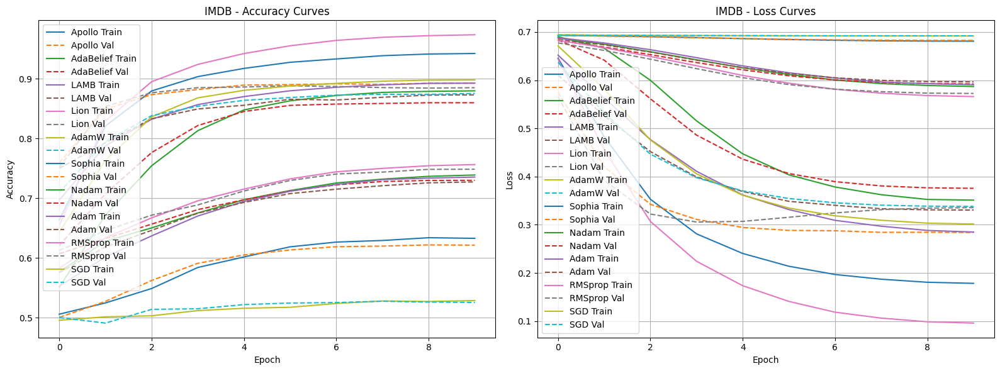

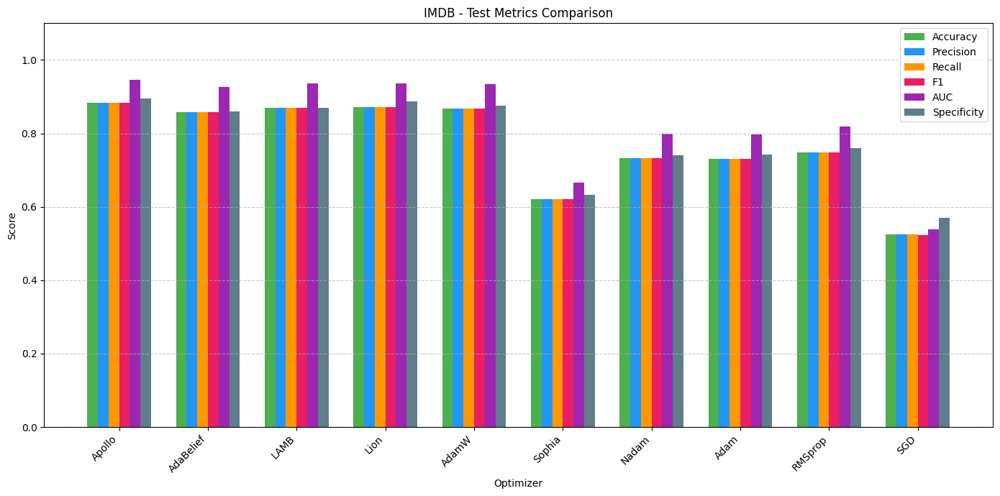

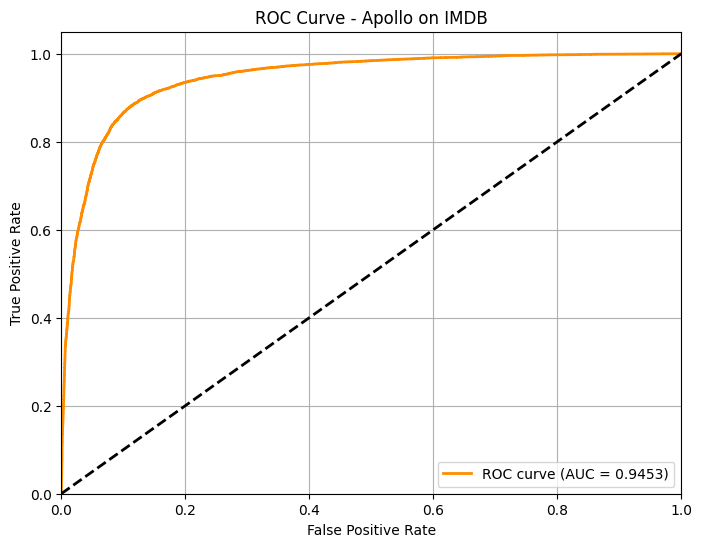

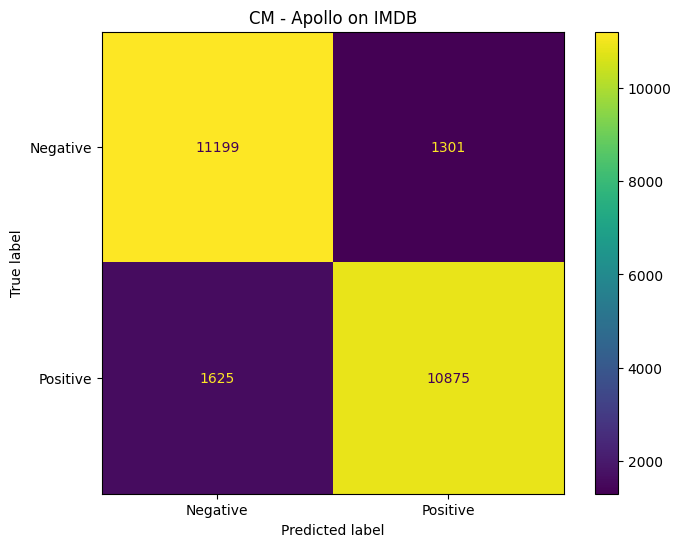

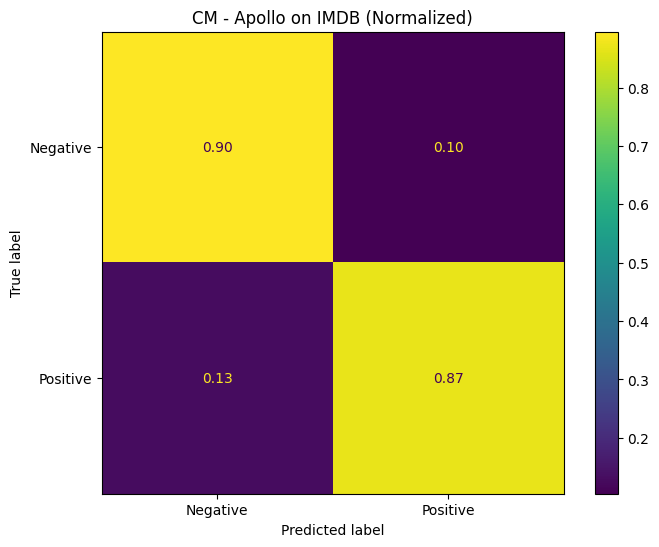

...

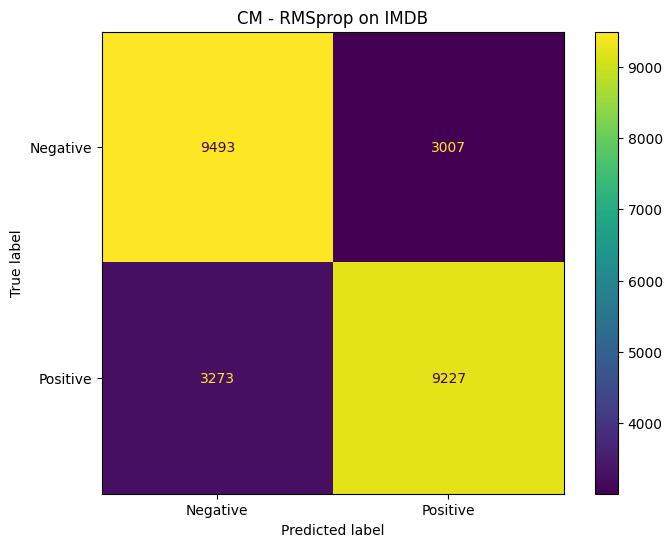

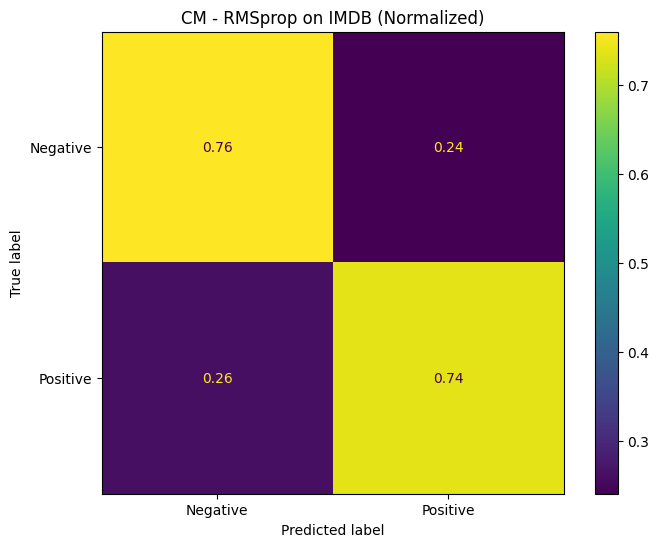

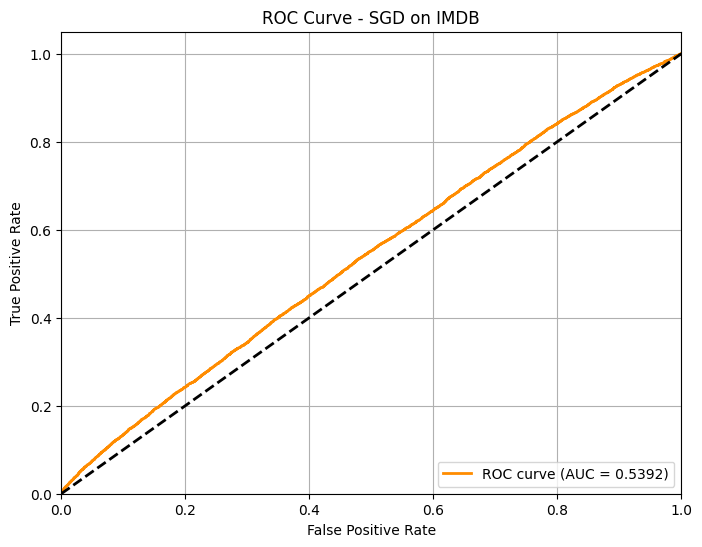

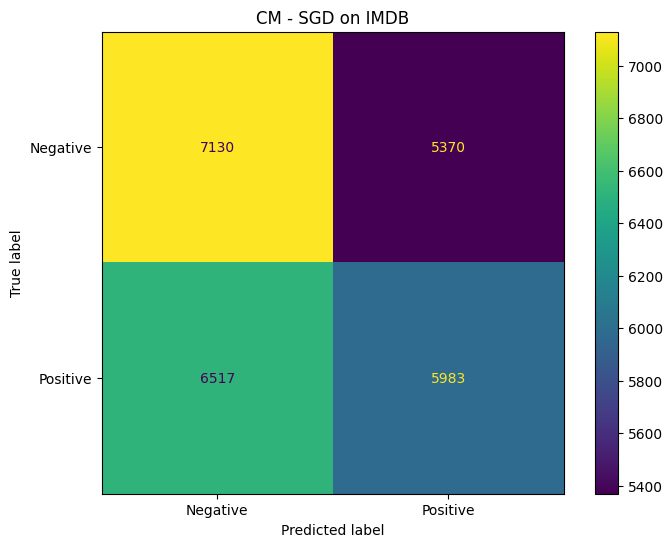

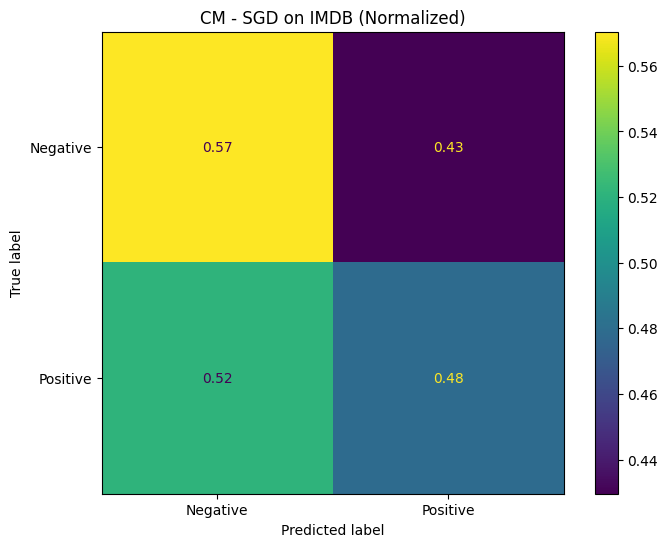


=== LaTeX Table for IMDB ===

\begin{table}[H]
\centering
\begin{tabular}{lcccccccc}\toprule
Optimizer & Test Loss & Test Acc & Precision & Recall & F1 & AUC & Specificity & Avg Epoch Time (s) \\ \midrule
Apollo & 0.3084 & 0.8830 & 0.8832 & 0.8830 & 0.8829 & 0.9453 & 0.8959 & 1.36 \\
AdaBelief & 0.3808 & 0.8576 & 0.8576 & 0.8576 & 0.8576 & 0.9256 & 0.8606 & 1.19 \\
LAMB & 0.3328 & 0.8695 & 0.8695 & 0.8695 & 0.8695 & 0.9355 & 0.8700 & 1.46 \\
Lion & 0.3818 & 0.8712 & 0.8716 & 0.8712 & 0.8712 & 0.9353 & 0.8868 & 1.10 \\
AdamW & 0.3479 & 0.8681 & 0.8682 & 0.8681 & 0.8681 & 0.9350 & 0.8757 & 1.13 \\
Sophia & 0.6822 & 0.6210 & 0.6211 & 0.6210 & 0.6210 & 0.6655 & 0.6318 & 1.14 \\
Nadam & 0.5920 & 0.7320 & 0.7320 & 0.7320 & 0.7319 & 0.7999 & 0.7402 & 1.16 \\
Adam & 0.5955 & 0.7301 & 0.7303 & 0.7301 & 0.7301 & 0.7965 & 0.7422 & 1.13 \\
RMSprop & 0.5719 & 0.7488 & 0.7489 & 0.7488 & 0.7488 & 0.8189 & 0.7594 & 1.09 \\
SGD & 0.6919 & 0.5245 & 0.5247 & 0.5245 & 0.5235 & 0.5392 & 0.5704 & 1.06 \\
\

In [ ]:
import os
import random
import time
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import Optimizer
from torch.utils.data import DataLoader, random_split, Dataset
from torch.nn.utils.rnn import pad_sequence
from sklearn.metrics import (
    precision_score, recall_score, f1_score, confusion_matrix,
    ConfusionMatrixDisplay, roc_curve, auc, roc_auc_score
)
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
from typing import Iterable, Tuple, Optional
from itertools import cycle
from datasets import load_dataset
from collections import Counter
from nltk.tokenize import word_tokenize
import nltk
nltk.download('punkt_tab')

# ---------------------------
# Setup & Reproducibility
# ---------------------------
def set_seed(seed: int = 42):
    """Sets the random seed for reproducibility across libraries."""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False

print("Setting random seed for reproducibility...", flush=True)
set_seed()
nltk.download('punkt', quiet=True)


# Global settings
NUM_EPOCHS = 10 # Fewer epochs for this larger dataset
RESULTS_DIR = "results_imdb"
os.makedirs(RESULTS_DIR, exist_ok=True)


# ---------------------------
# Apollo Optimizer
# ---------------------------
import torch
import torch.optim as optim
import torch.nn.functional as F

class Apollo(optim.Optimizer):
    """
    Implements the Apollo (Adaptive Policy for Optimizer-space Linear Linking) algorithm.

    Apollo dynamically interpolates between AdamW and Lion-style updates
    based on the agreement between their proposed update directions. This removes
    the need for a fixed interpolation factor `gamma`.
    """
    def __init__(self, params, lr=1e-3, betas=(0.9, 0.999, 0.9), eps=1e-8,
                 weight_decay=1e-2):
        if not 0.0 <= lr: raise ValueError(f"Invalid learning rate: {lr}")
        if not 0.0 <= eps: raise ValueError(f"Invalid epsilon value: {eps}")
        if not 0.0 <= betas[0] < 1.0: raise ValueError(f"Invalid beta_1: {betas[0]}")
        if not 0.0 <= betas[1] < 1.0: raise ValueError(f"Invalid beta_2: {betas[1]}")
        if not 0.0 <= betas[2] < 1.0: raise ValueError(f"Invalid beta_3 for adaptation: {betas[2]}")
        if not 0.0 <= weight_decay: raise ValueError(f"Invalid weight_decay value: {weight_decay}")

        defaults = dict(lr=lr, betas=betas, eps=eps, weight_decay=weight_decay)
        super(Apollo, self).__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()

        for group in self.param_groups:
            beta1, beta2, beta3 = group['betas']

            for p in group['params']:
                if p.grad is None: continue
                grad = p.grad
                if grad.is_sparse: raise RuntimeError('Apollo does not support sparse gradients.')

                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['exp_avg'] = torch.zeros_like(p, memory_format=torch.preserve_format)
                    state['exp_avg_sq'] = torch.zeros_like(p, memory_format=torch.preserve_format)
                    # New state for tracking update agreement (smoothed cosine similarity)
                    state['update_agreement'] = torch.zeros((), device=p.device)


                exp_avg, exp_avg_sq = state['exp_avg'], state['exp_avg_sq']
                state['step'] += 1

                # Decoupled weight decay (AdamW style)
                if group['weight_decay'] != 0:
                    p.add_(p, alpha=-group['weight_decay'] * group['lr'])

                # Update biased first and second moment estimates
                exp_avg.mul_(beta1).add_(grad, alpha=1 - beta1)
                exp_avg_sq.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)

                # Bias correction
                bias_correction1 = 1 - beta1 ** state['step']
                bias_correction2 = 1 - beta2 ** state['step']

                m_hat = exp_avg / bias_correction1
                v_hat = exp_avg_sq / bias_correction2

                # --- High-Novelty Adaptive Mechanism ---
                # 1. Calculate the two candidate updates
                denom = v_hat.sqrt().add_(group['eps'])
                update_adam = m_hat / denom
                update_lion = torch.sign(m_hat)

                # 2. Measure agreement using cosine similarity
                # Use a small epsilon in norm to prevent division by zero for zero-updates
                cos_sim = F.cosine_similarity(update_adam.flatten(), update_lion.flatten(), dim=0, eps=1e-10)

                # 3. Smooth the agreement factor using an EMA
                state['update_agreement'].mul_(beta3).add_(cos_sim, alpha=1 - beta3)

                # 4. Dynamically set gamma based on smoothed agreement
                # This maps the cosine similarity from [-1, 1] to a gamma in [0, 1]
                gamma = (state['update_agreement'] + 1) / 2.0
                # ----------------------------------------

                # Interpolate between the two updates using the DYNAMIC gamma
                final_update = (1 - gamma) * update_adam + gamma * update_lion

                # Apply the final update
                p.add_(final_update, alpha=-group['lr'])

        return loss

class AdaBelief(Optimizer):
    """Implements AdaBelief algorithm."""
    def __init__(self, params, lr=1e-3, betas=(0.9, 0.999), eps=1e-8, weight_decay=1e-3, rectify=True):
        defaults = dict(lr=lr, betas=betas, eps=eps, weight_decay=weight_decay, rectify=rectify)
        super(AdaBelief, self).__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()

        for group in self.param_groups:
            lr, beta1, beta2, eps, wd, rectify = group['lr'], group['betas'][0], group['betas'][1], group['eps'], group['weight_decay'], group['rectify']
            for p in group['params']:
                if p.grad is None: continue
                grad = p.grad
                if grad.is_sparse: raise RuntimeError('AdaBelief does not support sparse gradients')
                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m'] = torch.zeros_like(p)
                    state['s'] = torch.zeros_like(p)
                m, s = state['m'], state['s']
                state['step'] += 1
                step = state['step']
                if wd != 0: p.mul_(1.0 - lr * wd)
                m.mul_(beta1).add_(grad, alpha=1 - beta1)
                grad_residual = grad - m
                s.mul_(beta2).addcmul_(grad_residual, grad_residual, value=1 - beta2)
                bias_corr1, bias_corr2 = 1 - beta1 ** step, 1 - beta2 ** step
                m_hat, s_hat = m / bias_corr1, s / bias_corr2
                if rectify:
                    rho_inf = 2 / (1 - beta2) - 1
                    rho_t = rho_inf - 2 * step * (beta2 ** step) / (1 - beta2 ** step)
                    if rho_t > 5.0:
                        rect = ((rho_t - 4) * (rho_t - 2) * rho_inf / ((rho_inf - 4) * (rho_inf - 2) * rho_t)) ** 0.5
                        denom = (s_hat.sqrt() + eps)
                        p.addcdiv_(m_hat, denom, value=-lr * rect)
                    else:
                        p.add_(m_hat, alpha=-lr)
                else:
                    denom = (s_hat.sqrt() + eps)
                    p.addcdiv_(m_hat, denom, value=-lr)
        return loss

class Sophia(Optimizer):
    """Implements Sophia algorithm."""
    def __init__(self, params, lr=1e-3, beta1=0.965, beta2=0.99, rho=0.04, weight_decay=1e-3, eps=1e-8):
        defaults = dict(lr=lr, beta1=beta1, beta2=beta2, rho=rho, weight_decay=weight_decay, eps=eps)
        super(Sophia, self).__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = closure() if closure is not None else None
        for group in self.param_groups:
            for p in group['params']:
                if p.grad is None: continue
                grad = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m'] = torch.zeros_like(p)
                    state['hess_ema'] = torch.ones_like(p)
                m, hess_ema = state['m'], state['hess_ema']
                beta1, beta2, rho, lr, wd, eps = group['beta1'], group['beta2'], group['rho'], group['lr'], group['weight_decay'], group['eps']
                m.mul_(beta1).add_(grad, alpha=1 - beta1)
                hess_ema.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)
                denom = hess_ema.add(eps)
                scaled_grad = torch.clamp(m / denom, -rho, rho)
                if wd != 0: p.data.mul_(1 - lr * wd)
                p.add_(scaled_grad, alpha=-lr)
                state['step'] += 1
        return loss

class Lion(Optimizer):
    """Implements Lion algorithm."""
    def __init__(self, params, lr=1e-4, betas=(0.9, 0.99), weight_decay=0.0):
        if lr <= 0.0: raise ValueError(f"Invalid learning rate: {lr}")
        if not 0.0 <= betas[0] < 1.0: raise ValueError(f"Invalid beta1: {betas[0]}")
        if not 0.0 <= betas[1] < 1.0: raise ValueError(f"Invalid beta2: {betas[1]}")
        if weight_decay < 0.0: raise ValueError(f"Invalid weight_decay: {weight_decay}")
        defaults = dict(lr=lr, betas=betas, weight_decay=weight_decay)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure: Optional[callable] = None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()
        for group in self.param_groups:
            for p in group["params"]:
                if p.grad is None: continue
                grad = p.grad
                if group["weight_decay"] != 0:
                    p.mul_(1 - group["lr"] * group["weight_decay"])
                state = self.state[p]
                if len(state) == 0:
                    state["exp_avg"] = torch.zeros_like(p)
                exp_avg = state["exp_avg"]
                update = exp_avg.mul(group["betas"][0]).add(grad, alpha=1 - group["betas"][0])
                p.add_(update.sign(), alpha=-group["lr"])
                exp_avg.mul_(group["betas"][1]).add_(grad, alpha=1 - group["betas"][1])
        return loss

class LAMB(Optimizer):
    """Implements LAMB optimizer."""
    def __init__(
        self, params: Iterable[torch.nn.Parameter], lr: float = 1e-3,
        betas: Tuple[float, float] = (0.9, 0.999), eps: float = 1e-6,
        weight_decay: float = 0.0, clamp_trust_ratio: Optional[Tuple[float, float]] = (0.0, 10.0)
    ):
        defaults = dict(lr=lr, betas=betas, eps=eps, weight_decay=weight_decay, clamp_trust_ratio=clamp_trust_ratio)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure: Optional[callable] = None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()
        for group in self.param_groups:
            for p in group["params"]:
                if p.grad is None: continue
                grad = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state["step"] = 0
                    state["exp_avg"] = torch.zeros_like(p)
                    state["exp_avg_sq"] = torch.zeros_like(p)
                exp_avg, exp_avg_sq = state["exp_avg"], state["exp_avg_sq"]
                state["step"] += 1
                beta1, beta2 = group["betas"]
                exp_avg.mul_(beta1).add_(grad, alpha=1 - beta1)
                exp_avg_sq.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)
                bias_c1 = 1 - beta1 ** state["step"]
                bias_c2 = 1 - beta2 ** state["step"]
                m_hat = exp_avg / bias_c1
                v_hat = exp_avg_sq / bias_c2
                denom = v_hat.sqrt().add_(group["eps"])
                update = m_hat / denom
                if group["weight_decay"] != 0:
                    update.add_(p, alpha=group["weight_decay"])
                w_norm = p.norm(p=2)
                u_norm = update.norm(p=2)
                trust_ratio = (w_norm / u_norm).item() if w_norm > 0 and u_norm > 0 else 1.0
                if group["clamp_trust_ratio"] is not None:
                    lo, hi = group["clamp_trust_ratio"]
                    trust_ratio = max(lo, min(trust_ratio, hi))
                p.add_(update, alpha=-group["lr"] * trust_ratio)
        return loss

# ---------------------------
# Model and Data for IMDB
# ---------------------------
class TextClassificationModel(nn.Module):
    """A simple text classification model with an embedding layer."""
    def __init__(self, vocab_size, embed_dim=128, num_class=2):
        super(TextClassificationModel, self).__init__()
        self.embedding = nn.Embedding(vocab_size, embed_dim, padding_idx=1)
        self.fc = nn.Linear(embed_dim, num_class)

    def forward(self, text):
        embedded = self.embedding(text)
        # Use mean pooling over the sequence dimension
        pooled = embedded.mean(1)
        return self.fc(pooled)

class IMDBDataset(Dataset):
    def __init__(self, texts, labels):
        self.texts = texts
        self.labels = labels

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        return self.texts[idx], self.labels[idx]

def get_imdb_loaders(batch_size=64):
    """Loads and preprocesses the IMDB data, returning DataLoaders."""
    print("Loading IMDB dataset...")
    dataset = load_dataset("imdb")

    print("Building vocabulary...")
    # Build vocab from the full training set
    counter = Counter()
    for item in dataset['train']:
        counter.update(word_tokenize(item['text'].lower()))

    vocab = {'<unk>': 0, '<pad>': 1}
    for i, (word, _) in enumerate(counter.most_common(10000 - 2), 2):
        vocab[word] = i

    def text_pipeline(text):
        return [vocab.get(token, vocab['<unk>']) for token in word_tokenize(text.lower())]

    def process_data(split):
        texts = [torch.tensor(text_pipeline(item['text']), dtype=torch.long) for item in split]
        labels = [item['label'] for item in split]
        return texts, labels

    train_texts, train_labels = process_data(dataset['train'])
    test_texts, test_labels = process_data(dataset['test'])

    # Create a validation set from the training set
    train_size = int(0.8 * len(train_labels))
    val_size = len(train_labels) - train_size
    train_indices, val_indices = random_split(range(len(train_labels)), [train_size, val_size])

    val_texts = [train_texts[i] for i in val_indices]
    val_labels = [train_labels[i] for i in val_indices]
    train_texts = [train_texts[i] for i in train_indices]
    train_labels = [train_labels[i] for i in train_indices]

    train_dataset = IMDBDataset(train_texts, train_labels)
    val_dataset = IMDBDataset(val_texts, val_labels)
    test_dataset = IMDBDataset(test_texts, test_labels)

    def collate_batch(batch):
        label_list, text_list = [], []
        for (_text, _label) in batch:
            label_list.append(_label)
            text_list.append(_text)
        return pad_sequence(text_list, batch_first=True, padding_value=1), torch.tensor(label_list, dtype=torch.long)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, collate_fn=collate_batch)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, collate_fn=collate_batch)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, collate_fn=collate_batch)

    return train_loader, val_loader, test_loader, len(vocab)


# ---------------------------
# Training and Evaluation
# ---------------------------
def train_model(model_fn, optimizer_factory, train_loader, val_loader, test_loader,
                num_epochs=15, dataset_name="IMDB", run_name="default"):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model_fn().to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optimizer_factory(model.parameters())
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)

    history = { 'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': [] }
    start_time = time.time()

    print(f"Training {run_name} on {dataset_name} for {num_epochs} epochs on {device}...")

    for epoch in range(num_epochs):
        epoch_start = time.time()
        model.train()
        train_loss, train_correct, train_total = 0.0, 0, 0
        for data, targets in train_loader:
            data, targets = data.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(data)
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * data.size(0)
            _, preds = outputs.max(1)
            train_total += targets.size(0)
            train_correct += preds.eq(targets).sum().item()

        history['train_loss'].append(train_loss / train_total)
        history['train_acc'].append(train_correct / train_total)

        model.eval()
        val_loss, val_correct, val_total = 0.0, 0, 0
        with torch.no_grad():
            for data, targets in val_loader:
                data, targets = data.to(device), targets.to(device)
                outputs = model(data)
                loss = criterion(outputs, targets)
                val_loss += loss.item() * data.size(0)
                _, preds = outputs.max(1)
                val_total += targets.size(0)
                val_correct += preds.eq(targets).sum().item()

        history['val_loss'].append(val_loss / val_total)
        history['val_acc'].append(val_correct / val_total)

        print(f"Epoch {epoch+1}/{num_epochs} | Train Loss: {history['train_loss'][-1]:.4f}, Acc: {history['train_acc'][-1]:.4f} | "
              f"Val Loss: {history['val_loss'][-1]:.4f}, Acc: {history['val_acc'][-1]:.4f} | Time: {time.time() - epoch_start:.2f}s")
        scheduler.step()

    # --- Test Phase ---
    model.eval()
    all_preds, all_targets, all_probs = [], [], []
    test_loss_sum = 0.0
    with torch.no_grad():
        for data, targets in test_loader:
            data, targets = data.to(device), targets.to(device)
            outputs = model(data)
            loss = criterion(outputs, targets)
            test_loss_sum += loss.item() * data.size(0)
            _, preds = outputs.max(1)
            all_preds.extend(preds.cpu().numpy())
            all_targets.extend(targets.cpu().numpy())
            all_probs.extend(torch.softmax(outputs, dim=1).cpu().numpy())

    # --- Final Metrics Calculation ---
    final_metrics = {}
    all_preds = np.array(all_preds)
    all_targets = np.array(all_targets)
    all_probs = np.array(all_probs)

    final_metrics['test_loss'] = test_loss_sum / len(all_targets)
    final_metrics['test_acc'] = (all_preds == all_targets).mean()
    final_metrics['test_precision'] = precision_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_recall'] = recall_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_f1'] = f1_score(all_targets, all_preds, average='macro', zero_division=0)

    final_metrics['test_auc'] = roc_auc_score(all_targets, all_probs[:, 1])

    cm = confusion_matrix(all_targets, all_preds)
    tn, fp, fn, tp = cm.ravel()
    final_metrics['test_specificity'] = tn / (tn + fp + 1e-8)

    final_metrics['runtime'] = time.time() - start_time
    final_metrics['avg_epoch_time'] = final_metrics['runtime'] / num_epochs
    final_metrics['targets'] = all_targets
    final_metrics['preds'] = all_preds
    final_metrics['probs'] = all_probs

    print(f"\nFinal Test Results for {run_name}: Acc: {final_metrics['test_acc']:.4f}, F1: {final_metrics['test_f1']:.4f}, AUC: {final_metrics['test_auc']:.4f}\n")

    return {**history, **final_metrics}

# ---------------------------
# Optimizer Registry
# ---------------------------
optimizers = {
    'Apollo': lambda params: Apollo(params,lr=1e-3, betas=(0.9, 0.999, 0.9), eps=1e-8,
                 weight_decay=1e-4),
    'AdaBelief': lambda params: AdaBelief(params, lr=1e-3, weight_decay=1e-4),
    'LAMB': lambda params: LAMB(params, lr=1e-3, weight_decay=1e-4),
    'Lion': lambda params: Lion(params, lr=1e-3, weight_decay=1e-4),
    'AdamW': lambda params: optim.AdamW(params, lr=1e-3, weight_decay=1e-4),
    'Sophia': lambda params: Sophia(params, lr=1e-3, weight_decay=1e-4),
    'Nadam': lambda params: optim.NAdam(params, lr=1e-3, weight_decay=1e-4),
    'Adam': lambda params: optim.Adam(params, lr=1e-3, weight_decay=1e-4),
    'RMSprop': lambda params: optim.RMSprop(params, lr=1e-3, weight_decay=1e-4),
    'SGD': lambda params: optim.SGD(params, lr=1e-3, momentum=0.9, weight_decay=1e-4),
}

# ---------------------------
# Plotting, Saving, and Table Utilities
# ---------------------------
def plot_learning_curves(results, dataset_name, save_path=None):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    for opt_name, metrics in results.items():
        ax1.plot(metrics['train_acc'], label=f'{opt_name} Train', linestyle='-')
        ax1.plot(metrics['val_acc'], label=f'{opt_name} Val', linestyle='--')
    ax1.set_title(f'{dataset_name} - Accuracy Curves'); ax1.set_xlabel('Epoch'); ax1.set_ylabel('Accuracy'); ax1.legend(); ax1.grid(True)
    for opt_name, metrics in results.items():
        ax2.plot(metrics['train_loss'], label=f'{opt_name} Train', linestyle='-')
        ax2.plot(metrics['val_loss'], label=f'{opt_name} Val', linestyle='--')
    ax2.set_title(f'{dataset_name} - Loss Curves'); ax2.set_xlabel('Epoch'); ax2.set_ylabel('Loss'); ax2.legend(); ax2.grid(True)
    plt.tight_layout()
    if save_path: plt.savefig(save_path)
    plt.show()


def plot_test_metrics(results, dataset_name, save_path=None):
    metrics_list = ['test_acc', 'test_precision', 'test_recall', 'test_f1', 'test_auc', 'test_specificity']
    metric_names = ['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Specificity']

    colors = ['#4CAF50', '#2196F3', '#FF9800', '#E91E63', '#9C27B0', '#607D8B']

    plt.figure(figsize=(14, 7))
    bar_width = 0.12
    x = np.arange(len(results))

    for i, metric in enumerate(metrics_list):
        values = [results[opt][metric] for opt in results]
        plt.bar(x + i * bar_width, values, width=bar_width, label=metric_names[i], color=colors[i])

    plt.title(f'{dataset_name} - Test Metrics Comparison')
    plt.xlabel('Optimizer')
    plt.ylabel('Score')
    plt.xticks(x + bar_width * (len(metrics_list)/2 - 0.5), list(results.keys()), rotation=45, ha="right")
    plt.ylim(0, 1.1)
    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path)
    plt.show()


def plot_roc_curves(result, opt_name, class_names, dataset_name, save_path=None):
    probs, targets = result['probs'], result['targets']
    fpr, tpr, _ = roc_curve(targets, probs[:, 1])
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0]); plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate'); plt.ylabel('True Positive Rate'); plt.title(f'ROC Curve - {opt_name} on {dataset_name}'); plt.legend(loc="lower right"); plt.grid(True)
    if save_path: plt.savefig(save_path)
    plt.show()

def plot_confusion_matrix(result, opt_name, class_names, dataset_name, normalize=False, save_path=None):
    cm = confusion_matrix(result['targets'], result['preds'])
    title = f'CM - {opt_name} on {dataset_name}'
    if normalize:
        cm = cm.astype('float') / (cm.sum(axis=1)[:, np.newaxis] + 1e-8)
        title += ' (Normalized)'
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    fig, ax = plt.subplots(figsize=(8, 6))
    disp.plot(ax=ax, cmap='viridis', values_format='.2f' if normalize else 'd')
    plt.title(title)
    if save_path: plt.savefig(save_path)
    plt.show()

def generate_latex_table(results, dataset_name):
    """Generates a LaTeX table with all relevant metrics."""
    header = (
        "\\begin{table}[H]\n\\centering\n"
        "\\begin{tabular}{lcccccccc}\\toprule\n"
        "Optimizer & Test Loss & Test Acc & Precision & Recall & F1 & AUC & Specificity & Avg Epoch Time (s) \\\\ \\midrule\n"
    )

    footer = (
        "\\bottomrule\n\\end{tabular}\n"
        f"\\caption{{Performance Metrics for {dataset_name}}}\n"
        f"\\label{{tab:{dataset_name.lower().replace('-', '_').replace(' ', '_')}_perf}}\n"
        "\\end{table}"
    )

    rows = []
    for opt, m in results.items():
        rows.append(
            f"{opt} & {m['test_loss']:.4f} & {m['test_acc']:.4f} & "
            f"{m['test_precision']:.4f} & {m['test_recall']:.4f} & {m['test_f1']:.4f} & "
            f"{m['test_auc']:.4f} & {m['test_specificity']:.4f} & {m['avg_epoch_time']:.2f} \\\\"
        )

    return header + "\n".join(rows) + "\n" + footer

# ---------------------------
# Main Execution
# ---------------------------
if __name__ == "__main__":
    imdb_class_names = ['Negative', 'Positive']
    train_loader, val_loader, test_loader, vocab_size = get_imdb_loaders()

    results_imdb = {}
    for opt_name, opt_factory in optimizers.items():
        model_creator = lambda: TextClassificationModel(vocab_size)
        results_imdb[opt_name] = train_model(
            model_creator, opt_factory, train_loader, val_loader, test_loader,
            num_epochs=NUM_EPOCHS, dataset_name="IMDB", run_name=opt_name
        )

    # --- Generate and Save Artifacts ---
    print("\n--- Generating and Saving All Artifacts for IMDB ---")
    plot_learning_curves(results_imdb, "IMDB", save_path=os.path.join(RESULTS_DIR, "imdb_learning_curves.png"))
    plot_test_metrics(results_imdb, "IMDB", save_path=os.path.join(RESULTS_DIR, "imdb_test_metrics.png"))

    for opt_name, result in results_imdb.items():
        plot_roc_curves(result, opt_name, imdb_class_names, "IMDB", save_path=os.path.join(RESULTS_DIR, f"roc_{opt_name}.png"))
        plot_confusion_matrix(result, opt_name, imdb_class_names, "IMDB", normalize=False, save_path=os.path.join(RESULTS_DIR, f"cm_raw_{opt_name}.png"))
        plot_confusion_matrix(result, opt_name, imdb_class_names, "IMDB", normalize=True, save_path=os.path.join(RESULTS_DIR, f"cm_norm_{opt_name}.png"))

    # --- Generate, Print, and Save LaTeX and TXT Table ---
    latex_table_str = generate_latex_table(results_imdb, "IMDB")
    print("\n=== LaTeX Table for IMDB ===\n")
    print(latex_table_str)

    # Save as .tex file
    tex_path = os.path.join(RESULTS_DIR, "imdb_results_table.tex")
    with open(tex_path, "w") as f:
        f.write(latex_table_str)
    print(f"LaTeX table saved to: {tex_path}")

    # Save as .txt file (without LaTeX commands for readability)
    txt_path = os.path.join(RESULTS_DIR, "imdb_results_summary.txt")
    with open(txt_path, "w") as f:
        f.write("Optimizer, Test Loss, Test Acc, Precision, Recall, F1, AUC, Specificity, Avg Epoch Time (s)\n")
        for opt, m in results_imdb.items():
             f.write(
                f"{opt}, {m['test_loss']:.4f}, {m['test_acc']:.4f}, "
                f"{m['test_precision']:.4f}, {m['test_recall']:.4f}, {m['test_f1']:.4f}, "
                f"{m['test_auc']:.4f}, {m['test_specificity']:.4f}, {m['avg_epoch_time']:.2f}\n"
            )
    print(f"Summary text file saved to: {txt_path}")


    print("\n--- Script Finished ---")


In [ ]:
from google.colab import files
import os
import zipfile

# Define the directory to zip
results_dir = "/content/results_imdb"
# Define the name for the zip file
zip_filename = "/content/results_imdb.zip"

# Create a ZipFile object
if os.path.exists(results_dir):
    with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
        # Walk through the directory and add files to the zip
        for root, _, files_in_dir in os.walk(results_dir):
            for file in files_in_dir:
                file_path = os.path.join(root, file)
                # Add file to zip, preserving directory structure
                zipf.write(file_path, os.path.relpath(file_path, results_dir))
    print(f"Successfully created {zip_filename}")

    # Download the zip file
    files.download(zip_filename)
else:
    print(f"Error: Directory '{results_dir}' not found.")

Successfully created /content/results_imdb.zip


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# 6-AG NEWS

Setting random seed for reproducibility...
Loading AG News dataset...
Building vocabulary...
Training Apollo on AG News for 5 epochs on cuda...
Epoch 1/5 | Train Loss: 0.6414, Acc: 0.8177 | Val Loss: 0.2974, Acc: 0.9068 | Time: 3.71s
Epoch 2/5 | Train Loss: 0.2462, Acc: 0.9235 | Val Loss: 0.2655, Acc: 0.9157 | Time: 4.86s
Epoch 3/5 | Train Loss: 0.2095, Acc: 0.9348 | Val Loss: 0.2656, Acc: 0.9165 | Time: 3.83s
Epoch 4/5 | Train Loss: 0.1923, Acc: 0.9401 | Val Loss: 0.2673, Acc: 0.9157 | Time: 3.65s
Epoch 5/5 | Train Loss: 0.1844, Acc: 0.9426 | Val Loss: 0.2683, Acc: 0.9161 | Time: 3.74s

Final Test Results for Apollo: Acc: 0.9184, F1: 0.9183, AUC: 0.9851

Training AdaBelief on AG News for 5 epochs on cuda...
Epoch 1/5 | Train Loss: 1.1166, Acc: 0.6229 | Val Loss: 0.6301, Acc: 0.8334 | Time: 3.21s
Epoch 2/5 | Train Loss: 0.4581, Acc: 0.8714 | Val Loss: 0.3700, Acc: 0.8853 | Time: 2.91s
Epoch 3/5 | Train Loss: 0.3286, Acc: 0.9017 | Val Loss: 0.3213, Acc: 0.8987 | Time: 2.90s
Epoch 4/5 | 

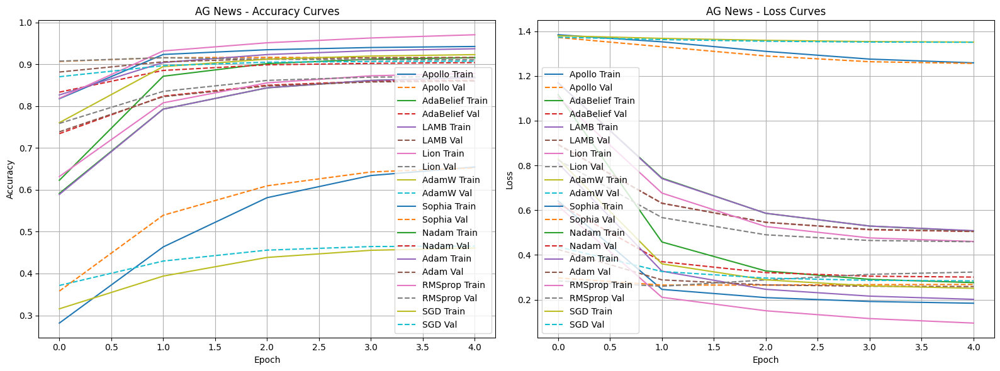

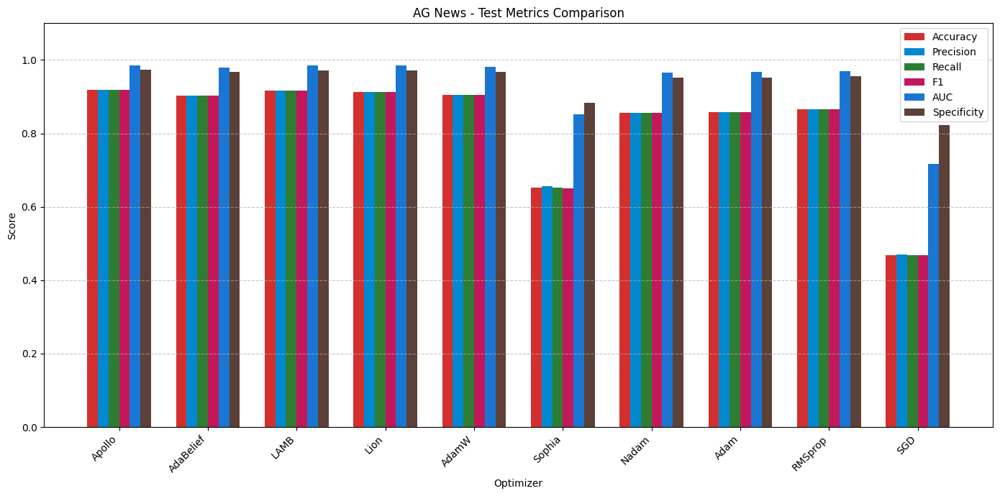

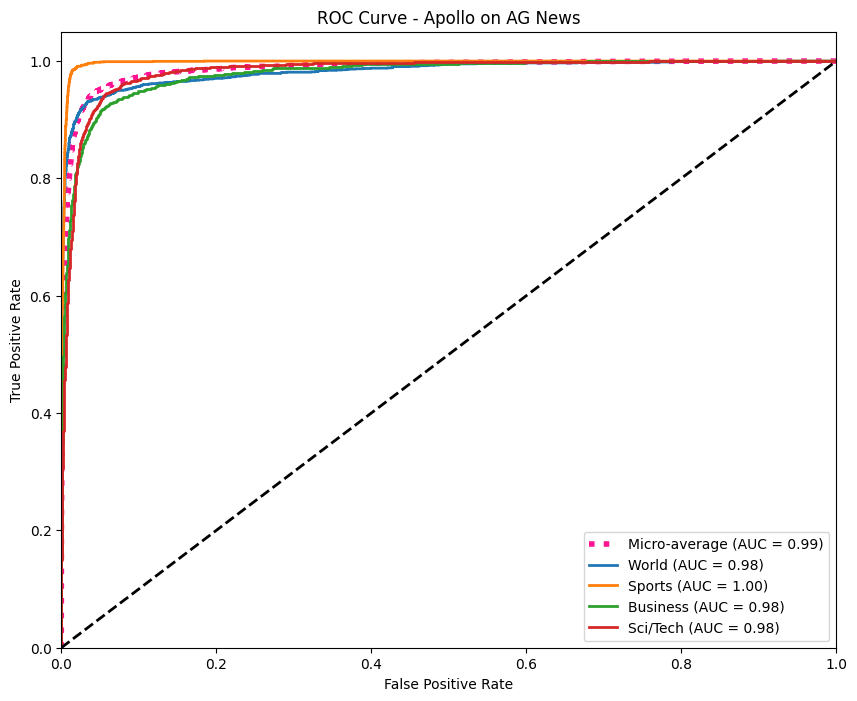

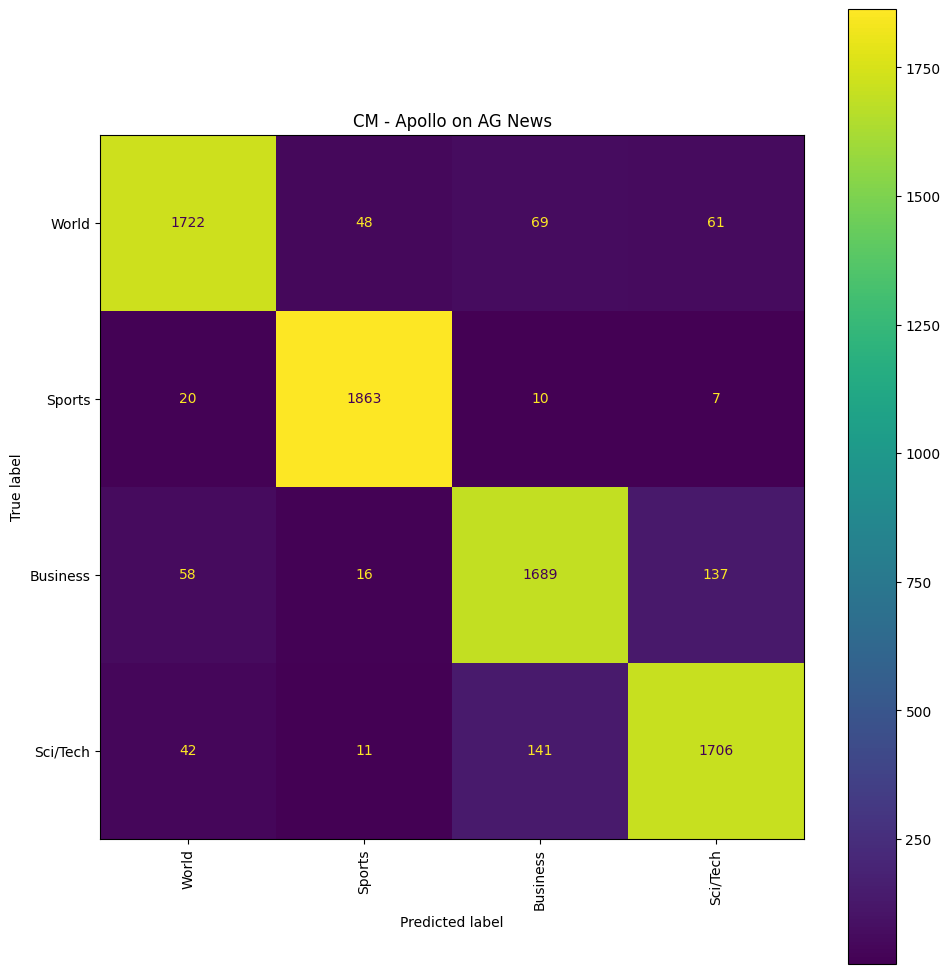

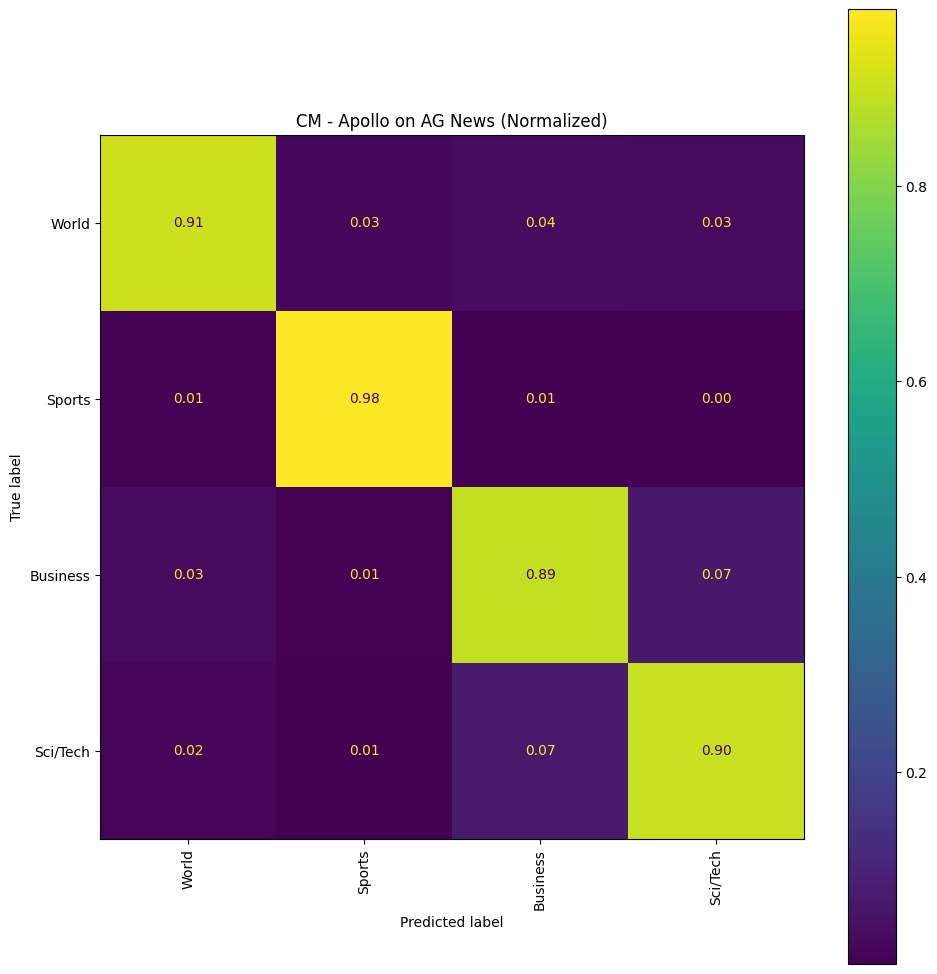

...

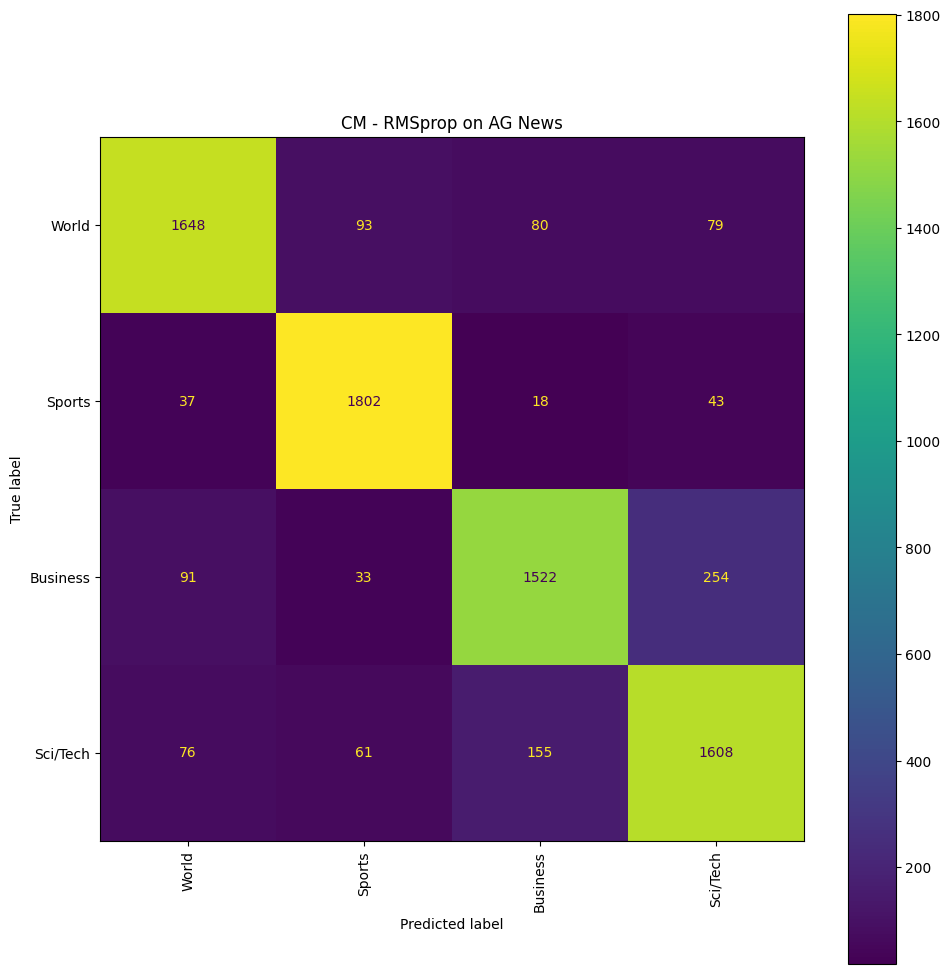

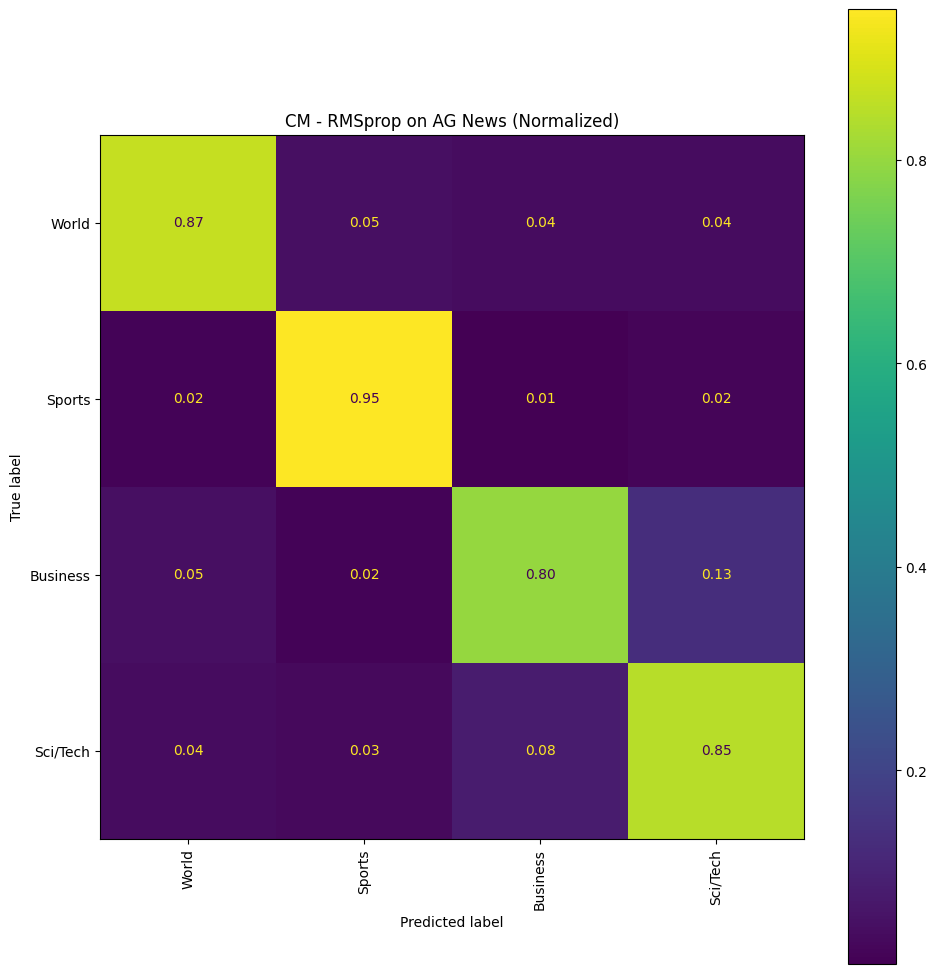

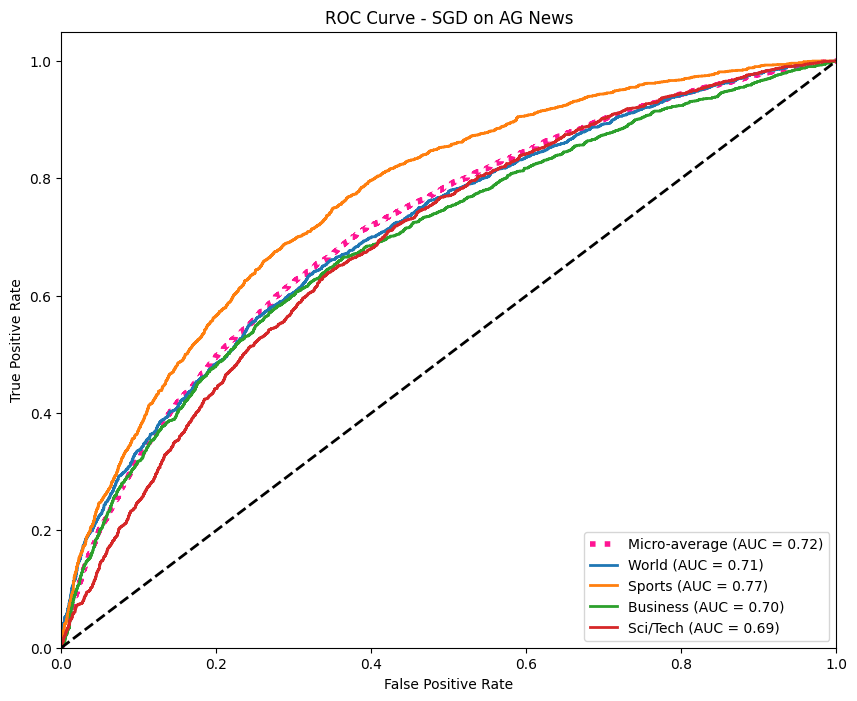

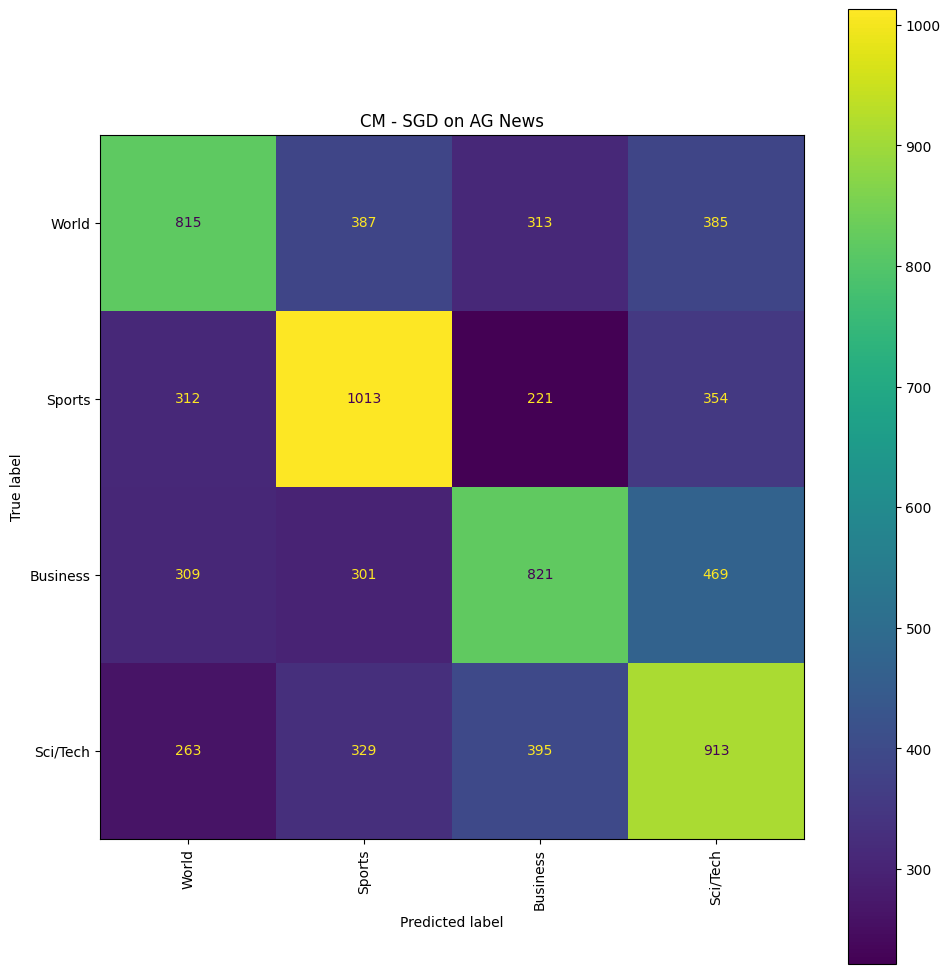

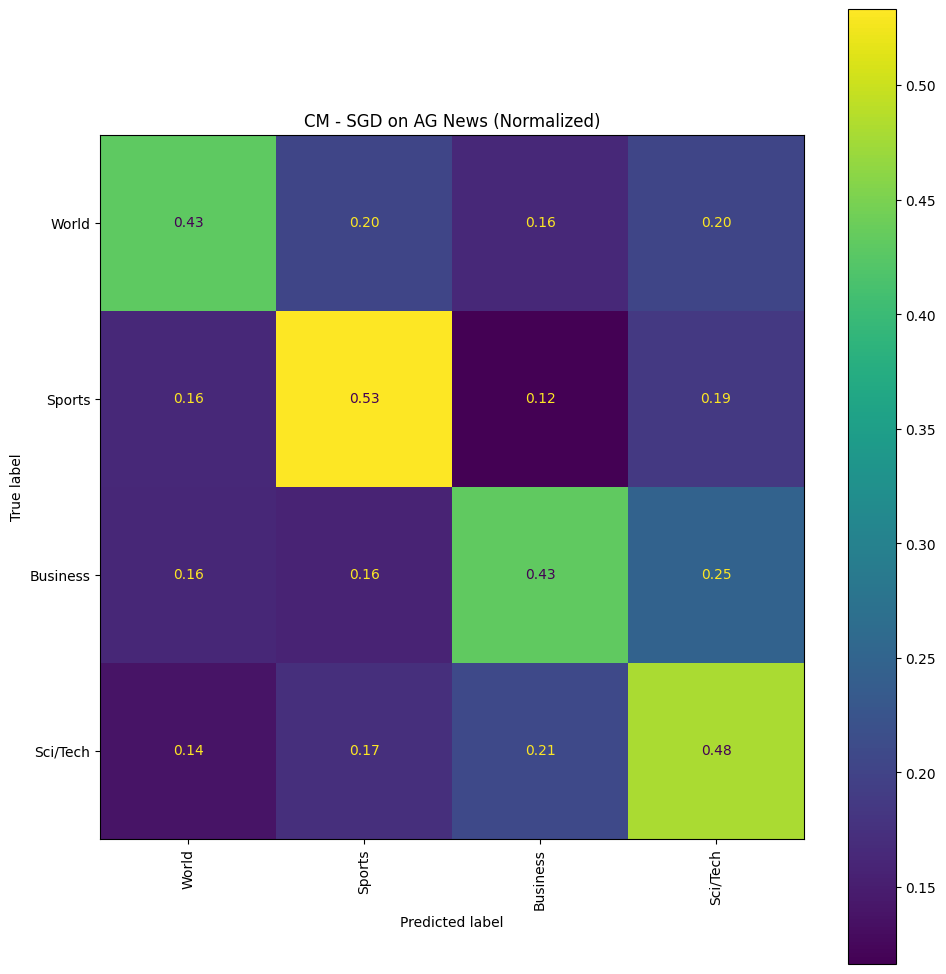


=== LaTeX Table for AG News ===

\begin{table}[H]
\centering
\begin{tabular}{lcccccccc}\toprule
Optimizer & Test Loss & Test Acc & Precision & Recall & F1 & AUC & Specificity & Avg Epoch Time (s) \\ \midrule
Apollo & 0.2672 & 0.9184 & 0.9184 & 0.9184 & 0.9183 & 0.9851 & 0.9728 & 3.99 \\
AdaBelief & 0.3092 & 0.9025 & 0.9023 & 0.9025 & 0.9023 & 0.9799 & 0.9675 & 3.07 \\
LAMB & 0.2692 & 0.9158 & 0.9156 & 0.9158 & 0.9157 & 0.9844 & 0.9719 & 3.52 \\
Lion & 0.3195 & 0.9132 & 0.9131 & 0.9132 & 0.9131 & 0.9843 & 0.9711 & 2.63 \\
AdamW & 0.2935 & 0.9047 & 0.9047 & 0.9047 & 0.9046 & 0.9816 & 0.9682 & 2.83 \\
Sophia & 1.2491 & 0.6521 & 0.6560 & 0.6521 & 0.6495 & 0.8520 & 0.8840 & 2.89 \\
Nadam & 0.5049 & 0.8554 & 0.8555 & 0.8554 & 0.8550 & 0.9664 & 0.9518 & 3.04 \\
Adam & 0.5046 & 0.8576 & 0.8578 & 0.8576 & 0.8572 & 0.9665 & 0.9525 & 3.02 \\
RMSprop & 0.4603 & 0.8658 & 0.8659 & 0.8658 & 0.8654 & 0.9697 & 0.9553 & 2.71 \\
SGD & 1.3489 & 0.4687 & 0.4696 & 0.4687 & 0.4681 & 0.7164 & 0.8229 & 2.46 \

In [ ]:
import os
import random
import time
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import Optimizer
import torch.nn.functional as F
from torch.utils.data import DataLoader, random_split, Dataset
from torch.nn.utils.rnn import pad_sequence
from sklearn.metrics import (
    precision_score, recall_score, f1_score, confusion_matrix,
    ConfusionMatrixDisplay, roc_curve, auc, roc_auc_score
)
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
from typing import Iterable, Tuple, Optional
from itertools import cycle
from datasets import load_dataset
from collections import Counter
from nltk.tokenize import word_tokenize
import nltk

# ---------------------------
# Setup & Reproducibility
# ---------------------------
def set_seed(seed: int = 42):
    """Sets the random seed for reproducibility across libraries."""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False

print("Setting random seed for reproducibility...", flush=True)
set_seed()
nltk.download('punkt', quiet=True)


# Global settings
NUM_EPOCHS = 5
RESULTS_DIR = "results_ag_news"
os.makedirs(RESULTS_DIR, exist_ok=True)


# ---------------------------
# Optimizer Implementations
# ---------------------------


class Apollo(optim.Optimizer):
    """
    Implements the Apollo (Adaptive Policy for Optimizer-space Linear Linking) algorithm.

    Apollo dynamically interpolates between AdamW and Lion-style updates
    based on the agreement between their proposed update directions. This removes
    the need for a fixed interpolation factor `gamma`.
    """
    def __init__(self, params, lr=1e-3, betas=(0.9, 0.999, 0.9), eps=1e-8,
                 weight_decay=1e-2):
        if not 0.0 <= lr: raise ValueError(f"Invalid learning rate: {lr}")
        if not 0.0 <= eps: raise ValueError(f"Invalid epsilon value: {eps}")
        if not 0.0 <= betas[0] < 1.0: raise ValueError(f"Invalid beta_1: {betas[0]}")
        if not 0.0 <= betas[1] < 1.0: raise ValueError(f"Invalid beta_2: {betas[1]}")
        if not 0.0 <= betas[2] < 1.0: raise ValueError(f"Invalid beta_3 for adaptation: {betas[2]}")
        if not 0.0 <= weight_decay: raise ValueError(f"Invalid weight_decay value: {weight_decay}")

        defaults = dict(lr=lr, betas=betas, eps=eps, weight_decay=weight_decay)
        super(Apollo, self).__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()

        for group in self.param_groups:
            beta1, beta2, beta3 = group['betas']

            for p in group['params']:
                if p.grad is None: continue
                grad = p.grad
                if grad.is_sparse: raise RuntimeError('Apollo does not support sparse gradients.')

                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['exp_avg'] = torch.zeros_like(p, memory_format=torch.preserve_format)
                    state['exp_avg_sq'] = torch.zeros_like(p, memory_format=torch.preserve_format)
                    # New state for tracking update agreement (smoothed cosine similarity)
                    state['update_agreement'] = torch.zeros((), device=p.device)

                exp_avg, exp_avg_sq = state['exp_avg'], state['exp_avg_sq']
                state['step'] += 1

                # Decoupled weight decay (AdamW style)
                if group['weight_decay'] != 0:
                    p.add_(p, alpha=-group['weight_decay'] * group['lr'])

                # Update biased first and second moment estimates
                exp_avg.mul_(beta1).add_(grad, alpha=1 - beta1)
                exp_avg_sq.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)

                # Bias correction
                bias_correction1 = 1 - beta1 ** state['step']
                bias_correction2 = 1 - beta2 ** state['step']

                m_hat = exp_avg / bias_correction1
                v_hat = exp_avg_sq / bias_correction2

                # --- High-Novelty Adaptive Mechanism ---
                # 1. Calculate the two candidate updates
                denom = v_hat.sqrt().add_(group['eps'])
                update_adam = m_hat / denom
                update_lion = torch.sign(m_hat)

                # 2. Measure agreement using cosine similarity
                # Use a small epsilon in norm to prevent division by zero for zero-updates
                cos_sim = F.cosine_similarity(update_adam.flatten(), update_lion.flatten(), dim=0, eps=1e-10)

                # 3. Smooth the agreement factor using an EMA
                state['update_agreement'].mul_(beta3).add_(cos_sim, alpha=1 - beta3)

                # 4. Dynamically set gamma based on smoothed agreement
                # This maps the cosine similarity from [-1, 1] to a gamma in [0, 1]
                gamma = (state['update_agreement'] + 1) / 2.0
                # ----------------------------------------

                # Interpolate between the two updates using the DYNAMIC gamma
                final_update = (1 - gamma) * update_adam + gamma * update_lion

                # Apply the final update
                p.add_(final_update, alpha=-group['lr'])

        return loss

class AdaBelief(Optimizer):
    """Implements AdaBelief algorithm."""
    def __init__(self, params, lr=1e-3, betas=(0.9, 0.999), eps=1e-8, weight_decay=1e-3, rectify=True):
        defaults = dict(lr=lr, betas=betas, eps=eps, weight_decay=weight_decay, rectify=rectify)
        super(AdaBelief, self).__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()

        for group in self.param_groups:
            lr, beta1, beta2, eps, wd, rectify = group['lr'], group['betas'][0], group['betas'][1], group['eps'], group['weight_decay'], group['rectify']
            for p in group['params']:
                if p.grad is None: continue
                grad = p.grad
                if grad.is_sparse: raise RuntimeError('AdaBelief does not support sparse gradients')
                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m'] = torch.zeros_like(p)
                    state['s'] = torch.zeros_like(p)
                m, s = state['m'], state['s']
                state['step'] += 1
                step = state['step']
                if wd != 0: p.mul_(1.0 - lr * wd)
                m.mul_(beta1).add_(grad, alpha=1 - beta1)
                grad_residual = grad - m
                s.mul_(beta2).addcmul_(grad_residual, grad_residual, value=1 - beta2)
                bias_corr1, bias_corr2 = 1 - beta1 ** step, 1 - beta2 ** step
                m_hat, s_hat = m / bias_corr1, s / bias_corr2
                if rectify:
                    rho_inf = 2 / (1 - beta2) - 1
                    rho_t = rho_inf - 2 * step * (beta2 ** step) / (1 - beta2 ** step)
                    if rho_t > 5.0:
                        rect = ((rho_t - 4) * (rho_t - 2) * rho_inf / ((rho_inf - 4) * (rho_inf - 2) * rho_t)) ** 0.5
                        denom = (s_hat.sqrt() + eps)
                        p.addcdiv_(m_hat, denom, value=-lr * rect)
                    else:
                        p.add_(m_hat, alpha=-lr)
                else:
                    denom = (s_hat.sqrt() + eps)
                    p.addcdiv_(m_hat, denom, value=-lr)
        return loss

class Sophia(Optimizer):
    """Implements Sophia algorithm."""
    def __init__(self, params, lr=1e-3, beta1=0.965, beta2=0.99, rho=0.04, weight_decay=1e-3, eps=1e-8):
        defaults = dict(lr=lr, beta1=beta1, beta2=beta2, rho=rho, weight_decay=weight_decay, eps=eps)
        super(Sophia, self).__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = closure() if closure is not None else None
        for group in self.param_groups:
            for p in group['params']:
                if p.grad is None: continue
                grad = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m'] = torch.zeros_like(p)
                    state['hess_ema'] = torch.ones_like(p)
                m, hess_ema = state['m'], state['hess_ema']
                beta1, beta2, rho, lr, wd, eps = group['beta1'], group['beta2'], group['rho'], group['lr'], group['weight_decay'], group['eps']
                m.mul_(beta1).add_(grad, alpha=1 - beta1)
                hess_ema.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)
                denom = hess_ema.add(eps)
                scaled_grad = torch.clamp(m / denom, -rho, rho)
                if wd != 0: p.data.mul_(1 - lr * wd)
                p.add_(scaled_grad, alpha=-lr)
                state['step'] += 1
        return loss

class Lion(Optimizer):
    """Implements Lion algorithm."""
    def __init__(self, params, lr=1e-4, betas=(0.9, 0.99), weight_decay=0.0):
        if lr <= 0.0: raise ValueError(f"Invalid learning rate: {lr}")
        if not 0.0 <= betas[0] < 1.0: raise ValueError(f"Invalid beta1: {betas[0]}")
        if not 0.0 <= betas[1] < 1.0: raise ValueError(f"Invalid beta2: {betas[1]}")
        if weight_decay < 0.0: raise ValueError(f"Invalid weight_decay: {weight_decay}")
        defaults = dict(lr=lr, betas=betas, weight_decay=weight_decay)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure: Optional[callable] = None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()
        for group in self.param_groups:
            for p in group["params"]:
                if p.grad is None: continue
                grad = p.grad
                if group["weight_decay"] != 0:
                    p.mul_(1 - group["lr"] * group["weight_decay"])
                state = self.state[p]
                if len(state) == 0:
                    state["exp_avg"] = torch.zeros_like(p)
                exp_avg = state["exp_avg"]
                update = exp_avg.mul(group["betas"][0]).add(grad, alpha=1 - group["betas"][0])
                p.add_(update.sign(), alpha=-group["lr"])
                exp_avg.mul_(group["betas"][1]).add_(grad, alpha=1 - group["betas"][1])
        return loss

class LAMB(Optimizer):
    """Implements LAMB optimizer."""
    def __init__(
        self, params: Iterable[torch.nn.Parameter], lr: float = 1e-3,
        betas: Tuple[float, float] = (0.9, 0.999), eps: float = 1e-6,
        weight_decay: float = 0.0, clamp_trust_ratio: Optional[Tuple[float, float]] = (0.0, 10.0)
    ):
        defaults = dict(lr=lr, betas=betas, eps=eps, weight_decay=weight_decay, clamp_trust_ratio=clamp_trust_ratio)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure: Optional[callable] = None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()
        for group in self.param_groups:
            for p in group["params"]:
                if p.grad is None: continue
                grad = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state["step"] = 0
                    state["exp_avg"] = torch.zeros_like(p)
                    state["exp_avg_sq"] = torch.zeros_like(p)
                exp_avg, exp_avg_sq = state["exp_avg"], state["exp_avg_sq"]
                state["step"] += 1
                beta1, beta2 = group["betas"]
                exp_avg.mul_(beta1).add_(grad, alpha=1 - beta1)
                exp_avg_sq.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)
                bias_c1 = 1 - beta1 ** state["step"]
                bias_c2 = 1 - beta2 ** state["step"]
                m_hat = exp_avg / bias_c1
                v_hat = exp_avg_sq / bias_c2
                denom = v_hat.sqrt().add_(group["eps"])
                update = m_hat / denom
                if group["weight_decay"] != 0:
                    update.add_(p, alpha=group["weight_decay"])
                w_norm = p.norm(p=2)
                u_norm = update.norm(p=2)
                trust_ratio = (w_norm / u_norm).item() if w_norm > 0 and u_norm > 0 else 1.0
                if group["clamp_trust_ratio"] is not None:
                    lo, hi = group["clamp_trust_ratio"]
                    trust_ratio = max(lo, min(trust_ratio, hi))
                p.add_(update, alpha=-group["lr"] * trust_ratio)
        return loss

# ---------------------------
# Model and Data for AG News
# ---------------------------
class TextClassificationModel(nn.Module):
    """A simple text classification model with an embedding layer."""
    def __init__(self, vocab_size, embed_dim=128, num_class=4):
        super(TextClassificationModel, self).__init__()
        self.embedding = nn.Embedding(vocab_size, embed_dim, padding_idx=1)
        self.fc = nn.Linear(embed_dim, num_class)

    def forward(self, text):
        embedded = self.embedding(text)
        pooled = embedded.mean(1)
        return self.fc(pooled)

class AGNewsDataset(Dataset):
    def __init__(self, texts, labels):
        self.texts = texts
        self.labels = labels

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        return self.texts[idx], self.labels[idx]

def get_ag_news_loaders(batch_size=128):
    """Loads and preprocesses the AG News data."""
    print("Loading AG News dataset...")
    dataset = load_dataset("ag_news")

    print("Building vocabulary...")
    train_val_data = dataset['train']
    counter = Counter()
    for item in train_val_data:
        counter.update(word_tokenize(item['text'].lower()))

    vocab = {'<unk>': 0, '<pad>': 1}
    for i, (word, _) in enumerate(counter.most_common(20000 - 2), 2):
        vocab[word] = i

    def text_pipeline(text):
        return [vocab.get(token, vocab['<unk>']) for token in word_tokenize(text.lower())]

    def process_data(split):
        texts = [torch.tensor(text_pipeline(item['text']), dtype=torch.long) for item in split]
        labels = [item['label'] for item in split]
        return texts, labels

    train_val_texts, train_val_labels = process_data(dataset['train'])
    test_texts, test_labels = process_data(dataset['test'])

    train_size = int(0.9 * len(train_val_labels))
    val_size = len(train_val_labels) - train_size
    train_indices, val_indices = random_split(range(len(train_val_labels)), [train_size, val_size])

    train_texts = [train_val_texts[i] for i in train_indices]
    train_labels = [train_val_labels[i] for i in train_indices]
    val_texts = [train_val_texts[i] for i in val_indices]
    val_labels = [train_val_labels[i] for i in val_indices]

    train_dataset = AGNewsDataset(train_texts, train_labels)
    val_dataset = AGNewsDataset(val_texts, val_labels)
    test_dataset = AGNewsDataset(test_texts, test_labels)

    def collate_batch(batch):
        label_list, text_list = [], []
        for (_text, _label) in batch:
            label_list.append(_label)
            text_list.append(_text)
        return pad_sequence(text_list, batch_first=True, padding_value=1), torch.tensor(label_list, dtype=torch.long)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, collate_fn=collate_batch)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, collate_fn=collate_batch)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, collate_fn=collate_batch)

    return train_loader, val_loader, test_loader, len(vocab), len(dataset['train'].features['label'].names)


# ---------------------------
# Training and Evaluation
# ---------------------------
def train_model(model_fn, optimizer_factory, train_loader, val_loader, test_loader,
                num_epochs=5, dataset_name="AG News", run_name="default"):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model_fn().to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optimizer_factory(model.parameters())
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)

    history = { 'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': [] }
    start_time = time.time()

    print(f"Training {run_name} on {dataset_name} for {num_epochs} epochs on {device}...")

    for epoch in range(num_epochs):
        epoch_start = time.time()
        model.train()
        train_loss, train_correct, train_total = 0.0, 0, 0
        for data, targets in train_loader:
            data, targets = data.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(data)
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * data.size(0)
            _, preds = outputs.max(1)
            train_total += targets.size(0)
            train_correct += preds.eq(targets).sum().item()

        history['train_loss'].append(train_loss / train_total)
        history['train_acc'].append(train_correct / train_total)

        model.eval()
        val_loss, val_correct, val_total = 0.0, 0, 0
        with torch.no_grad():
            for data, targets in val_loader:
                data, targets = data.to(device), targets.to(device)
                outputs = model(data)
                loss = criterion(outputs, targets)
                val_loss += loss.item() * data.size(0)
                _, preds = outputs.max(1)
                val_total += targets.size(0)
                val_correct += preds.eq(targets).sum().item()

        history['val_loss'].append(val_loss / val_total)
        history['val_acc'].append(val_correct / val_total)

        print(f"Epoch {epoch+1}/{num_epochs} | Train Loss: {history['train_loss'][-1]:.4f}, Acc: {history['train_acc'][-1]:.4f} | "
              f"Val Loss: {history['val_loss'][-1]:.4f}, Acc: {history['val_acc'][-1]:.4f} | Time: {time.time() - epoch_start:.2f}s")
        scheduler.step()

    # --- Test Phase ---
    model.eval()
    all_preds, all_targets, all_probs = [], [], []
    test_loss_sum = 0.0
    with torch.no_grad():
        for data, targets in test_loader:
            data, targets = data.to(device), targets.to(device)
            outputs = model(data)
            loss = criterion(outputs, targets)
            test_loss_sum += loss.item() * data.size(0)
            _, preds = outputs.max(1)
            all_preds.extend(preds.cpu().numpy())
            all_targets.extend(targets.cpu().numpy())
            all_probs.extend(torch.softmax(outputs, dim=1).cpu().numpy())

    # --- Final Metrics Calculation ---
    final_metrics = {}
    all_preds = np.array(all_preds)
    all_targets = np.array(all_targets)
    all_probs = np.array(all_probs)

    final_metrics['test_loss'] = test_loss_sum / len(all_targets)
    final_metrics['test_acc'] = (all_preds == all_targets).mean()
    final_metrics['test_precision'] = precision_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_recall'] = recall_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_f1'] = f1_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_auc'] = roc_auc_score(all_targets, all_probs, multi_class='ovr')

    cm = confusion_matrix(all_targets, all_preds)
    specificity = []
    for i in range(cm.shape[0]):
        tn = cm.sum() - (cm[i, :].sum() + cm[:, i].sum() - cm[i, i])
        fp = cm[:, i].sum() - cm[i, i]
        specificity.append(tn / (tn + fp + 1e-8))
    final_metrics['test_specificity'] = np.mean(specificity)

    final_metrics['runtime'] = time.time() - start_time
    final_metrics['avg_epoch_time'] = final_metrics['runtime'] / num_epochs
    final_metrics['targets'] = all_targets
    final_metrics['preds'] = all_preds
    final_metrics['probs'] = all_probs

    print(f"\nFinal Test Results for {run_name}: Acc: {final_metrics['test_acc']:.4f}, F1: {final_metrics['test_f1']:.4f}, AUC: {final_metrics['test_auc']:.4f}\n")

    return {**history, **final_metrics}

# ---------------------------
# Optimizer Registry
# ---------------------------
optimizers = {
    'Apollo':    lambda params: Apollo(params, lr=1e-3, weight_decay=1e-4),
    'AdaBelief': lambda params: AdaBelief(params, lr=1e-3, weight_decay=1e-4),
    'LAMB':      lambda params: LAMB(params, lr=1e-3, weight_decay=1e-4),
    'Lion':      lambda params: Lion(params, lr=1e-3, weight_decay=1e-2),
    'AdamW':     lambda params: optim.AdamW(params, lr=1e-3, weight_decay=1e-4),
    'Sophia':    lambda params: Sophia(params, lr=1e-3, weight_decay=1e-4),
    'Nadam':     lambda params: optim.NAdam(params, lr=1e-3, weight_decay=1e-4),
    'Adam':      lambda params: optim.Adam(params, lr=1e-3, weight_decay=1e-4),
    'RMSprop':   lambda params: optim.RMSprop(params, lr=1e-3, weight_decay=1e-4),
    'SGD':       lambda params: optim.SGD(params, lr=1e-3, momentum=0.9, weight_decay=1e-4),
}

# ---------------------------
# Plotting, Saving, and Table Utilities
# ---------------------------
def plot_learning_curves(results, dataset_name, save_path=None):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    for opt_name, metrics in results.items():
        ax1.plot(metrics['train_acc'], label=f'{opt_name} Train', linestyle='-')
        ax1.plot(metrics['val_acc'], label=f'{opt_name} Val', linestyle='--')
    ax1.set_title(f'{dataset_name} - Accuracy Curves'); ax1.set_xlabel('Epoch'); ax1.set_ylabel('Accuracy'); ax1.legend(); ax1.grid(True)
    for opt_name, metrics in results.items():
        ax2.plot(metrics['train_loss'], label=f'{opt_name} Train', linestyle='-')
        ax2.plot(metrics['val_loss'], label=f'{opt_name} Val', linestyle='--')
    ax2.set_title(f'{dataset_name} - Loss Curves'); ax2.set_xlabel('Epoch'); ax2.set_ylabel('Loss'); ax2.legend(); ax2.grid(True)
    plt.tight_layout()
    if save_path: plt.savefig(save_path)
    plt.show()

def plot_test_metrics(results, dataset_name, save_path=None):
    metrics_list = ['test_acc', 'test_precision', 'test_recall', 'test_f1', 'test_auc', 'test_specificity']
    metric_names = ['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Specificity']

    # Beautiful color palette (only change)
    colors = ['#D32F2F', '#0288D1', '#2E7D32', '#C2185B', '#1976D2', '#5D4037']

    plt.figure(figsize=(14, 7))
    bar_width = 0.12
    x = np.arange(len(results))

    for i, metric in enumerate(metrics_list):
        values = [results[opt][metric] for opt in results]
        plt.bar(x + i * bar_width, values, width=bar_width, label=metric_names[i], color=colors[i])

    plt.title(f'{dataset_name} - Test Metrics Comparison')
    plt.xlabel('Optimizer')
    plt.ylabel('Score')
    plt.xticks(x + bar_width * (len(metrics_list)/2 - 0.5), list(results.keys()), rotation=45, ha="right")
    plt.ylim(0, 1.1)
    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path)
    plt.show()

def plot_roc_curves(result, opt_name, class_names, dataset_name, save_path=None):
    probs, targets = result['probs'], result['targets']
    targets_bin = label_binarize(targets, classes=range(len(class_names)))
    fpr, tpr, roc_auc = {}, {}, {}
    for i in range(len(class_names)):
        fpr[i], tpr[i], _ = roc_curve(targets_bin[:, i], probs[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    fpr["micro"], tpr["micro"], _ = roc_curve(targets_bin.ravel(), probs.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    plt.figure(figsize=(10, 8))
    plt.plot(fpr["micro"], tpr["micro"], label=f'Micro-average (AUC = {roc_auc["micro"]:.2f})', color='deeppink', linestyle=':', linewidth=4)
    colors = cycle(plt.get_cmap('tab10').colors)
    for i, color in zip(range(len(class_names)), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2, label=f'{class_names[i]} (AUC = {roc_auc[i]:.2f})')
    plt.plot([0, 1], [0, 1], 'k--', lw=2); plt.xlim([0.0, 1.0]); plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate'); plt.ylabel('True Positive Rate'); plt.title(f'ROC Curve - {opt_name} on {dataset_name}'); plt.legend(loc="lower right")
    if save_path: plt.savefig(save_path)
    plt.show()

def plot_confusion_matrix(result, opt_name, class_names, dataset_name, normalize=False, save_path=None):
    cm = confusion_matrix(result['targets'], result['preds'])
    title = f'CM - {opt_name} on {dataset_name}'
    if normalize:
        cm = cm.astype('float') / (cm.sum(axis=1)[:, np.newaxis] + 1e-8)
        title += ' (Normalized)'
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    fig, ax = plt.subplots(figsize=(10, 10))
    disp.plot(ax=ax, cmap='viridis', values_format='.2f' if normalize else 'd', xticks_rotation='vertical')
    plt.title(title)
    plt.tight_layout()
    if save_path: plt.savefig(save_path)
    plt.show()

def generate_latex_table(results, dataset_name):
    """Generates a LaTeX table with all relevant metrics."""
    header = (
        "\\begin{table}[H]\n\\centering\n"
        "\\begin{tabular}{lcccccccc}\\toprule\n"
        "Optimizer & Test Loss & Test Acc & Precision & Recall & F1 & AUC & Specificity & Avg Epoch Time (s) \\\\ \\midrule\n"
    )

    footer = (
        "\\bottomrule\n\\end{tabular}\n"
        f"\\caption{{Performance Metrics for {dataset_name}}}\n"
        f"\\label{{tab:{dataset_name.lower().replace('-', '_').replace(' ', '_')}_perf}}\n"
        "\\end{table}"
    )

    rows = []
    for opt, m in results.items():
        rows.append(
            f"{opt} & {m['test_loss']:.4f} & {m['test_acc']:.4f} & "
            f"{m['test_precision']:.4f} & {m['test_recall']:.4f} & {m['test_f1']:.4f} & "
            f"{m['test_auc']:.4f} & {m['test_specificity']:.4f} & {m['avg_epoch_time']:.2f} \\\\"
        )

    return header + "\n".join(rows) + "\n" + footer

# ---------------------------
# Main Execution
# ---------------------------
if __name__ == "__main__":
    train_loader, val_loader, test_loader, vocab_size, num_classes = get_ag_news_loaders()
    class_names = ['World', 'Sports', 'Business', 'Sci/Tech']

    results_ag_news = {}
    for opt_name, opt_factory in optimizers.items():
        model_creator = lambda: TextClassificationModel(vocab_size, 128, num_classes)
        results_ag_news[opt_name] = train_model(
            model_creator, opt_factory, train_loader, val_loader, test_loader,
            num_epochs=NUM_EPOCHS, dataset_name="AG News", run_name=opt_name
        )

    # --- Generate and Save Artifacts ---
    print("\n--- Generating and Saving All Artifacts for AG News ---")
    plot_learning_curves(results_ag_news, "AG News", save_path=os.path.join(RESULTS_DIR, "ag_news_learning_curves.png"))
    plot_test_metrics(results_ag_news, "AG News", save_path=os.path.join(RESULTS_DIR, "ag_news_test_metrics.png"))

    for opt_name, result in results_ag_news.items():
        plot_roc_curves(result, opt_name, class_names, "AG News", save_path=os.path.join(RESULTS_DIR, f"roc_{opt_name}.png"))
        plot_confusion_matrix(result, opt_name, class_names, "AG News", normalize=False, save_path=os.path.join(RESULTS_DIR, f"cm_raw_{opt_name}.png"))
        plot_confusion_matrix(result, opt_name, class_names, "AG News", normalize=True, save_path=os.path.join(RESULTS_DIR, f"cm_norm_{opt_name}.png"))

    # --- Generate, Print, and Save LaTeX and TXT Table ---
    latex_table_str = generate_latex_table(results_ag_news, "AG News")
    print("\n=== LaTeX Table for AG News ===\n")
    print(latex_table_str)

    # Save as .tex file
    tex_path = os.path.join(RESULTS_DIR, "ag_news_results_table.tex")
    with open(tex_path, "w") as f:
        f.write(latex_table_str)
    print(f"LaTeX table saved to: {tex_path}")

    # Save as .txt file (without LaTeX commands for readability)
    txt_path = os.path.join(RESULTS_DIR, "ag_news_results_summary.txt")
    with open(txt_path, "w") as f:
        f.write("Optimizer, Test Loss, Test Acc, Precision, Recall, F1, AUC, Specificity, Avg Epoch Time (s)\n")
        for opt, m in results_ag_news.items():
             f.write(
                f"{opt}, {m['test_loss']:.4f}, {m['test_acc']:.4f}, "
                f"{m['test_precision']:.4f}, {m['test_recall']:.4f}, {m['test_f1']:.4f}, "
                f"{m['test_auc']:.4f}, {m['test_specificity']:.4f}, {m['avg_epoch_time']:.2f}\n"
            )
    print(f"Summary text file saved to: {txt_path}")


    print("\n--- Script Finished ---")


In [ ]:
from google.colab import files
import os
import zipfile

# Define the directory to zip
results_dir = "/content/results_ag_news"
# Define the name for the zip file
zip_filename = "/content/results_ag_news.zip"

# Create a ZipFile object
if os.path.exists(results_dir):
    with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
        # Walk through the directory and add files to the zip
        for root, _, files_in_dir in os.walk(results_dir):
            for file in files_in_dir:
                file_path = os.path.join(root, file)
                # Add file to zip, preserving directory structure
                zipf.write(file_path, os.path.relpath(file_path, results_dir))
    print(f"Successfully created {zip_filename}")

    # Download the zip file
    files.download(zip_filename)
else:
    print(f"Error: Directory '{results_dir}' not found.")

Successfully created /content/results_ag_news.zip


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# !rm -rf results_ag_news

# 7- SVHN

Setting random seed for reproducibility...
Training Apollo on SVHN for 10 epochs on cuda...
Epoch 1/10 | Train Loss: 1.0192, Acc: 0.6556 | Val Loss: 0.5597, Acc: 0.8193 | Time: 77.01s
Epoch 2/10 | Train Loss: 0.4220, Acc: 0.8696 | Val Loss: 0.4028, Acc: 0.8788 | Time: 75.90s
Epoch 3/10 | Train Loss: 0.3358, Acc: 0.8982 | Val Loss: 0.3500, Acc: 0.8937 | Time: 75.85s
Epoch 4/10 | Train Loss: 0.2861, Acc: 0.9142 | Val Loss: 0.2896, Acc: 0.9124 | Time: 75.73s
Epoch 5/10 | Train Loss: 0.2493, Acc: 0.9262 | Val Loss: 0.2502, Acc: 0.9259 | Time: 75.92s
Epoch 6/10 | Train Loss: 0.2187, Acc: 0.9368 | Val Loss: 0.2357, Acc: 0.9335 | Time: 75.86s
Epoch 7/10 | Train Loss: 0.1884, Acc: 0.9446 | Val Loss: 0.2192, Acc: 0.9354 | Time: 75.81s
Epoch 8/10 | Train Loss: 0.1692, Acc: 0.9518 | Val Loss: 0.1985, Acc: 0.9427 | Time: 75.77s
Epoch 9/10 | Train Loss: 0.1489, Acc: 0.9586 | Val Loss: 0.1938, Acc: 0.9458 | Time: 75.77s
Epoch 10/10 | Train Loss: 0.1400, Acc: 0.9616 | Val Loss: 0.1896, Acc: 0.9476 | 

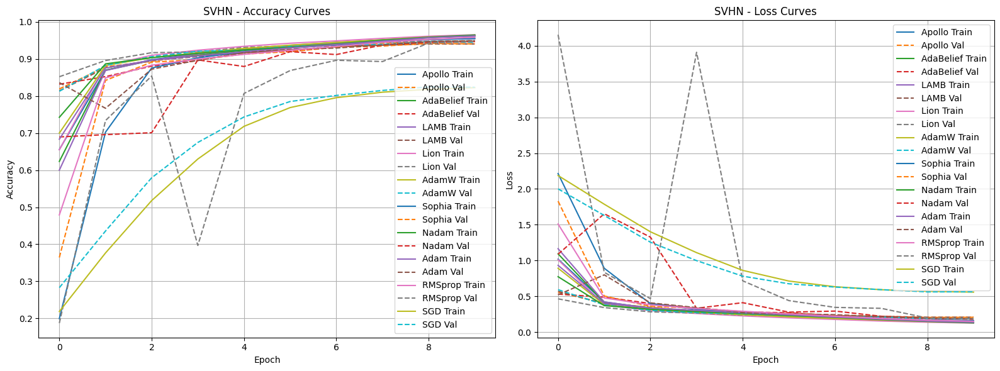

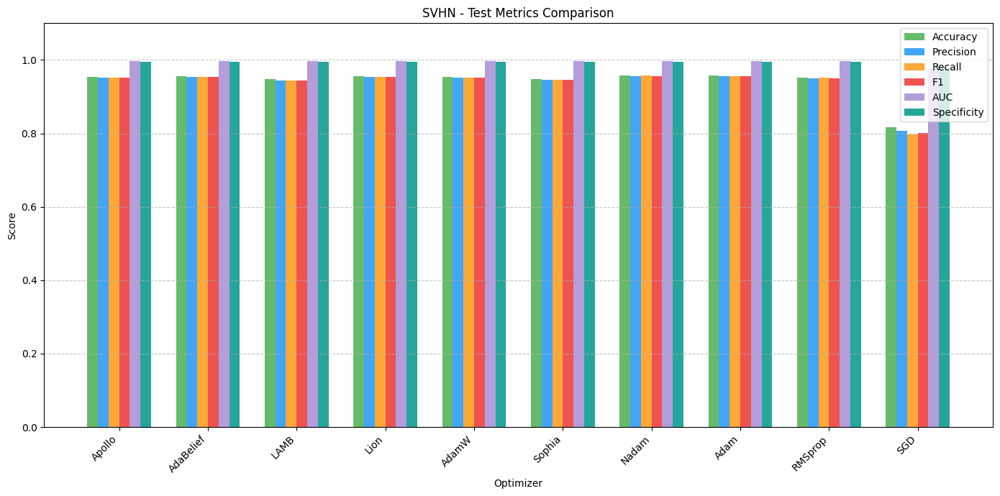

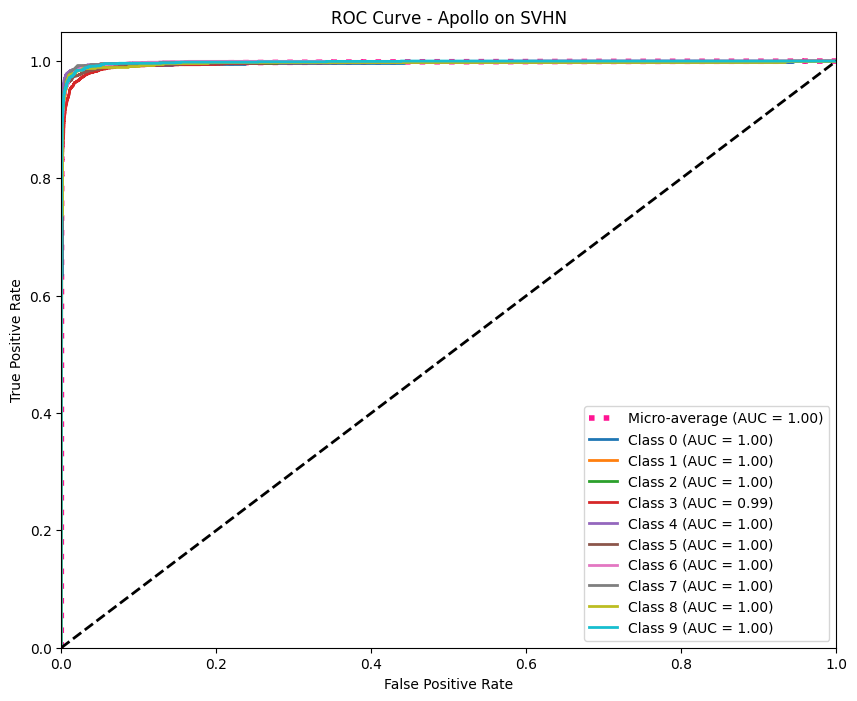

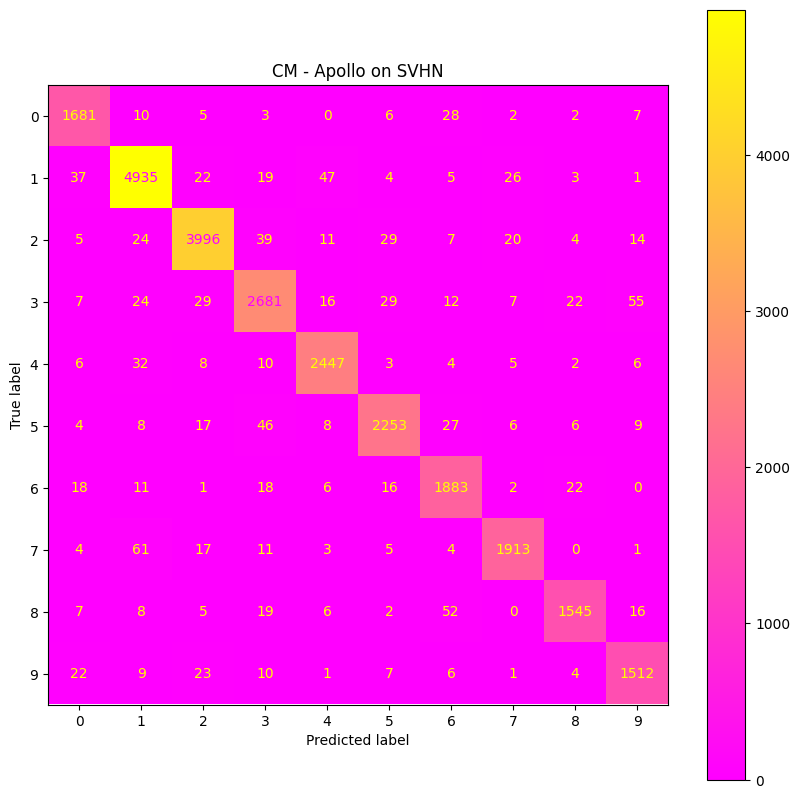

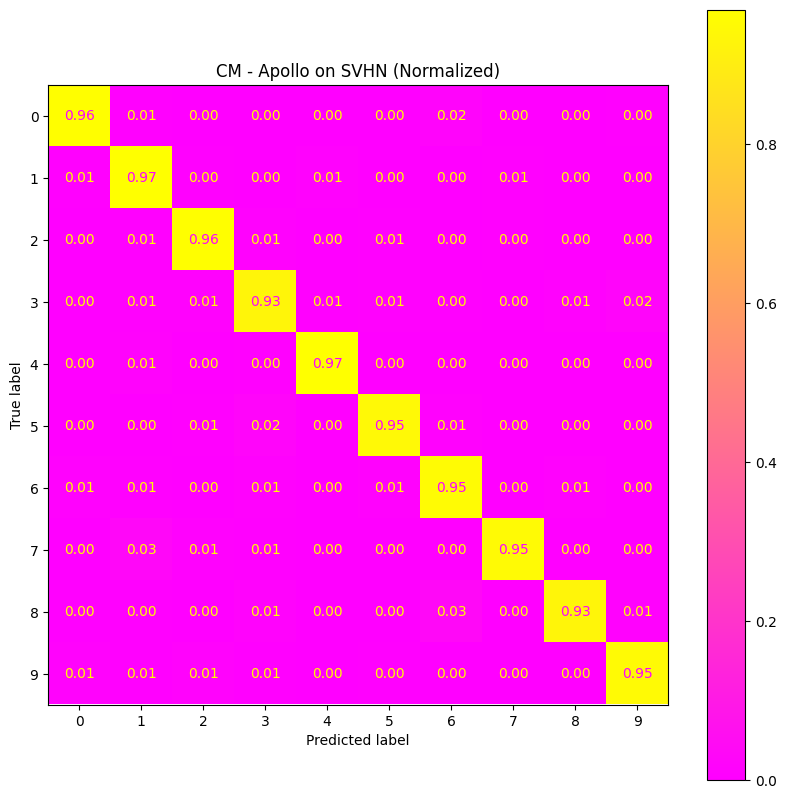

...

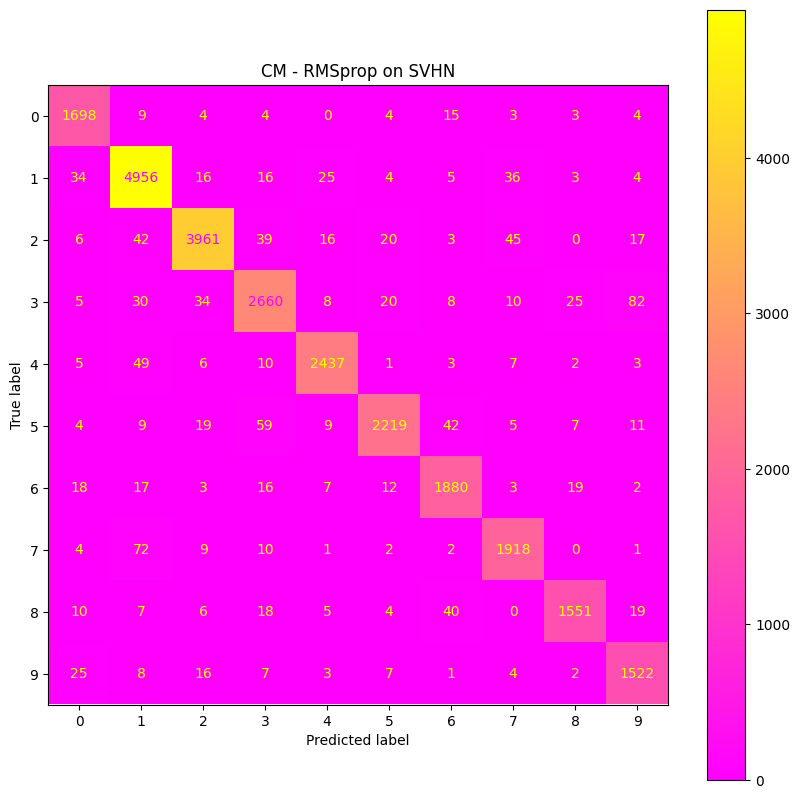

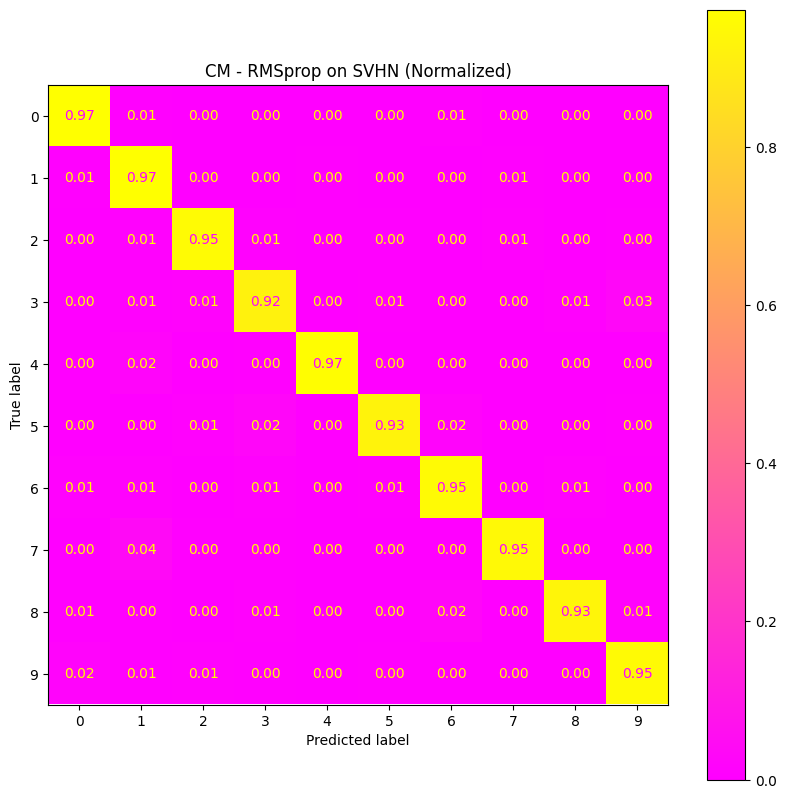

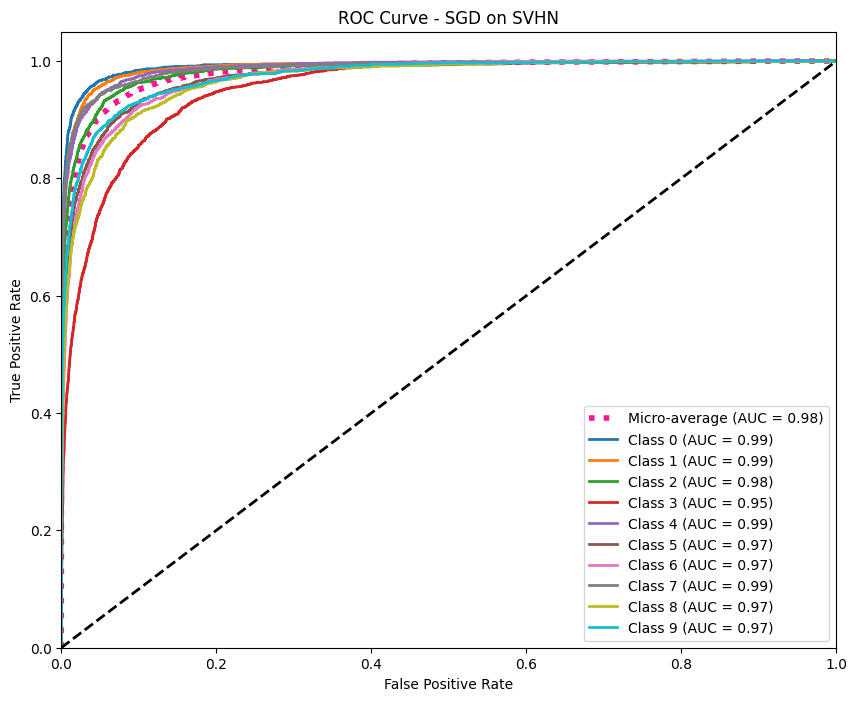

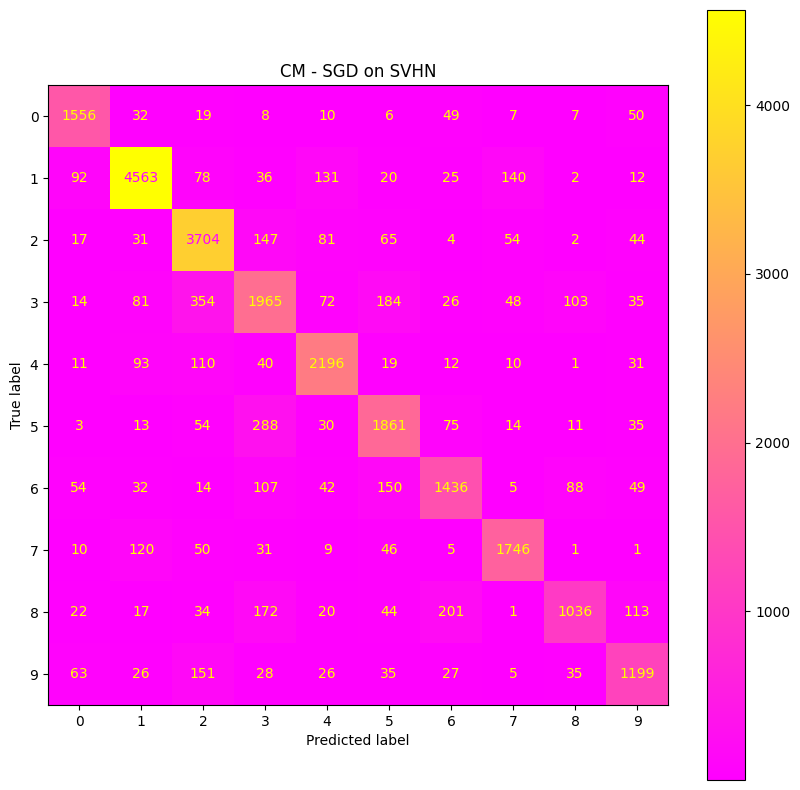

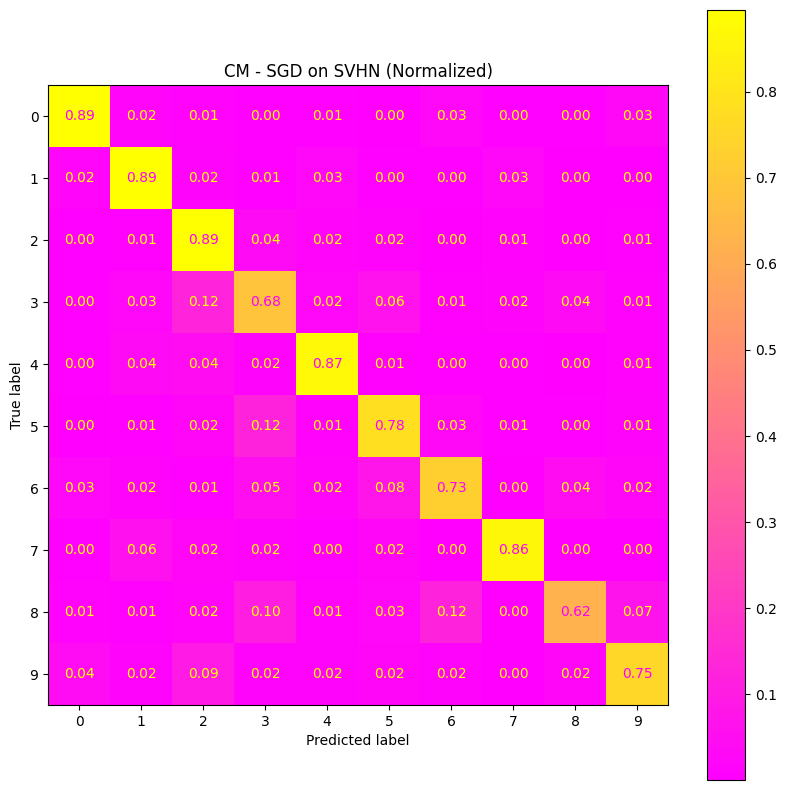


=== LaTeX Table for SVHN ===

\begin{table}[H]
\centering
\begin{tabular}{lcccccccc}\toprule
Optimizer & Test Loss & Test Acc & Precision & Recall & F1 & AUC & Specificity & Avg Epoch Time (s) \\ \midrule
Apollo & 0.1672 & 0.9544 & 0.9515 & 0.9519 & 0.9516 & 0.9969 & 0.9949 & 76.86 \\
AdaBelief & 0.1605 & 0.9562 & 0.9546 & 0.9529 & 0.9537 & 0.9971 & 0.9950 & 73.60 \\
LAMB & 0.1877 & 0.9482 & 0.9442 & 0.9449 & 0.9444 & 0.9965 & 0.9942 & 79.87 \\
Lion & 0.1634 & 0.9563 & 0.9545 & 0.9535 & 0.9540 & 0.9970 & 0.9951 & 72.32 \\
AdamW & 0.1648 & 0.9547 & 0.9525 & 0.9519 & 0.9522 & 0.9971 & 0.9949 & 72.60 \\
Sophia & 0.1823 & 0.9482 & 0.9462 & 0.9455 & 0.9458 & 0.9967 & 0.9941 & 72.84 \\
Nadam & 0.1535 & 0.9576 & 0.9551 & 0.9569 & 0.9560 & 0.9972 & 0.9952 & 72.83 \\
Adam & 0.1560 & 0.9571 & 0.9553 & 0.9550 & 0.9551 & 0.9971 & 0.9952 & 72.40 \\
RMSprop & 0.1709 & 0.9528 & 0.9500 & 0.9509 & 0.9503 & 0.9969 & 0.9947 & 71.85 \\
SGD & 0.5677 & 0.8168 & 0.8070 & 0.7980 & 0.8009 & 0.9782 & 0.9794 & 

In [ ]:
import os
import random
import time
from collections import Counter
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import Optimizer
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, random_split
from sklearn.metrics import (
    precision_score, recall_score, f1_score, confusion_matrix,
    ConfusionMatrixDisplay, roc_curve, auc, roc_auc_score
)
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
from typing import Iterable, Tuple, Optional
from itertools import cycle

# ---------------------------
# Setup & Reproducibility
# ---------------------------
def set_seed(seed: int = 42):
    """Sets the random seed for reproducibility across libraries."""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False

print("Setting random seed for reproducibility...", flush=True)
set_seed()

# Global settings
NUM_EPOCHS = 10
RESULTS_DIR = "results_svhn"
os.makedirs(RESULTS_DIR, exist_ok=True)


# ---------------------------
# Optimizer Implementations
# ---------------------------

import torch
import torch.optim as optim
import torch.nn.functional as F

class Apollo(optim.Optimizer):
    """
    Implements the Apollo (Adaptive Policy for Optimizer-space Linear Linking) algorithm.
    """
    def __init__(self, params, lr=1e-3, betas=(0.9, 0.999, 0.9), eps=1e-8,
                 weight_decay=1e-2):
        if not 0.0 <= lr: raise ValueError(f"Invalid learning rate: {lr}")
        if not 0.0 <= eps: raise ValueError(f"Invalid epsilon value: {eps}")
        if not 0.0 <= betas[0] < 1.0: raise ValueError(f"Invalid beta_1: {betas[0]}")
        if not 0.0 <= betas[1] < 1.0: raise ValueError(f"Invalid beta_2: {betas[1]}")
        if not 0.0 <= betas[2] < 1.0: raise ValueError(f"Invalid beta_3 for adaptation: {betas[2]}")
        if not 0.0 <= weight_decay: raise ValueError(f"Invalid weight_decay value: {weight_decay}")

        defaults = dict(lr=lr, betas=betas, eps=eps, weight_decay=weight_decay)
        super(Apollo, self).__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()

        for group in self.param_groups:
            beta1, beta2, beta3 = group['betas']

            for p in group['params']:
                if p.grad is None: continue
                grad = p.grad
                if grad.is_sparse: raise RuntimeError('Apollo does not support sparse gradients.')

                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['exp_avg'] = torch.zeros_like(p, memory_format=torch.preserve_format)
                    state['exp_avg_sq'] = torch.zeros_like(p, memory_format=torch.preserve_format)
                    # New state for tracking update agreement (smoothed cosine similarity)
                    state['update_agreement'] = torch.zeros((), device=p.device)


                exp_avg, exp_avg_sq = state['exp_avg'], state['exp_avg_sq']
                state['step'] += 1

                # Decoupled weight decay (AdamW style)
                if group['weight_decay'] != 0:
                    p.add_(p, alpha=-group['weight_decay'] * group['lr'])

                # Update biased first and second moment estimates
                exp_avg.mul_(beta1).add_(grad, alpha=1 - beta1)
                exp_avg_sq.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)

                # Bias correction
                bias_correction1 = 1 - beta1 ** state['step']
                bias_correction2 = 1 - beta2 ** state['step']

                m_hat = exp_avg / bias_correction1
                v_hat = exp_avg_sq / bias_correction2

                # --- High-Novelty Adaptive Mechanism ---
                # 1. Calculate the two candidate updates
                denom = v_hat.sqrt().add_(group['eps'])
                update_adam = m_hat / denom
                update_lion = torch.sign(m_hat)

                # 2. Measure agreement using cosine similarity
                # Use a small epsilon in norm to prevent division by zero for zero-updates
                cos_sim = F.cosine_similarity(update_adam.flatten(), update_lion.flatten(), dim=0, eps=1e-10)

                # 3. Smooth the agreement factor using an EMA
                state['update_agreement'].mul_(beta3).add_(cos_sim, alpha=1 - beta3)

                # 4. Dynamically set gamma based on smoothed agreement
                # This maps the cosine similarity from [-1, 1] to a gamma in [0, 1]
                gamma = (state['update_agreement'] + 1) / 2.0
                # ----------------------------------------

                # Interpolate between the two updates using the DYNAMIC gamma
                final_update = (1 - gamma) * update_adam + gamma * update_lion

                # Apply the final update
                p.add_(final_update, alpha=-group['lr'])

        return loss


class AdaBelief(Optimizer):
    """Implements AdaBelief algorithm."""
    def __init__(self, params, lr=1e-3, betas=(0.9, 0.999), eps=1e-8, weight_decay=1e-3, rectify=True):
        defaults = dict(lr=lr, betas=betas, eps=eps, weight_decay=weight_decay, rectify=rectify)
        super(AdaBelief, self).__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()

        for group in self.param_groups:
            lr, beta1, beta2, eps, wd, rectify = group['lr'], group['betas'][0], group['betas'][1], group['eps'], group['weight_decay'], group['rectify']
            for p in group['params']:
                if p.grad is None: continue
                grad = p.grad
                if grad.is_sparse: raise RuntimeError('AdaBelief does not support sparse gradients')
                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m'] = torch.zeros_like(p)
                    state['s'] = torch.zeros_like(p)
                m, s = state['m'], state['s']
                state['step'] += 1
                step = state['step']
                if wd != 0: p.mul_(1.0 - lr * wd)
                m.mul_(beta1).add_(grad, alpha=1 - beta1)
                grad_residual = grad - m
                s.mul_(beta2).addcmul_(grad_residual, grad_residual, value=1 - beta2)
                bias_corr1, bias_corr2 = 1 - beta1 ** step, 1 - beta2 ** step
                m_hat, s_hat = m / bias_corr1, s / bias_corr2
                if rectify:
                    rho_inf = 2 / (1 - beta2) - 1
                    rho_t = rho_inf - 2 * step * (beta2 ** step) / (1 - beta2 ** step)
                    if rho_t > 5.0:
                        rect = ((rho_t - 4) * (rho_t - 2) * rho_inf / ((rho_inf - 4) * (rho_inf - 2) * rho_t)) ** 0.5
                        denom = (s_hat.sqrt() + eps)
                        p.addcdiv_(m_hat, denom, value=-lr * rect)
                    else:
                        p.add_(m_hat, alpha=-lr)
                else:
                    denom = (s_hat.sqrt() + eps)
                    p.addcdiv_(m_hat, denom, value=-lr)
        return loss

class Sophia(Optimizer):
    """Implements Sophia algorithm."""
    def __init__(self, params, lr=1e-3, beta1=0.965, beta2=0.99, rho=0.04, weight_decay=1e-3, eps=1e-8):
        defaults = dict(lr=lr, beta1=beta1, beta2=beta2, rho=rho, weight_decay=weight_decay, eps=eps)
        super(Sophia, self).__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure=None):
        loss = closure() if closure is not None else None
        for group in self.param_groups:
            for p in group['params']:
                if p.grad is None: continue
                grad = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state['step'] = 0
                    state['m'] = torch.zeros_like(p)
                    state['hess_ema'] = torch.ones_like(p)
                m, hess_ema = state['m'], state['hess_ema']
                beta1, beta2, rho, lr, wd, eps = group['beta1'], group['beta2'], group['rho'], group['lr'], group['weight_decay'], group['eps']
                m.mul_(beta1).add_(grad, alpha=1 - beta1)
                hess_ema.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)
                denom = hess_ema.add(eps)
                scaled_grad = torch.clamp(m / denom, -rho, rho)
                if wd != 0: p.data.mul_(1 - lr * wd)
                p.add_(scaled_grad, alpha=-lr)
                state['step'] += 1
        return loss

class Lion(Optimizer):
    """Implements Lion algorithm."""
    def __init__(self, params, lr=1e-4, betas=(0.9, 0.99), weight_decay=0.0):
        if lr <= 0.0: raise ValueError(f"Invalid learning rate: {lr}")
        if not 0.0 <= betas[0] < 1.0: raise ValueError(f"Invalid beta1: {betas[0]}")
        if not 0.0 <= betas[1] < 1.0: raise ValueError(f"Invalid beta2: {betas[1]}")
        if weight_decay < 0.0: raise ValueError(f"Invalid weight_decay: {weight_decay}")
        defaults = dict(lr=lr, betas=betas, weight_decay=weight_decay)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure: Optional[callable] = None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()
        for group in self.param_groups:
            for p in group["params"]:
                if p.grad is None: continue
                grad = p.grad
                if group["weight_decay"] != 0:
                    p.mul_(1 - group["lr"] * group["weight_decay"])
                state = self.state[p]
                if len(state) == 0:
                    state["exp_avg"] = torch.zeros_like(p)
                exp_avg = state["exp_avg"]
                update = exp_avg.mul(group["betas"][0]).add(grad, alpha=1 - group["betas"][0])
                p.add_(update.sign(), alpha=-group["lr"])
                exp_avg.mul_(group["betas"][1]).add_(grad, alpha=1 - group["betas"][1])
        return loss

class LAMB(Optimizer):
    """Implements LAMB optimizer."""
    def __init__(
        self, params: Iterable[torch.nn.Parameter], lr: float = 1e-3,
        betas: Tuple[float, float] = (0.9, 0.999), eps: float = 1e-6,
        weight_decay: float = 0.0, clamp_trust_ratio: Optional[Tuple[float, float]] = (0.0, 10.0)
    ):
        defaults = dict(lr=lr, betas=betas, eps=eps, weight_decay=weight_decay, clamp_trust_ratio=clamp_trust_ratio)
        super().__init__(params, defaults)

    @torch.no_grad()
    def step(self, closure: Optional[callable] = None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()
        for group in self.param_groups:
            for p in group["params"]:
                if p.grad is None: continue
                grad = p.grad
                state = self.state[p]
                if len(state) == 0:
                    state["step"] = 0
                    state["exp_avg"] = torch.zeros_like(p)
                    state["exp_avg_sq"] = torch.zeros_like(p)
                exp_avg, exp_avg_sq = state["exp_avg"], state["exp_avg_sq"]
                state["step"] += 1
                beta1, beta2 = group["betas"]
                exp_avg.mul_(beta1).add_(grad, alpha=1 - beta1)
                exp_avg_sq.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)
                bias_c1 = 1 - beta1 ** state["step"]
                bias_c2 = 1 - beta2 ** state["step"]
                m_hat = exp_avg / bias_c1
                v_hat = exp_avg_sq / bias_c2
                denom = v_hat.sqrt().add_(group["eps"])
                update = m_hat / denom
                if group["weight_decay"] != 0:
                    update.add_(p, alpha=group["weight_decay"])
                w_norm = p.norm(p=2)
                u_norm = update.norm(p=2)
                trust_ratio = (w_norm / u_norm).item() if w_norm > 0 and u_norm > 0 else 1.0
                if group["clamp_trust_ratio"] is not None:
                    lo, hi = group["clamp_trust_ratio"]
                    trust_ratio = max(lo, min(trust_ratio, hi))
                p.add_(update, alpha=-group["lr"] * trust_ratio)
        return loss

# ---------------------------
# Model and Data for SVHN
# ---------------------------
def get_resnet18_svhn():
    """Returns a ResNet-18 model adapted for SVHN."""
    model = models.resnet18(weights=None, num_classes=10)
    # Adapt for 32x32 images
    model.conv1 = nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1, bias=False)
    model.maxpool = nn.Identity()
    return model

def get_svhn_loaders(batch_size=128, data_root="./data"):
    """Creates and returns SVHN DataLoaders."""
    # Mean and std for SVHN dataset, from the previous immersive
    normalize_transform = transforms.Normalize((0.4377, 0.4438, 0.4728), (0.1980, 0.2010, 0.1970))

    transform_train = transforms.Compose([
        transforms.RandomCrop(32, padding=4),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        normalize_transform,
    ])

    transform_test = transforms.Compose([
        transforms.ToTensor(),
        normalize_transform,
    ])

    train_dataset = datasets.SVHN(root=data_root, split="train", download=True, transform=transform_train)
    test_dataset = datasets.SVHN(root=data_root, split="test", download=True, transform=transform_test)

    train_size = int(0.9 * len(train_dataset))
    val_size = len(train_dataset) - train_size
    train_subset, val_subset = random_split(train_dataset, [train_size, val_size])

    train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True, num_workers=2, pin_memory=True)
    val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)

    return train_loader, val_loader, test_loader

# ---------------------------
# Training and Evaluation
# ---------------------------
def train_model(model_fn, optimizer_factory, train_loader, val_loader, test_loader,
                num_epochs=15, dataset_name="SVHN", run_name="default"):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model_fn().to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optimizer_factory(model.parameters())
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)

    history = { 'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': [] }
    start_time = time.time()

    print(f"Training {run_name} on {dataset_name} for {num_epochs} epochs on {device}...")

    for epoch in range(num_epochs):
        epoch_start = time.time()
        model.train()
        train_loss, train_correct, train_total = 0.0, 0, 0
        for data, targets in train_loader:
            data, targets = data.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(data)
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * data.size(0)
            _, preds = outputs.max(1)
            train_total += targets.size(0)
            train_correct += preds.eq(targets).sum().item()

        history['train_loss'].append(train_loss / train_total)
        history['train_acc'].append(train_correct / train_total)

        model.eval()
        val_loss, val_correct, val_total = 0.0, 0, 0
        with torch.no_grad():
            for data, targets in val_loader:
                data, targets = data.to(device), targets.to(device)
                outputs = model(data)
                loss = criterion(outputs, targets)
                val_loss += loss.item() * data.size(0)
                _, preds = outputs.max(1)
                val_total += targets.size(0)
                val_correct += preds.eq(targets).sum().item()

        history['val_loss'].append(val_loss / val_total)
        history['val_acc'].append(val_correct / val_total)

        print(f"Epoch {epoch+1}/{num_epochs} | Train Loss: {history['train_loss'][-1]:.4f}, Acc: {history['train_acc'][-1]:.4f} | "
              f"Val Loss: {history['val_loss'][-1]:.4f}, Acc: {history['val_acc'][-1]:.4f} | Time: {time.time() - epoch_start:.2f}s")
        scheduler.step()

    # --- Test Phase ---
    model.eval()
    all_preds, all_targets, all_probs = [], [], []
    test_loss_sum = 0.0
    with torch.no_grad():
        for data, targets in test_loader:
            data, targets = data.to(device), targets.to(device)
            outputs = model(data)
            loss = criterion(outputs, targets)
            test_loss_sum += loss.item() * data.size(0)
            _, preds = outputs.max(1)
            all_preds.extend(preds.cpu().numpy())
            all_targets.extend(targets.cpu().numpy())
            all_probs.extend(torch.softmax(outputs, dim=1).cpu().numpy())

    # --- Final Metrics Calculation ---
    final_metrics = {}
    all_preds = np.array(all_preds)
    all_targets = np.array(all_targets)
    all_probs = np.array(all_probs)

    final_metrics['test_loss'] = test_loss_sum / len(all_targets)
    final_metrics['test_acc'] = (all_preds == all_targets).mean()
    final_metrics['test_precision'] = precision_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_recall'] = recall_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_f1'] = f1_score(all_targets, all_preds, average='macro', zero_division=0)
    final_metrics['test_auc'] = roc_auc_score(all_targets, all_probs, multi_class='ovr')

    cm = confusion_matrix(all_targets, all_preds)
    specificity = []
    for i in range(cm.shape[0]):
        tn = cm.sum() - (cm[i, :].sum() + cm[:, i].sum() - cm[i, i])
        fp = cm[:, i].sum() - cm[i, i]
        specificity.append(tn / (tn + fp + 1e-8))
    final_metrics['test_specificity'] = np.mean(specificity)

    final_metrics['runtime'] = time.time() - start_time
    final_metrics['avg_epoch_time'] = final_metrics['runtime'] / num_epochs
    final_metrics['targets'] = all_targets
    final_metrics['preds'] = all_preds
    final_metrics['probs'] = all_probs

    print(f"\nFinal Test Results for {run_name}: Acc: {final_metrics['test_acc']:.4f}, F1: {final_metrics['test_f1']:.4f}, AUC: {final_metrics['test_auc']:.4f}\n")

    return {**history, **final_metrics}

# ---------------------------
# Optimizer Registry
# ---------------------------

optimizers = {
    'Apollo': lambda params: Apollo(params,  lr=1e-3, betas=(0.9, 0.999, 0.9), eps=1e-8,
                     weight_decay=1e-4),
    'AdaBelief': lambda params: AdaBelief(params, lr=1e-3, weight_decay=1e-4),
    'LAMB': lambda params: LAMB(params, lr=1e-3, weight_decay=1e-4),
    'Lion': lambda params: Lion(params, lr=1e-3, weight_decay=1e-4),
    'AdamW': lambda params: optim.AdamW(params, lr=1e-3, weight_decay=1e-4),
    'Sophia': lambda params: Sophia(params, lr=1e-3, weight_decay=1e-4),
    'Nadam': lambda params: optim.NAdam(params, lr=1e-3, weight_decay=1e-4),
    'Adam': lambda params: optim.Adam(params, lr=1e-3, weight_decay=1e-4),
    'RMSprop': lambda params: optim.RMSprop(params, lr=1e-3, weight_decay=1e-4),
    'SGD': lambda params: optim.SGD(params, lr=1e-3, momentum=0.9, weight_decay=1e-4),
}

# ---------------------------
# Plotting, Saving, and Table Utilities
# ---------------------------
def plot_learning_curves(results, dataset_name, save_path=None):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    for opt_name, metrics in results.items():
        ax1.plot(metrics['train_acc'], label=f'{opt_name} Train', linestyle='-')
        ax1.plot(metrics['val_acc'], label=f'{opt_name} Val', linestyle='--')
    ax1.set_title(f'{dataset_name} - Accuracy Curves'); ax1.set_xlabel('Epoch'); ax1.set_ylabel('Accuracy'); ax1.legend(); ax1.grid(True)
    for opt_name, metrics in results.items():
        ax2.plot(metrics['train_loss'], label=f'{opt_name} Train', linestyle='-')
        ax2.plot(metrics['val_loss'], label=f'{opt_name} Val', linestyle='--')
    ax2.set_title(f'{dataset_name} - Loss Curves'); ax2.set_xlabel('Epoch'); ax2.set_ylabel('Loss'); ax2.legend(); ax2.grid(True)
    plt.tight_layout()
    if save_path: plt.savefig(save_path)
    plt.show()

def plot_test_metrics(results, dataset_name, save_path=None):
    metrics_list = ['test_acc', 'test_precision', 'test_recall', 'test_f1', 'test_auc', 'test_specificity']
    metric_names = ['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Specificity']

    # Beautiful color palette (only change)
    colors = ['#66BB6A', '#42A5F5', '#FFA737', '#EF5350', '#B39DDB', '#26A69A']
    plt.figure(figsize=(14, 7))
    bar_width = 0.12
    x = np.arange(len(results))

    for i, metric in enumerate(metrics_list):
        values = [results[opt][metric] for opt in results]
        plt.bar(x + i * bar_width, values, width=bar_width, label=metric_names[i], color=colors[i])

    plt.title(f'{dataset_name} - Test Metrics Comparison')
    plt.xlabel('Optimizer')
    plt.ylabel('Score')
    plt.xticks(x + bar_width * (len(metrics_list)/2 - 0.5), list(results.keys()), rotation=45, ha="right")
    plt.ylim(0, 1.1)
    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path)
    plt.show()

def plot_roc_curves(result, opt_name, class_names, dataset_name, save_path=None):
    probs, targets = result['probs'], result['targets']
    targets_bin = label_binarize(targets, classes=range(len(class_names)))
    fpr, tpr, roc_auc = {}, {}, {}
    for i in range(len(class_names)):
        fpr[i], tpr[i], _ = roc_curve(targets_bin[:, i], probs[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    fpr["micro"], tpr["micro"], _ = roc_curve(targets_bin.ravel(), probs.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    plt.figure(figsize=(10, 8))
    plt.plot(fpr["micro"], tpr["micro"], label=f'Micro-average (AUC = {roc_auc["micro"]:.2f})', color='deeppink', linestyle=':', linewidth=4)
    # Corrected MatplotlibDeprecationWarning
    colors = cycle(plt.get_cmap('tab10').colors)
    for i, color in zip(range(len(class_names)), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2, label=f'Class {class_names[i]} (AUC = {roc_auc[i]:.2f})')
    plt.plot([0, 1], [0, 1], 'k--', lw=2); plt.xlim([0.0, 1.0]); plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate'); plt.ylabel('True Positive Rate'); plt.title(f'ROC Curve - {opt_name} on {dataset_name}'); plt.legend(loc="lower right")
    if save_path: plt.savefig(save_path)
    plt.show()

def plot_confusion_matrix(result, opt_name, class_names, dataset_name, normalize=False, save_path=None):
    cm = confusion_matrix(result['targets'], result['preds'])
    title = f'CM - {opt_name} on {dataset_name}'
    if normalize:
        cm = cm.astype('float') / (cm.sum(axis=1)[:, np.newaxis] + 1e-8)
        title += ' (Normalized)'
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    fig, ax = plt.subplots(figsize=(10, 10))
    disp.plot(ax=ax, cmap='spring', values_format='.2f' if normalize else 'd')
    plt.title(title)
    if save_path: plt.savefig(save_path)
    plt.show()

def generate_latex_table(results, dataset_name):
    """Generates a LaTeX table with all relevant metrics."""
    header = (
        "\\begin{table}[H]\n\\centering\n"
        "\\begin{tabular}{lcccccccc}\\toprule\n"
        "Optimizer & Test Loss & Test Acc & Precision & Recall & F1 & AUC & Specificity & Avg Epoch Time (s) \\\\ \\midrule\n"
    )

    footer = (
        "\\bottomrule\n\\end{tabular}\n"
        f"\\caption{{Performance Metrics for {dataset_name}}}\n"
        f"\\label{{tab:{dataset_name.lower().replace('-', '_')}_perf}}\n"
        "\\end{table}"
    )

    rows = []
    for opt, m in results.items():
        rows.append(
            f"{opt} & {m['test_loss']:.4f} & {m['test_acc']:.4f} & "
            f"{m['test_precision']:.4f} & {m['test_recall']:.4f} & {m['test_f1']:.4f} & "
            f"{m['test_auc']:.4f} & {m['test_specificity']:.4f} & {m['avg_epoch_time']:.2f} \\\\"
        )

    return header + "\n".join(rows) + "\n" + footer

# ---------------------------
# Main Execution
# ---------------------------
if __name__ == "__main__":
    svhn_class_names = [str(i) for i in range(10)]
    train_loader, val_loader, test_loader = get_svhn_loaders()

    results_svhn = {}
    for opt_name, opt_factory in optimizers.items():
        results_svhn[opt_name] = train_model(
            get_resnet18_svhn, opt_factory, train_loader, val_loader, test_loader,
            num_epochs=NUM_EPOCHS, dataset_name="SVHN", run_name=opt_name
        )

    # --- Generate and Save Artifacts ---
    print("\n--- Generating and Saving All Artifacts for SVHN ---")
    plot_learning_curves(results_svhn, "SVHN", save_path=os.path.join(RESULTS_DIR, "svhn_learning_curves.png"))
    plot_test_metrics(results_svhn, "SVHN", save_path=os.path.join(RESULTS_DIR, "svhn_test_metrics.png"))

    for opt_name, result in results_svhn.items():
        plot_roc_curves(result, opt_name, svhn_class_names, "SVHN", save_path=os.path.join(RESULTS_DIR, f"roc_{opt_name}.png"))
        plot_confusion_matrix(result, opt_name, svhn_class_names, "SVHN", normalize=False, save_path=os.path.join(RESULTS_DIR, f"cm_raw_{opt_name}.png"))
        plot_confusion_matrix(result, opt_name, svhn_class_names, "SVHN", normalize=True, save_path=os.path.join(RESULTS_DIR, f"cm_norm_{opt_name}.png"))

    # --- Generate, Print, and Save LaTeX and TXT Table ---
    latex_table_str = generate_latex_table(results_svhn, "SVHN")
    print("\n=== LaTeX Table for SVHN ===\n")
    print(latex_table_str)

    # Save as .tex file
    tex_path = os.path.join(RESULTS_DIR, "svhn_results_table.tex")
    with open(tex_path, "w") as f:
        f.write(latex_table_str)
    print(f"LaTeX table saved to: {tex_path}")

    # Save as .txt file (without LaTeX commands for readability)
    txt_path = os.path.join(RESULTS_DIR, "svhn_results_summary.txt")
    with open(txt_path, "w") as f:
        f.write("Optimizer, Test Loss, Test Acc, Precision, Recall, F1, AUC, Specificity, Avg Epoch Time (s)\n")
        for opt, m in results_svhn.items():
             f.write(
                f"{opt}, {m['test_loss']:.4f}, {m['test_acc']:.4f}, "
                f"{m['test_precision']:.4f}, {m['test_recall']:.4f}, {m['test_f1']:.4f}, "
                f"{m['test_auc']:.4f}, {m['test_specificity']:.4f}, {m['avg_epoch_time']:.2f}\n"
             )
    print(f"Summary text file saved to: {txt_path}")


    print("\n--- Script Finished ---")


In [ ]:
from google.colab import files
import os
import zipfile

# Define the directory to zip
results_dir = "/content/results_svhn"
# Define the name for the zip file
zip_filename = "/content/results_svhn.zip"

# Create a ZipFile object
if os.path.exists(results_dir):
    with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
        # Walk through the directory and add files to the zip
        for root, _, files_in_dir in os.walk(results_dir):
            for file in files_in_dir:
                file_path = os.path.join(root, file)
                # Add file to zip, preserving directory structure
                zipf.write(file_path, os.path.relpath(file_path, results_dir))
    print(f"Successfully created {zip_filename}")

    # Download the zip file
    files.download(zip_filename)
else:
    print(f"Error: Directory '{results_dir}' not found.")

Successfully created /content/results_svhn.zip


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# !rm -rf results_svhn